# BTx623 BLIND-like data analysis
Using count data from 46 BTx623 panicle primorida, attempt to construct a developmental trajectory
    Raw count data is in ~/Desktop/BLIND/SHSL001/BLIND_BTx623_SHSL001/htseq

In [1]:
setwd("/Users/Home/Desktop/BLIND/SHSL001/BLIND_BTx623_SHSL001")

library(DESeq2)


Loading required package: S4Vectors
Loading required package: stats4
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, cbind, colMeans, colnames,
    colSums, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, lengths, Map, mapply, match,
    mget, order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rowMeans, rownames, rowSums, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which, which.max, which.min


Attaching packag

In [2]:
#create a count matrix from htseq count files
file_names <- list.files(path="./htseq", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="./htseq", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
counts <- cbind(counts, new_file) # add on the new column
colnames(counts) <- c(file_names[1:f]) # add on the new column's name
}

count <- head(counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Mergi

In [3]:
dim (count); head (count)

[1] 34129    47

,SHSL001_01_S1.count.txt,SHSL001_02_S2.count.txt,SHSL001_03_S3.count.txt,SHSL001_04_S4.count.txt,SHSL001_05_S5.count.txt,SHSL001_06_S6.count.txt,SHSL001_07_S7.count.txt,SHSL001_08_S8.count.txt,SHSL001_09_S9.count.txt,SHSL001_10_S10.count.txt,⋯,SHSL001_38_S38.count.txt,SHSL001_39_S39.count.txt,SHSL001_40_S40.count.txt,SHSL001_41_S41.count.txt,SHSL001_42_S42.count.txt,SHSL001_43_S43.count.txt,SHSL001_44_S44.count.txt,SHSL001_45_S45.count.txt,SHSL001_46_S46.count.txt,SHSL001_47_S47.count.txt
Sobic.001G000100.v3.2,2,2,1,6,1,1,0,0,6,2,⋯,0,0,0,1,0,0,2,0,6,0
Sobic.001G000200.v3.2,226,229,165,243,117,222,287,168,166,36,⋯,190,219,119,148,21,151,348,39,66,64
Sobic.001G000300.v3.2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
Sobic.001G000400.v3.2,377,308,320,373,105,220,239,262,254,73,⋯,238,259,121,251,24,202,578,82,166,65
Sobic.001G000501.v3.2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,1,2,2
Sobic.001G000700.v3.2,44,66,30,52,31,59,66,38,29,11,⋯,43,38,13,28,4,28,64,9,13,9


In [4]:
#stabilize varaince within libraries
dds <- DESeqDataSetFromMatrix(count, data.frame(colnames(count)), ~1, tidy = FALSE)
dds <- estimateSizeFactors(dds)
dds <- estimateDispersions(dds)
vsd <- varianceStabilizingTransformation(dds)
vsd_filtered <- assay(vsd)

write.table(vsd_filtered, "./deseq/vsd_nofilter.txt", sep="\t", quote=F, row.names=T)

gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [5]:
#compare the affect of VSD
head(count); head(vsd_filtered)

,SHSL001_01_S1.count.txt,SHSL001_02_S2.count.txt,SHSL001_03_S3.count.txt,SHSL001_04_S4.count.txt,SHSL001_05_S5.count.txt,SHSL001_06_S6.count.txt,SHSL001_07_S7.count.txt,SHSL001_08_S8.count.txt,SHSL001_09_S9.count.txt,SHSL001_10_S10.count.txt,⋯,SHSL001_38_S38.count.txt,SHSL001_39_S39.count.txt,SHSL001_40_S40.count.txt,SHSL001_41_S41.count.txt,SHSL001_42_S42.count.txt,SHSL001_43_S43.count.txt,SHSL001_44_S44.count.txt,SHSL001_45_S45.count.txt,SHSL001_46_S46.count.txt,SHSL001_47_S47.count.txt
Sobic.001G000100.v3.2,2,2,1,6,1,1,0,0,6,2,⋯,0,0,0,1,0,0,2,0,6,0
Sobic.001G000200.v3.2,226,229,165,243,117,222,287,168,166,36,⋯,190,219,119,148,21,151,348,39,66,64
Sobic.001G000300.v3.2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
Sobic.001G000400.v3.2,377,308,320,373,105,220,239,262,254,73,⋯,238,259,121,251,24,202,578,82,166,65
Sobic.001G000501.v3.2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,1,2,2
Sobic.001G000700.v3.2,44,66,30,52,31,59,66,38,29,11,⋯,43,38,13,28,4,28,64,9,13,9


,SHSL001_01_S1.count.txt,SHSL001_02_S2.count.txt,SHSL001_03_S3.count.txt,SHSL001_04_S4.count.txt,SHSL001_05_S5.count.txt,SHSL001_06_S6.count.txt,SHSL001_07_S7.count.txt,SHSL001_08_S8.count.txt,SHSL001_09_S9.count.txt,SHSL001_10_S10.count.txt,⋯,SHSL001_38_S38.count.txt,SHSL001_39_S39.count.txt,SHSL001_40_S40.count.txt,SHSL001_41_S41.count.txt,SHSL001_42_S42.count.txt,SHSL001_43_S43.count.txt,SHSL001_44_S44.count.txt,SHSL001_45_S45.count.txt,SHSL001_46_S46.count.txt,SHSL001_47_S47.count.txt
Sobic.001G000100.v3.2,5.735404,5.749199,5.695222,5.926548,5.712476,5.676156,5.502636,5.502636,6.032818,6.073868,⋯,5.502636,5.502636,5.502636,5.707546,5.502636,5.502636,5.722440,5.502636,6.162180,5.502636
Sobic.001G000200.v3.2,7.746555,7.869630,7.745502,7.917982,7.588044,7.829164,8.061895,7.807699,7.988090,7.717899,⋯,7.676958,7.805789,7.585666,7.760109,7.648346,7.772913,8.057630,7.570721,7.536530,7.787741
Sobic.001G000300.v3.2,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,⋯,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636
Sobic.001G000400.v3.2,8.261761,8.169756,8.424615,8.364297,7.493084,7.820460,7.878771,8.258697,8.438309,8.441299,⋯,7.890905,7.969993,7.600567,8.295005,7.772402,8.059777,8.607849,8.303686,8.457705,7.802526
Sobic.001G000501.v3.2,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,⋯,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.502636,5.861956,5.885623,5.948385
Sobic.001G000700.v3.2,6.571018,6.869102,6.536024,6.718768,6.642152,6.792844,6.848009,6.685855,6.644744,6.806258,⋯,6.610324,6.544411,6.244307,6.563748,6.507401,6.560440,6.711559,6.559588,6.464047,6.435634


In [6]:
dds <- DESeqDataSetFromMatrix(count, data.frame(colnames(count)), ~1, tidy = FALSE)
dds <- estimateSizeFactors(dds)
dds <- dds[ rowSums(counts(dds, normalized=TRUE) >= 5) > 46, ] #only consider detected genes, >= 5 RPM in more than 46 tissues
dds <- estimateDispersions(dds)
vsd <- varianceStabilizingTransformation(dds)
vsd_filtered <- assay(vsd)

write.table(vsd_filtered, "./deseq/vsd_46count_5min.txt", sep="\t", quote=F, row.names=T)

gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [7]:
dim(count); dim(vsd_filtered);
head(count); head(vsd_filtered);

[1] 34129    47

[1] 15841    47

,SHSL001_01_S1.count.txt,SHSL001_02_S2.count.txt,SHSL001_03_S3.count.txt,SHSL001_04_S4.count.txt,SHSL001_05_S5.count.txt,SHSL001_06_S6.count.txt,SHSL001_07_S7.count.txt,SHSL001_08_S8.count.txt,SHSL001_09_S9.count.txt,SHSL001_10_S10.count.txt,⋯,SHSL001_38_S38.count.txt,SHSL001_39_S39.count.txt,SHSL001_40_S40.count.txt,SHSL001_41_S41.count.txt,SHSL001_42_S42.count.txt,SHSL001_43_S43.count.txt,SHSL001_44_S44.count.txt,SHSL001_45_S45.count.txt,SHSL001_46_S46.count.txt,SHSL001_47_S47.count.txt
Sobic.001G000100.v3.2,2,2,1,6,1,1,0,0,6,2,⋯,0,0,0,1,0,0,2,0,6,0
Sobic.001G000200.v3.2,226,229,165,243,117,222,287,168,166,36,⋯,190,219,119,148,21,151,348,39,66,64
Sobic.001G000300.v3.2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
Sobic.001G000400.v3.2,377,308,320,373,105,220,239,262,254,73,⋯,238,259,121,251,24,202,578,82,166,65
Sobic.001G000501.v3.2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,1,2,2
Sobic.001G000700.v3.2,44,66,30,52,31,59,66,38,29,11,⋯,43,38,13,28,4,28,64,9,13,9


,SHSL001_01_S1.count.txt,SHSL001_02_S2.count.txt,SHSL001_03_S3.count.txt,SHSL001_04_S4.count.txt,SHSL001_05_S5.count.txt,SHSL001_06_S6.count.txt,SHSL001_07_S7.count.txt,SHSL001_08_S8.count.txt,SHSL001_09_S9.count.txt,SHSL001_10_S10.count.txt,⋯,SHSL001_38_S38.count.txt,SHSL001_39_S39.count.txt,SHSL001_40_S40.count.txt,SHSL001_41_S41.count.txt,SHSL001_42_S42.count.txt,SHSL001_43_S43.count.txt,SHSL001_44_S44.count.txt,SHSL001_45_S45.count.txt,SHSL001_46_S46.count.txt,SHSL001_47_S47.count.txt
Sobic.001G000200.v3.2,7.259251,7.423001,7.257834,7.486382,7.042817,7.369554,7.672074,7.341048,7.577380,7.220601,⋯,7.165023,7.338507,7.039520,7.277460,7.125928,7.294623,7.666631,7.018759,6.971031,7.314448
Sobic.001G000400.v3.2,7.923281,7.808550,8.122878,8.049446,6.909905,7.358007,7.435023,7.919484,8.139470,8.143091,⋯,7.450952,7.553989,7.060157,7.964376,7.293938,7.669372,8.342658,7.975076,8.162926,7.334162
Sobic.001G000700.v3.2,5.456373,5.963038,5.394270,5.712422,5.580881,5.837129,5.928459,5.656238,5.585375,5.859457,⋯,5.525457,5.409205,4.854501,5.443518,5.343053,5.437660,5.700158,5.436151,5.264751,5.212961
Sobic.001G000800.v3.2,8.108055,7.825569,8.071661,8.215125,8.043729,8.155522,8.218357,8.003112,8.304146,8.499784,⋯,7.901403,7.971959,8.053849,8.194142,8.202585,8.087246,8.100598,7.856688,7.906505,7.769777
Sobic.001G001300.v3.2,5.699194,5.994209,5.707070,5.635117,5.878515,6.028331,5.864430,5.705881,5.448712,5.293183,⋯,5.813847,5.971759,6.236263,5.475231,6.134845,5.671730,5.572601,6.121644,5.873908,6.058932
Sobic.001G001400.v3.2,8.517602,8.225456,8.497341,8.431215,8.120554,8.252010,8.285267,7.914410,8.443369,8.909512,⋯,7.869487,8.212416,7.505450,8.056758,8.284402,8.493213,8.595794,8.382393,8.301787,7.880966


#time for pretty pictures

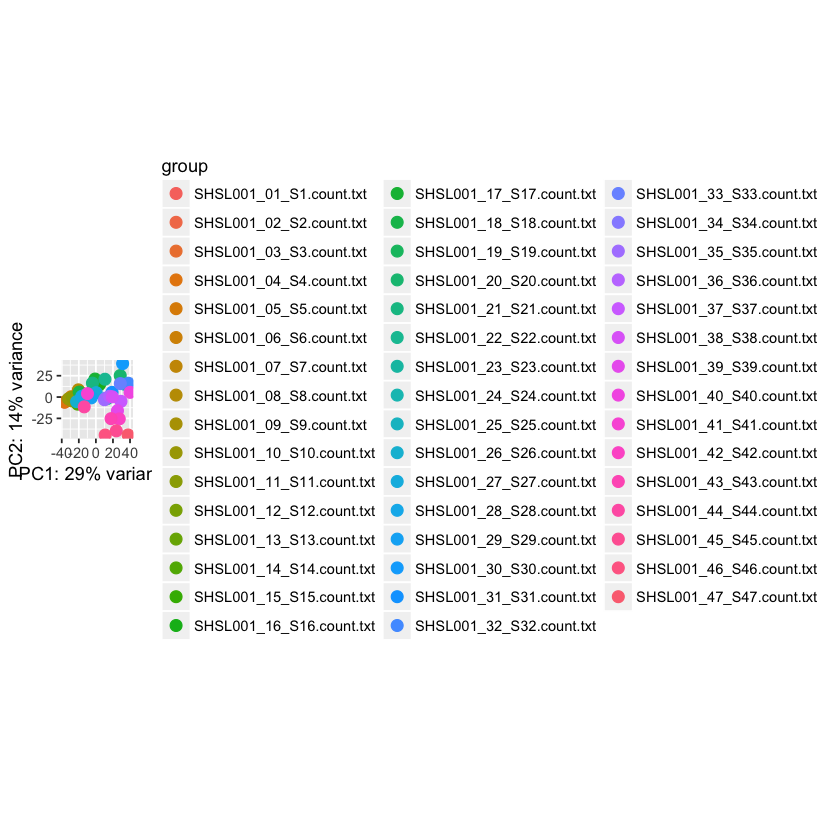

In [10]:
plotPCA(vsd, intgroup='colnames.count.', ntop=15000)

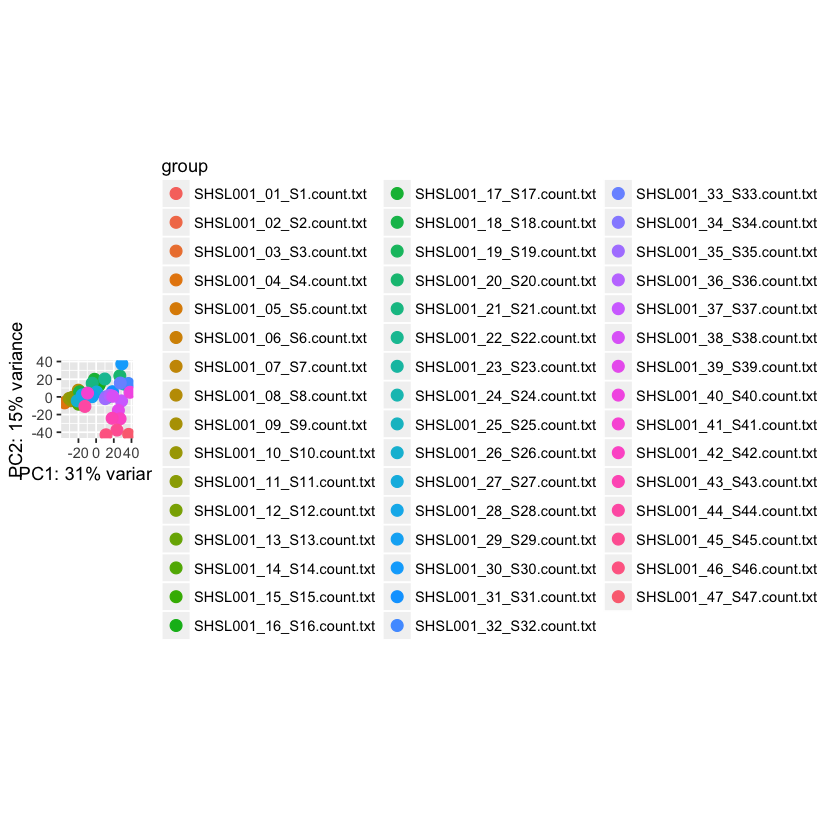

In [11]:
plotPCA(vsd, intgroup='colnames.count.', ntop=10000)

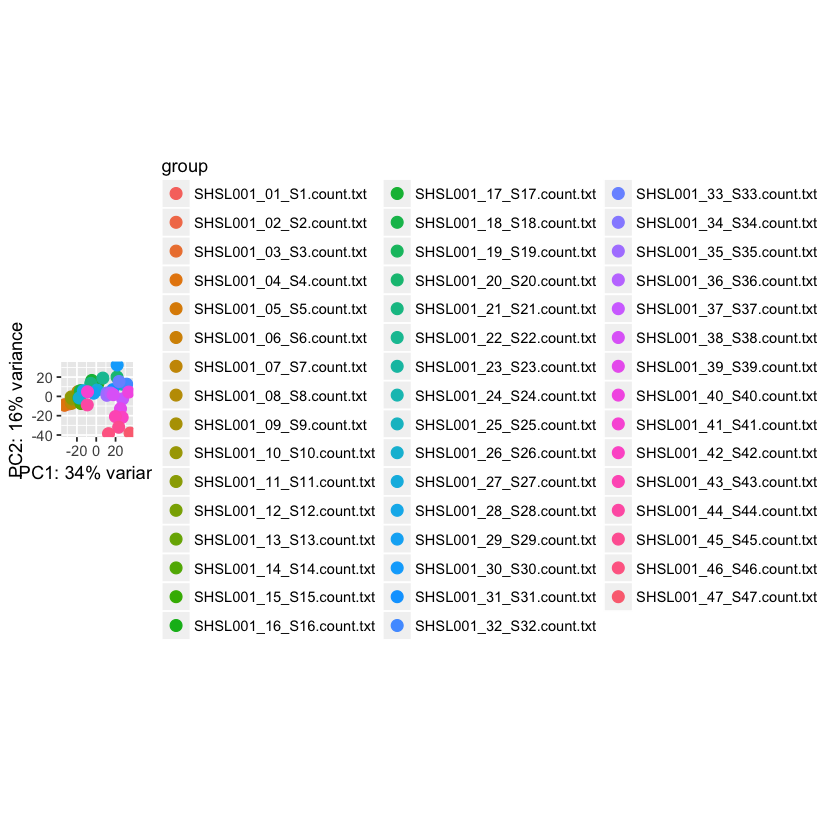

In [12]:
plotPCA(vsd, intgroup='colnames.count.', ntop=5000)

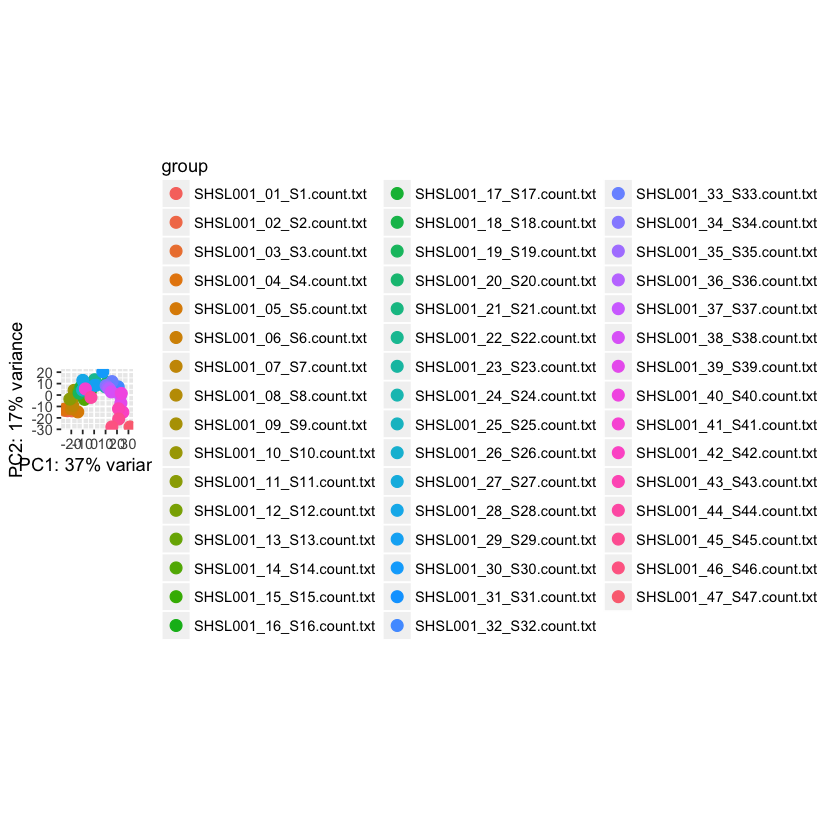

In [13]:
plotPCA(vsd, intgroup='colnames.count.', ntop=1500)

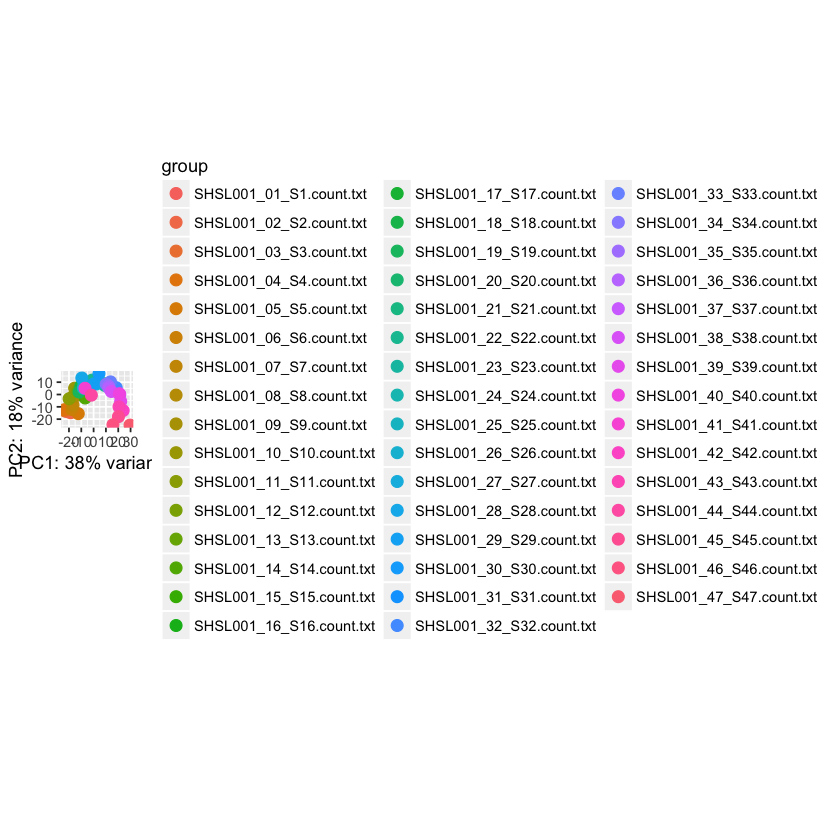

In [14]:
plotPCA(vsd, intgroup='colnames.count.', ntop=1000)

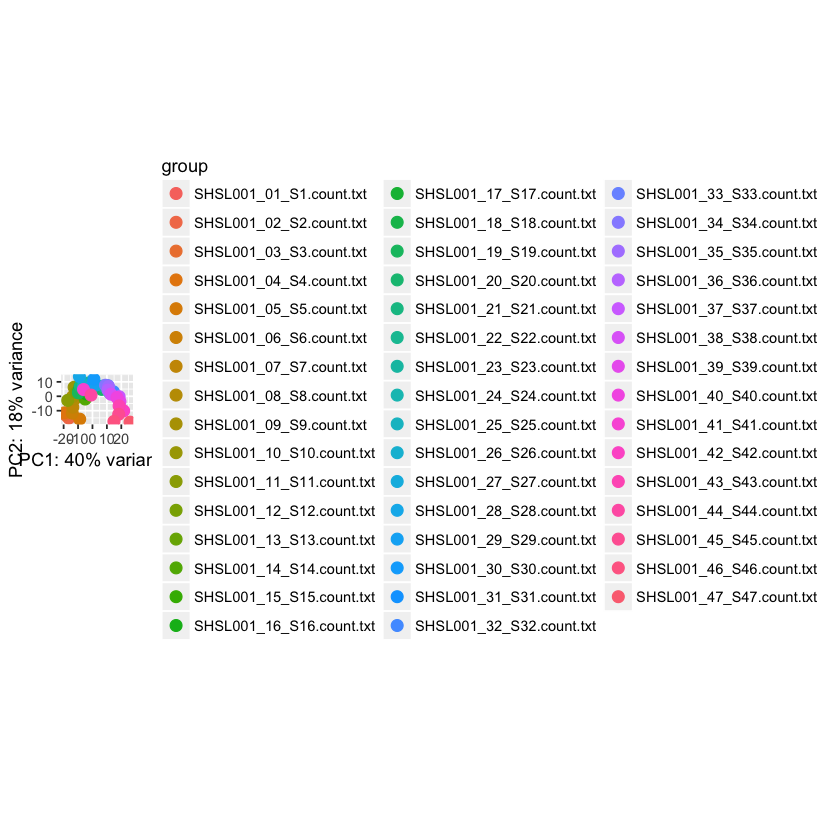

In [15]:
plotPCA(vsd, intgroup='colnames.count.', ntop=500)

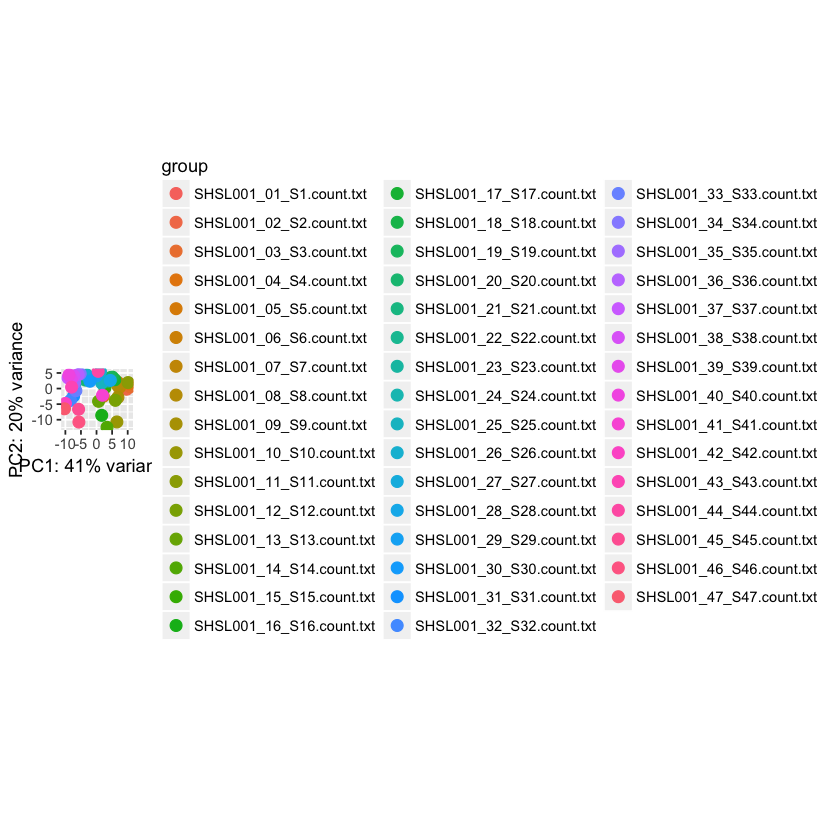

In [16]:
plotPCA(vsd, intgroup='colnames.count.', ntop=50)

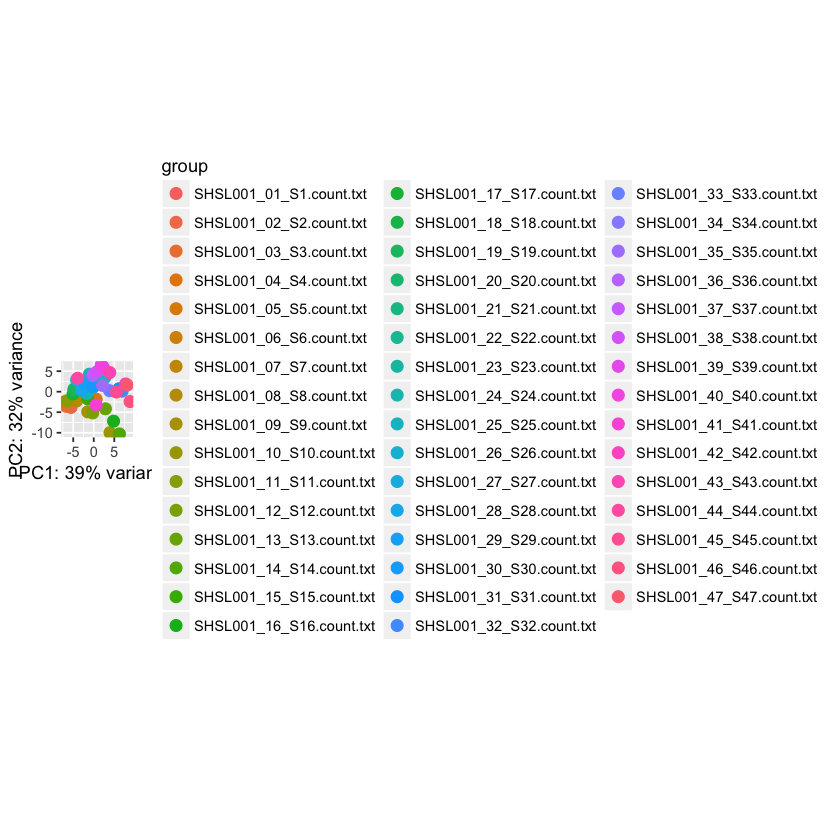

In [17]:
plotPCA(vsd, intgroup='colnames.count.', ntop=15)

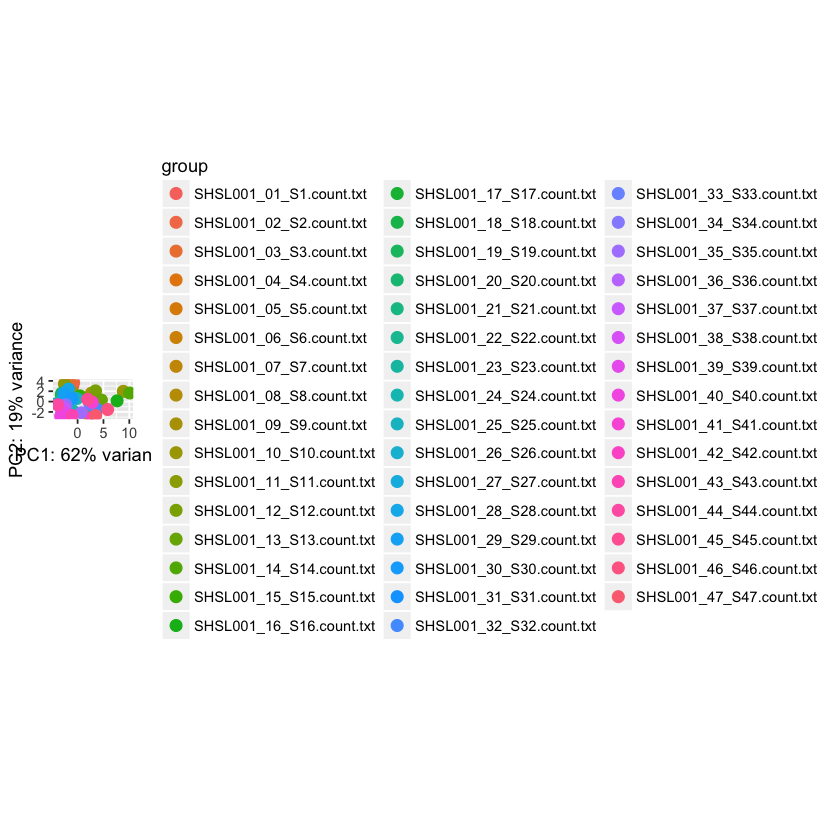

In [18]:
plotPCA(vsd, intgroup='colnames.count.', ntop=5)

In [19]:
pdf(file="./deseq/PCA_vsd46.5_15000.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=15000)
dev.off()

pdf(file="./deseq/PCA_vsd46.5_10000.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=10000)
dev.off()

pdf(file="./deseq/PCA_vsd46.5_5000.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=5000)
dev.off()

pdf(file="./deseq/PCA_vsd46.5_1500.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=1500)
dev.off()

pdf(file="./deseq/PCA_vsd46.5_1000.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=1000)
dev.off()

pdf(file="./deseq/PCA_vsd46.5_500.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=500)
dev.off()

pdf(file="./deseq/PCA_vsd46.5_50.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=50)
dev.off()

pdf(file="./deseq/PCA_vsd46.5_15.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=15)
dev.off()

pdf(file="./deseq/PCA_vsd46.5_5.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=5)
dev.off()

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

# it WORKED!!!!!
## 1500 gives the best rainbow arc
## should I try painting DAS?


In [8]:
#pick the genes with most variance
ntop <- 1500
# calculate the variance for each gene
require(genefilter)
rv <- rowVars(vsd_filtered)
# select the ntop genes by variance
select <- order(rv, decreasing=TRUE)[seq_len(min(ntop, length(rv)))]

selected_genes <- vsd_filtered[select,]

write.table(vsd_filtered, "./deseq/top1500_vsd46.5.txt", sep="\t", quote=F, row.names=T)

Loading required package: genefilter

Attaching package: ‘genefilter’

The following objects are masked from ‘package:matrixStats’:

    rowSds, rowVars



Loading required package: pheatmap
Warning message:
“package ‘pheatmap’ was built under R version 3.4.4”Loading required package: RColorBrewer


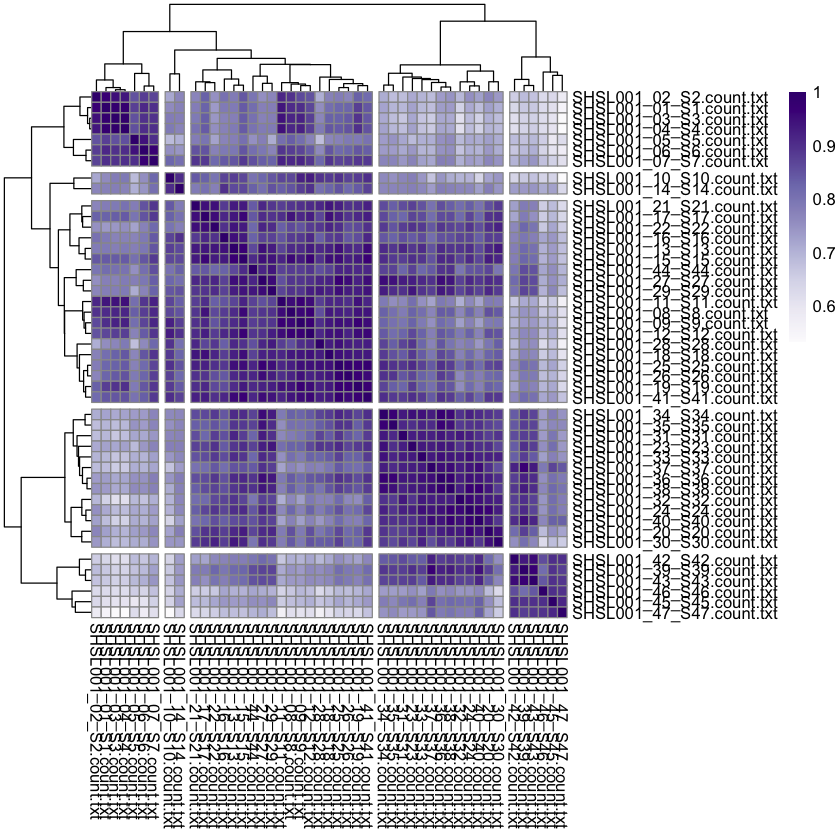

In [9]:
## Heat map and hiearch clust attempts

require("pheatmap")
require("RColorBrewer")
require("genefilter")

sampleDists <- as.dist((1-cor(selected_genes)))
sampleDistMatrix <- as.matrix( sampleDists )
#rownames(sampleDistMatrix) <- paste( rld$dex, rld$cell, sep = " - " )
#colnames(sampleDistMatrix) <- NULL
colors <- colorRampPalette( brewer.pal(9, "Purples") )(255)

pheatmap(1-sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         cluster_rows=TRUE, cluster_cols=TRUE,
         cutree_rows=5, cutree_cols=5,
         col = colors)

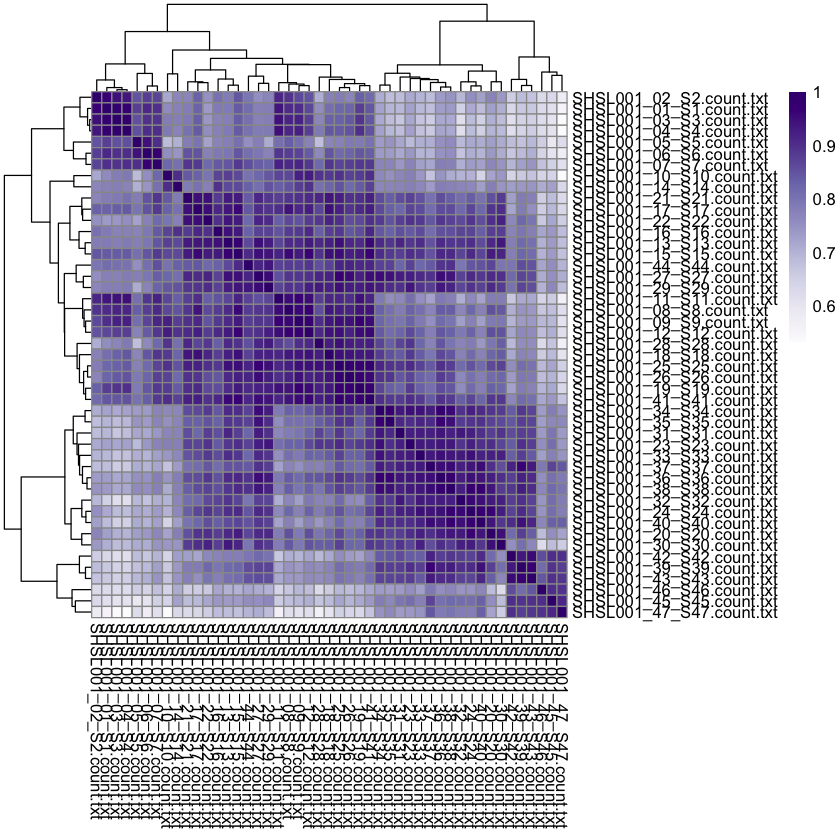

In [22]:
pheatmap(1-sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         cluster_rows=TRUE, cluster_cols=TRUE,
         col = colors)


Loading required package: genefilter

Attaching package: ‘genefilter’

The following objects are masked from ‘package:matrixStats’:

    rowSds, rowVars

Loading required package: ggplot2
Warning message:
“package ‘ggplot2’ was built under R version 3.4.4”

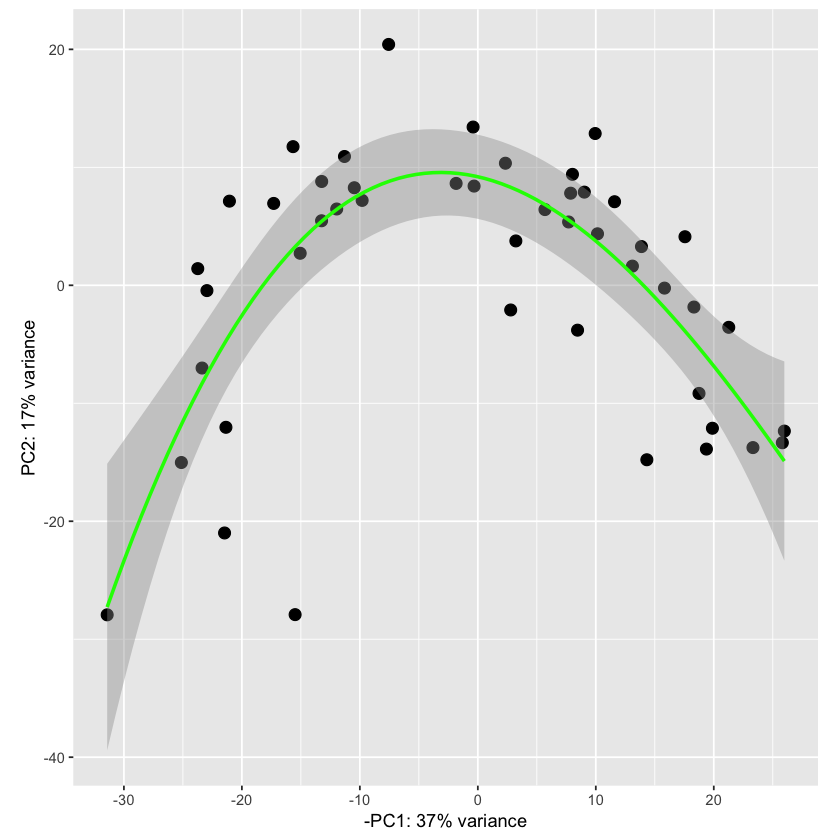

In [8]:
## copied from DESeq GitHub
#pick the genes with most variance

require("genefilter")
ntop <- 1500
object <- vsd
intgroup='colnames.count.'

# calculate the variance for each gene
rv <- rowVars(assay(object))
# select the ntop genes by variance
select <- order(rv, decreasing=TRUE)[seq_len(min(ntop, length(rv)))]
# perform a PCA on the data in assay(x) for the selected genes
pca <- prcomp(t(assay(object)[select,]))
# the contribution to the total variance for each component
percentVar <- pca$sdev^2 / sum( pca$sdev^2 )
if (!all(intgroup %in% names(colData(object)))) {
stop("the argument 'intgroup' should specify columns of colData(dds)")
}
intgroup.df <- as.data.frame(colData(object)[, intgroup, drop=FALSE])
# add the intgroup factors together to create a new grouping factor
group <- if (length(intgroup) > 1) {
factor(apply( intgroup.df, 1, paste, collapse=":"))
} else {
colData(object)[[intgroup]]
}
# assembly the data for the plot
d <- data.frame(PC1=pca$x[,1], PC2=pca$x[,2], group=group, intgroup.df, name=colnames(object))


require(ggplot2)

ggplot(data=d, aes(x=-PC1, y=PC2)) + geom_point(size=3) + 
	xlab(paste0("-PC1: ",round(percentVar[1] * 100),"% variance")) +
  	ylab(paste0("PC2: ",round(percentVar[2] * 100),"% variance")) +
	coord_fixed() +
	geom_smooth(method = "lm", formula = y ~ splines::bs(x, 3), color='green')



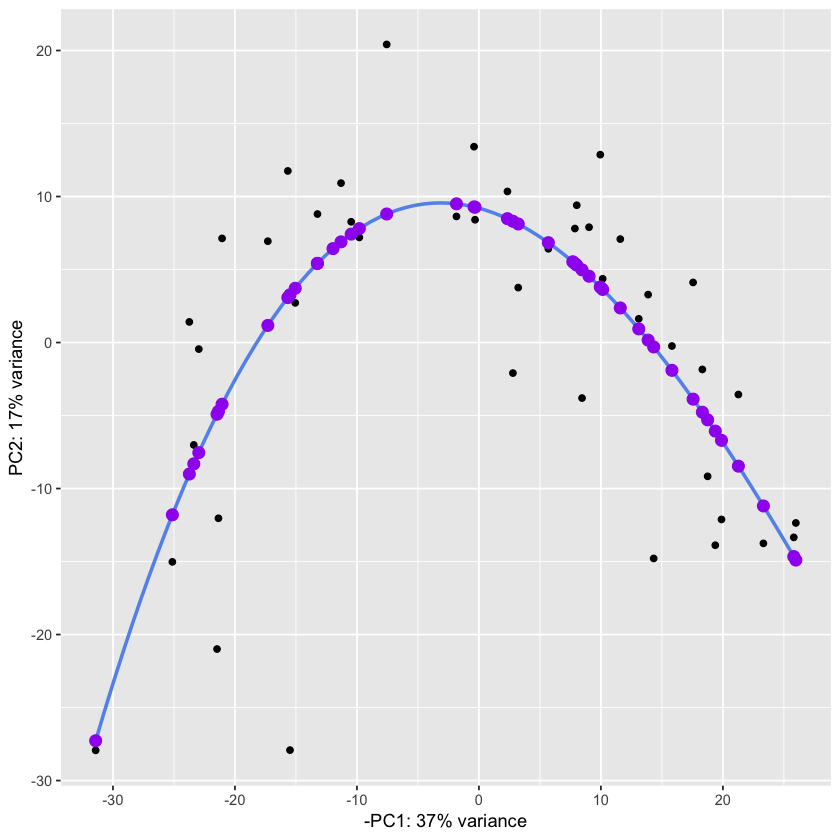

In [9]:
## Can you access developmental-expression time?

# first set up a lowess fit:
lfit <- loess(d$PC2~d$PC1, span=3)

# create a functional version of the lowess fit
lfun <- approxfun(lfit)
fitted <- lfun(d$PC1)
resid <- d$PC2-fitted

#try some splines instead
smod <- lm(formula = d$PC2 ~ splines::bs(d$PC1, 3)) 
sfit <- data.frame(predict(smod))
df <- data.frame(PC1 = d$PC1, PC2 = d$PC2, sfit, d$name)
colnames(df)[3:4] <- c("fit", "name")


ggplot(data=df, aes(x=-PC1, y=PC2)) + 
	xlab(paste0("-PC1: ",round(percentVar[1] * 100),"% variance")) +
  	ylab(paste0("PC2: ",round(percentVar[2] * 100),"% variance")) +
	geom_point() + 
	stat_smooth(method="lm", formula= y~splines::bs(x,3), se=F, color="cornflowerblue") +
	geom_point(aes(-PC1, df$fit), size=3, color="purple")


In [10]:
#gives y, pred values as function of x, try extracting line values and assign to regression based on euclidian distance
p <- ggplot(data=df, aes(PC1, PC2)) + 
		geom_point() + 
		stat_smooth(method="lm", formula= y~splines::bs(x,3), se=F, color="cornflowerblue", n=1000) +
		geom_point(aes(PC1, df$fit), size=1, color="purple")
sline <- ggplot_build(p)$data[[2]][1:2] #extract data from ggplot object
sline <- cbind(sline, "rank"=c(1:nrow(sline)))


Loading required package: spatstat
Warning message:
“package ‘spatstat’ was built under R version 3.4.4”Loading required package: spatstat.data
Warning message:
“package ‘spatstat.data’ was built under R version 3.4.4”Loading required package: nlme
Warning message:
“package ‘nlme’ was built under R version 3.4.4”
Attaching package: ‘nlme’

The following object is masked from ‘package:IRanges’:

    collapse

Loading required package: rpart

spatstat 1.57-1       (nickname: ‘Cartoon Physics’) 
For an introduction to spatstat, type ‘beginner’ 


Note: R version 3.4.3 (2017-11-30) is more than 9 months old; we strongly recommend upgrading to the latest version

Attaching package: ‘spatstat’

The following object is masked from ‘package:genefilter’:

    area

The following object is masked from ‘package:SummarizedExperiment’:

    shift

The following object is masked from ‘package:GenomicRanges’:

    shift

The following objects are masked from ‘package:IRanges’:

    reflect, shift



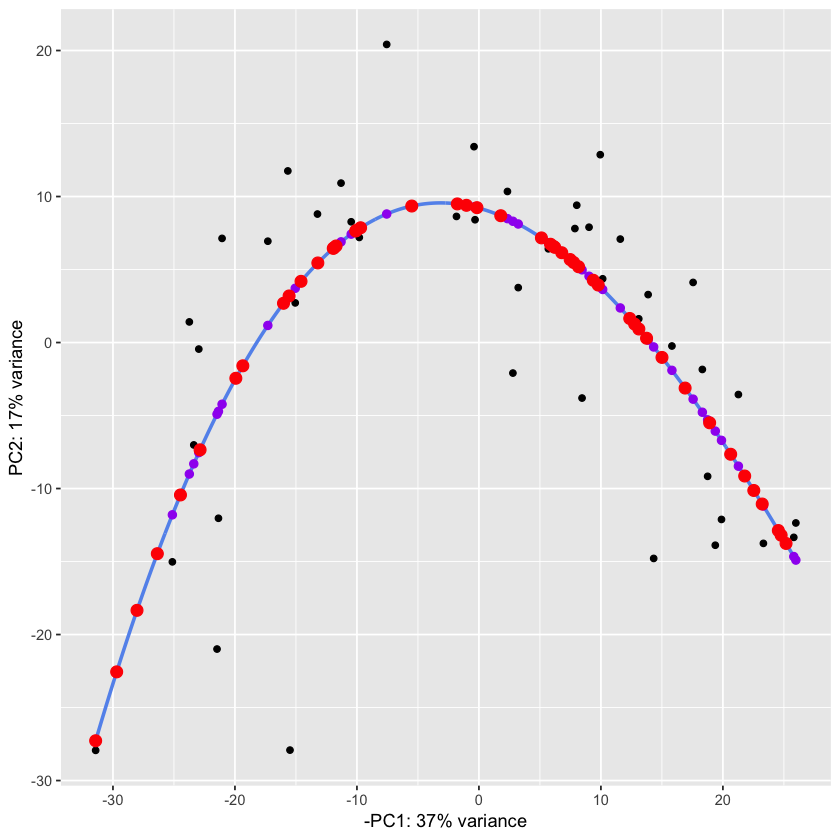

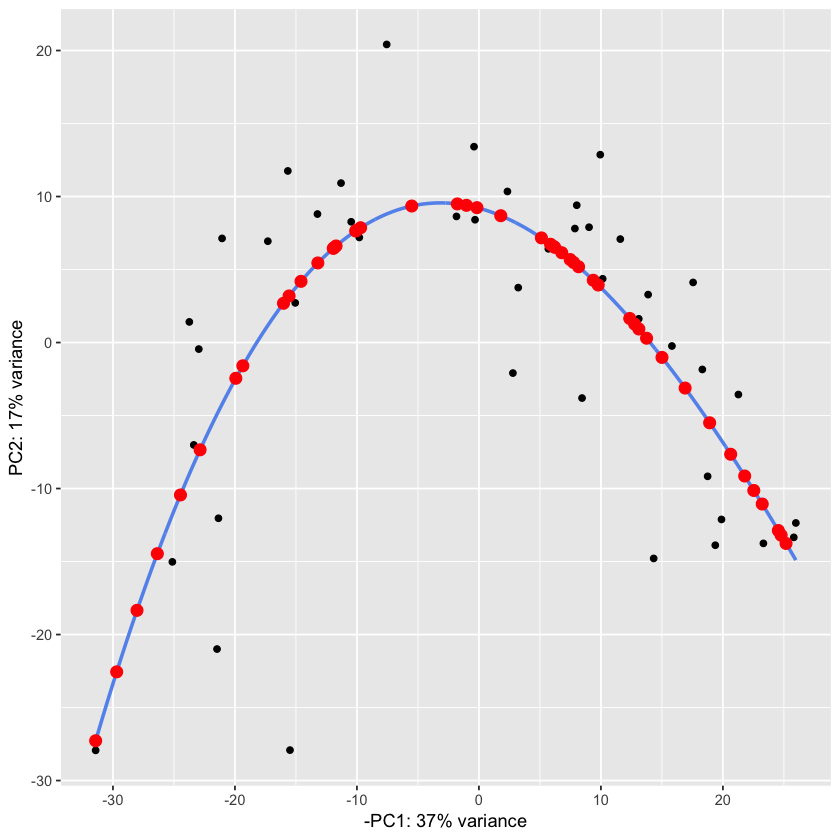

In [11]:
require(spatstat) #designed for comparing ppp point objects

#create point objects with large windows, does it matter?
sppp <- as.ppp(sline, W=c(c(-60,60), c(-60,60))) 
dppp <- ppp(d$PC1, d$PC2, window=owin(c(-60,60), c(-60,60)))

#calculate nearest and get distance -- of limited use here
ddist <- nncross(X=dppp, Y=sppp, k=1)

#pull out spline x, y, and rank
sbest <- sline[ddist$which,] 


ggplot(data=df, aes(-PC1, PC2)) + 
	xlab(paste0("-PC1: ",round(percentVar[1] * 100),"% variance")) +
  	ylab(paste0("PC2: ",round(percentVar[2] * 100),"% variance")) +
	geom_point() + 
	stat_smooth(method="lm", formula= y~splines::bs(x,3), se=F, color="cornflowerblue", n=1000) +
	geom_point(aes(-PC1, df$fit), size=2, color="purple") +
	geom_point(aes(-sbest$x, sbest$y), size=3, color="red")

ggplot(data=df, aes(-PC1, PC2)) + 
	xlab(paste0("-PC1: ",round(percentVar[1] * 100),"% variance")) +
  	ylab(paste0("PC2: ",round(percentVar[2] * 100),"% variance")) +
	geom_point() + 
	stat_smooth(method="lm", formula= y~splines::bs(x,3), se=F, color="cornflowerblue", n=1000) +
	geom_point(aes(-sbest$x, sbest$y), size=3, color="red")


In [12]:
df <- cbind(df, (1000-sbest$rank)/100)
colnames(df)[5] <- "ETU"



In [13]:
head(df)


PC1,PC2,fit,name,ETU
-23.32018,-13.75617,-11.1926465,SHSL001_01_S1.count.txt,9.74
-19.37552,-13.88234,-6.0650415,SHSL001_02_S2.count.txt,9.51
-25.81120,-13.34415,-14.6584963,SHSL001_03_S3.count.txt,9.85
-25.98080,-12.35726,-14.8999796,SHSL001_04_S4.count.txt,9.78
-14.32583,-14.78731,-0.3028468,SHSL001_05_S5.count.txt,9.26
-19.88447,-12.11649,-6.6986645,SHSL001_06_S6.count.txt,9.39


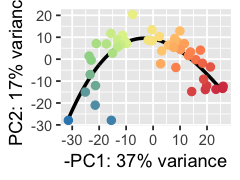

In [14]:

options(repr.plot.width=2, repr.plot.height=1.5)
p <- ggplot(data=df, aes(-PC1, PC2, color=ETU)) +
    stat_smooth(method="lm", formula= y~splines::bs(x,3), se=F, color="black", n=1000) +
	xlab(paste0("-PC1: ",round(percentVar[1] * 100),"% variance")) +
  	ylab(paste0("PC2: ",round(percentVar[2] * 100),"% variance")) +
	geom_point(size = 2) +
	scale_color_distiller(palette="Spectral") +
    theme(legend.position="none")

p

ggsave(plot=p,width=2,height=1.5,dpi=200, filename="./deseq/ColorCode_top1500_ETUcolor.pdf", useDingbats=FALSE)


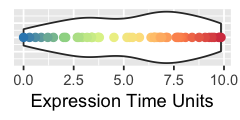

In [15]:
options(repr.plot.width=2, repr.plot.height=1)



p <- ggplot(data=df, aes(x=0, y=ETU, color=ETU)) +
		ylab("Expression Time Units") +
		geom_violin() +
		geom_point(size = 2) +
		scale_color_distiller(palette="Spectral") +
		coord_flip() +
        xlab(NULL) +
        theme(legend.position="none", axis.text.y = element_blank(), axis.ticks.y = element_blank())

p

ggsave(plot=p,width=2,height=1,dpi=200, filename="./deseq/ColorCode_top1500_ETUdist.pdf", useDingbats=FALSE)

In [16]:
das <- read.table (text=
"78
78
78
78
76
76
76
75
75
72
72
72
71
71
71
70
70
70
69
69
69
69
68
68
68
68
68
66
66
66
65
65
64
64
64
64
63
63
63
63
62
62
62
62
61
61
61", header =F)

In [17]:
#add DAS to dataframe -- only run this block once!!
df <- cbind(df, das$V1)
colnames(df)[6] <- "DAS"
head(df)

PC1,PC2,fit,name,ETU,DAS
-23.32018,-13.75617,-11.1926465,SHSL001_01_S1.count.txt,9.74,78
-19.37552,-13.88234,-6.0650415,SHSL001_02_S2.count.txt,9.51,78
-25.81120,-13.34415,-14.6584963,SHSL001_03_S3.count.txt,9.85,78
-25.98080,-12.35726,-14.8999796,SHSL001_04_S4.count.txt,9.78,78
-14.32583,-14.78731,-0.3028468,SHSL001_05_S5.count.txt,9.26,76
-19.88447,-12.11649,-6.6986645,SHSL001_06_S6.count.txt,9.39,76


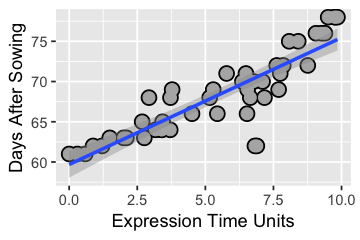

In [18]:
p <- ggplot(data=df, aes(x=ETU, y=DAS)) +
		xlab("Expression Time Units") +
		ylab("Days After Sowing") +
		geom_point(color="black", size = 4) +
		geom_point(color="grey70", size = 3) +
		stat_smooth(method="lm")

options(repr.plot.width=3, repr.plot.height=2)
p

ggsave(plot=p,width=3,height=2,dpi=300, filename="./ETUvDAS.pdf", useDingbats=FALSE)

In [19]:
DvE <- lm(df$ETU ~ df$DAS)
summary(DvE)


Call:
lm(formula = df$ETU ~ df$DAS)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.3905 -0.8502 -0.1605  0.5423  4.4738 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) -27.59563    2.75429  -10.02 4.90e-13 ***
df$DAS        0.48406    0.04019   12.04 1.12e-15 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.427 on 45 degrees of freedom
Multiple R-squared:  0.7633,	Adjusted R-squared:  0.758 
F-statistic: 145.1 on 1 and 45 DF,  p-value: 1.121e-15


# R^2 is 0.76 -- DAS explains a lot but not everything
similar finding in maize, R^2 was higher for maize tassels

In [20]:
panicle_height <- read.table (text=
"17.286
16.976
14.238
16.038
16.349
13.954
9.768
4.963
5.314
3.169
9.32
4.228
3.577
2.622
4.014
4.274
4.835
4.131
3.822
2.731
4.432
3.091
1.906
1.763
4.033
3.933
2.871
3.76
2.862
3.233
1.825
1.631
NA
NA
NA
NA
1.212
2.059
0.955
1.739
0.932
1.033
1.386
0.426
0.972
0.248
0.359", header =F)

In [21]:
#add DAS to dataframe -- only run this block once!!
df <- cbind(df, panicle_height$V1)
colnames(df)[7] <- "panicle_height"
head(df)

PC1,PC2,fit,name,ETU,DAS,panicle_height
-23.32018,-13.75617,-11.1926465,SHSL001_01_S1.count.txt,9.74,78,17.286
-19.37552,-13.88234,-6.0650415,SHSL001_02_S2.count.txt,9.51,78,16.976
-25.81120,-13.34415,-14.6584963,SHSL001_03_S3.count.txt,9.85,78,14.238
-25.98080,-12.35726,-14.8999796,SHSL001_04_S4.count.txt,9.78,78,16.038
-14.32583,-14.78731,-0.3028468,SHSL001_05_S5.count.txt,9.26,76,16.349
-19.88447,-12.11649,-6.6986645,SHSL001_06_S6.count.txt,9.39,76,13.954


Warning message:
“Removed 4 rows containing non-finite values (stat_smooth).”Warning message:
“Removed 4 rows containing missing values (geom_point).”Warning message:
“Removed 4 rows containing missing values (geom_point).”

Warning message:
“Removed 4 rows containing non-finite values (stat_smooth).”Warning message:
“Removed 4 rows containing missing values (geom_point).”Warning message:
“Removed 4 rows containing missing values (geom_point).”

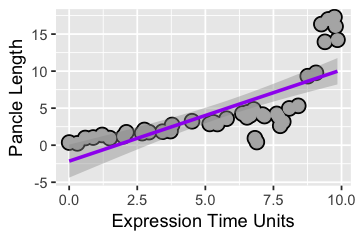

In [23]:
p <- ggplot(data=df, aes(x=ETU, y=panicle_height)) +
		xlab("Expression Time Units") +
		ylab("Pancle Length") +
		geom_point(color="black", size = 4) +
		geom_point(color="grey70", size = 3) +
		stat_smooth(method="lm", col="purple")

options(repr.plot.width=3, repr.plot.height=2)
p

ggsave(plot=p,width=3,height=2,dpi=300, filename="./ETUvPanicleLength.pdf", useDingbats=FALSE)



In [33]:
TvE <- lm(panicle_height ~ ETU, data=df)
summary(TvE)


Call:
lm(formula = panicle_height ~ ETU, data = df)

Residuals:
    Min      1Q  Median      3Q     Max 
-5.9106 -2.0706 -0.2502  1.6649  7.4392 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -2.1493     1.1039  -1.947   0.0584 .  
ETU           1.2316     0.1728   7.126 1.09e-08 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.316 on 41 degrees of freedom
  (4 observations deleted due to missingness)
Multiple R-squared:  0.5533,	Adjusted R-squared:  0.5424 
F-statistic: 50.78 on 1 and 41 DF,  p-value: 1.094e-08


In [26]:
install.packages("segmented")


The downloaded binary packages are in
	/var/folders/5g/8m48_y6j031cwg17tfnqtc1c0000gn/T//RtmpSeQKBD/downloaded_packages


In [57]:
library (segmented)

seg <- segmented(TvE, seg.Z=~ETU)
seg
summary(seg)

Call: segmented.lm(obj = TvE, seg.Z = ~ETU)

Meaningful coefficients of the linear terms:
(Intercept)          ETU       U1.ETU  
     0.6605       0.4088       6.7805  

Estimated Break-Point(s):
psi1.ETU  
   8.003  


	***Regression Model with Segmented Relationship(s)***

Call: 
segmented.lm(obj = TvE, seg.Z = ~ETU)

Estimated Break-Point(s):
   Est. St.Err 
 8.003  0.140 

Meaningful coefficients of the linear terms:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.66051    0.44585   1.481    0.147    
ETU          0.40885    0.08502   4.809 2.28e-05 ***
U1.ETU       6.78051    0.67740  10.010       NA    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.216 on 39 degrees of freedom
Multiple R-Squared: 0.9428,  Adjusted R-squared: 0.9384 

Convergence attained in 4 iterations with relative change 2.463101e-16 

In [58]:
slope(seg)

,Est.,St.Err.,t value,CI(95%).l,CI(95%).u
slope1,0.40885,0.085019,4.8089,0.23688,0.58081
slope2,7.18940,0.672040,10.6980,5.83000,8.54870


In [40]:
# get the fitted data
fitted <- fitted(seg)
model_residuals <- residuals(seg)
sd_residuals <- sd(model_residuals,na.rm = T)

model <- data.frame(ETU = na.omit(df)$ETU, panicle_height = fitted)


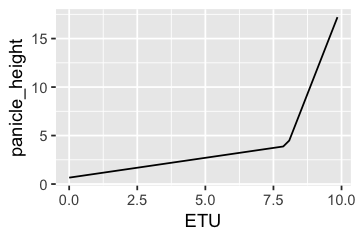

In [46]:
qplot(data=model, x=ETU, y=panicle_height, geom="line")

Warning message:
“Removed 4 rows containing missing values (geom_point).”Warning message:
“Removed 4 rows containing missing values (geom_point).”

Warning message:
“Removed 4 rows containing missing values (geom_point).”Warning message:
“Removed 4 rows containing missing values (geom_point).”

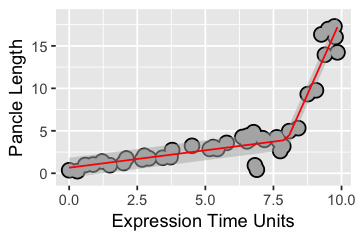

In [56]:
p <- ggplot(data=df, aes(x=ETU, y=panicle_height)) +
		xlab("Expression Time Units") +
		ylab("Pancle Length") +
		geom_point(color="black", size = 4) +
		geom_point(color="grey70", size = 3)
p <- p +
    geom_ribbon(data=model,aes(ymin = panicle_height - sd_residuals, ymax = panicle_height + sd_residuals), fill = "grey70",alpha=0.5) +
    geom_line(data=model, aes(x=ETU, y=panicle_height),color="red")

p

ggsave(plot=p,width=3,height=2,dpi=300, filename="./ETUvPanicleLength_segmented.pdf", useDingbats=FALSE)


In [34]:
TvEPow <- nls(panicle_height ~ I(ETU^power), data=df, start = list(power = 1), trace=T)
summary(TvEPow)
summary(TvEPow)$coefficients

500.543 :  1
499.2962 :  0.9871982
499.2927 :  0.986502
499.2927 :  0.986473



Formula: panicle_height ~ I(ETU^power)

Parameters:
      Estimate Std. Error t value Pr(>|t|)    
power  0.98647    0.04144    23.8   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.448 on 42 degrees of freedom

Number of iterations to convergence: 3 
Achieved convergence tolerance: 4.41e-06
  (4 observations deleted due to missingness)


,Estimate,Std. Error,t value,Pr(>|t|)
power,0.986473,0.04144325,23.80299,5.248815e-26


In [ ]:
TvELog <- nls(panicle_height ~ log(ETU), data=df, start = list(power = 1), trace=T)
summary(TvEPow)
summary(TvEPow)$coefficients

Warning message:
“Removed 4 rows containing non-finite values (stat_smooth).”Warning message:
“Removed 4 rows containing missing values (geom_point).”Warning message:
“Removed 4 rows containing missing values (geom_point).”

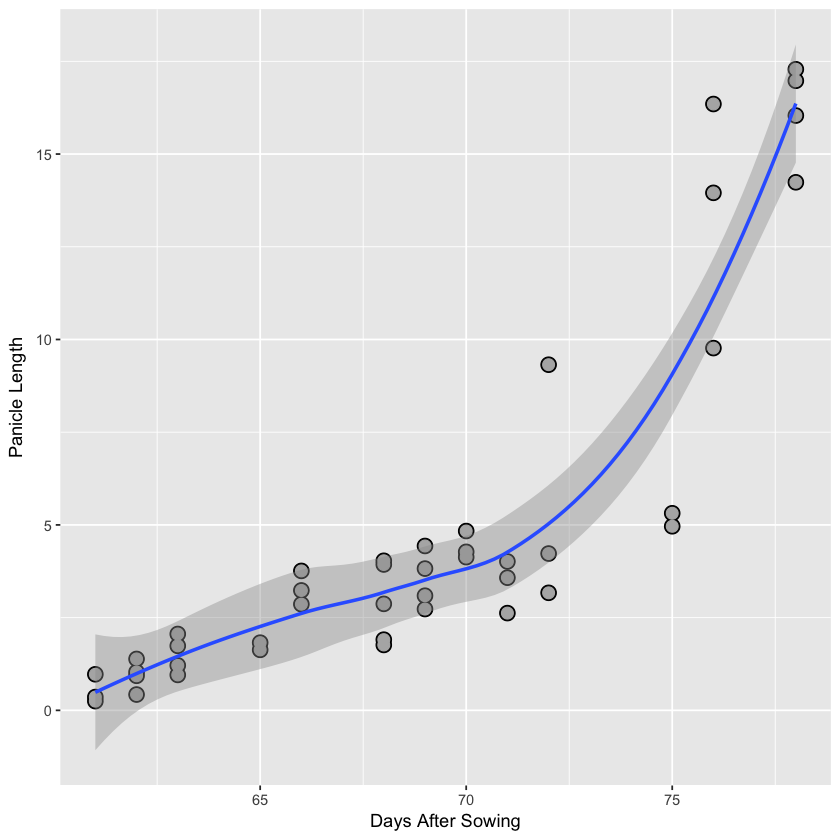

In [61]:
ggplot(data=df, aes(x=DAS, y=panicle_height)) +
		xlab("Days After Sowing") +
		ylab("Panicle Length") +
		geom_point(color="black", size = 4) +
		geom_point(color="grey70", size = 3) +
		stat_smooth(method="loess")


In [62]:
DvT <- lm(df$panicle_height ~ df$DAS)
summary(DvT)


Call:
lm(formula = df$panicle_height ~ df$DAS)

Residuals:
    Min      1Q  Median      3Q     Max 
-4.8044 -1.8274 -0.0715  1.5554  5.7945 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) -49.26448    5.24334  -9.396 8.85e-12 ***
df$DAS        0.78709    0.07605  10.349 5.31e-13 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2.611 on 41 degrees of freedom
  (4 observations deleted due to missingness)
Multiple R-squared:  0.7232,	Adjusted R-squared:  0.7164 
F-statistic: 107.1 on 1 and 41 DF,  p-value: 5.306e-13


In [63]:
write.table(df, file="./deseq/ETU_vsd_46count_5min.txt", sep="\t", quote=F)

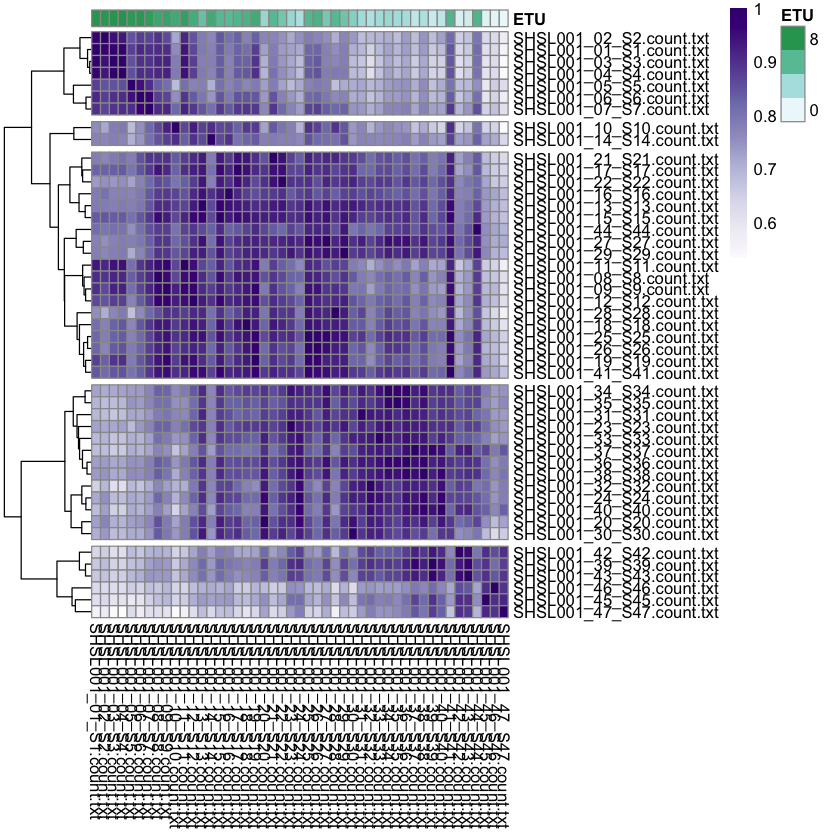

In [64]:
### Revisit heatmaps with ETU values

require("pheatmap")
require("RColorBrewer")
require("genefilter")

sampleDists <- as.dist((1-abs(cor(selected_genes))))
sampleDistMatrix <- as.matrix( sampleDists )
#rownames(sampleDistMatrix) <- paste( rld$dex, rld$cell, sep = " - " )
#colnames(sampleDistMatrix) <- NULL
colors <- colorRampPalette( brewer.pal(9, "Purples") )(255)

an_col <- data.frame(df$ETU)
rownames(an_col) <- df$name
colnames(an_col)[1] <- "ETU"

#snag the ggplot colors
p <- ggplot(data=df, aes(x=0, y=ETU, color=ETU)) +
		ylab("Expression Time Units") +
		geom_violin() +
		geom_point(color="black", size = 4) +
		geom_point(size = 3) +
		scale_color_distiller(palette="Spectral") +
		coord_flip() 
pg <- ggplot_build(p)
color_data <- pg$data[[3]]

an_colors <- list ( DTU = color_data[,1])
#attach to other data
df <- cbind(df, an_colors)
colnames(df)[8] <- "ETU_color"


pheatmap(1-sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         cluster_rows=TRUE, cluster_cols=F,
         cutree_rows=5, cutree_cols=5,
         col = colors,
         annotation_col = an_col,
         annotation_colors = an_colors
         )



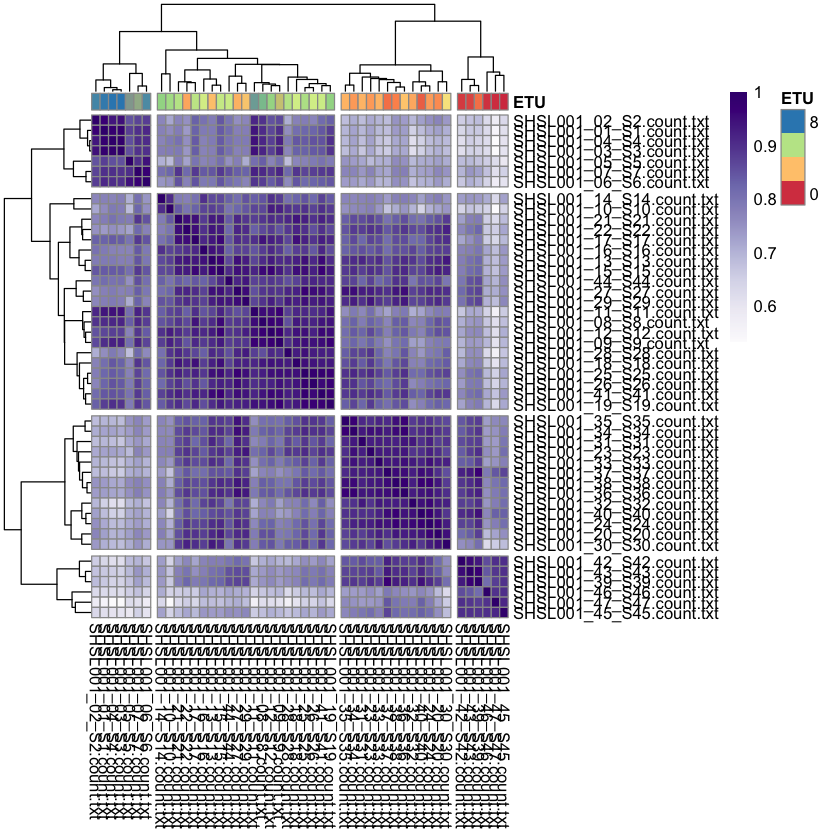

In [65]:

ordered_genes <- selected_genes[,order(df$ETU)]
sampleDists <- as.dist((1-abs(cor(ordered_genes))))
sampleDistMatrix <- as.matrix( sampleDists )
#rownames(sampleDistMatrix) <- paste( rld$dex, rld$cell, sep = " - " )
#colnames(sampleDistMatrix) <- NULL
colors <- colorRampPalette( brewer.pal(9, "Purples") )(255)

an_col <- data.frame(df$ETU)
rownames(an_col) <- df$name
colnames(an_col)[1] <- "ETU"

an_colors <- list ( ETU = as.character(df$ETU_color))

pheatmap(1-sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         cluster_rows=T, cluster_cols=T,
         cutree_rows=4, cutree_cols=4,
         col = colors,
         annotation_col = an_col,
         annotation_colors = an_colors)

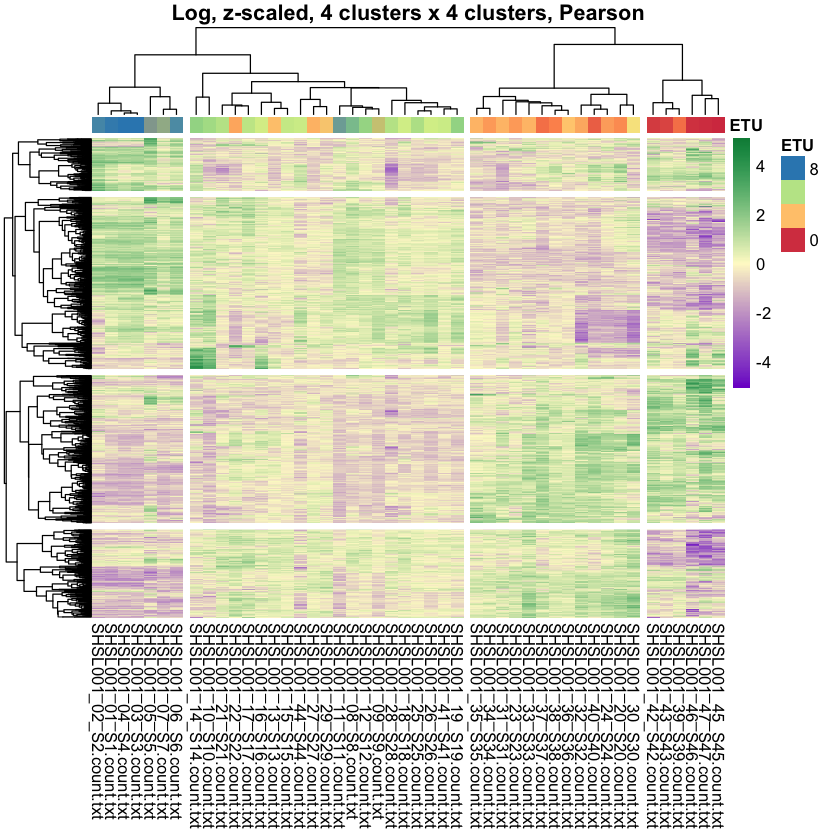

In [66]:
#samples x genes

geneDists <- as.dist((1 - cor(t(ordered_genes))))
geneDistMatrix <- as.matrix( geneDists )

colors <- colorRampPalette( c("purple3", "lemonchiffon1", "springgreen4") )(200)

pheatmap(t(scale(t(ordered_genes))),
          clustering_distance_rows = geneDists,
          clustering_distance_cols = sampleDists,
          cluster_rows=TRUE, cluster_cols=TRUE,
          show_rownames = F, show_colnames = T,
          cutree_cols=4, cutree_rows=4,
          annotation_col = an_col,
          annotation_colors = an_colors,
          col=colors, main="Log, z-scaled, 4 clusters x 4 clusters, Pearson")


Row.names,PC1,PC2,fit,name,ETU,DAS,panicle_height,ETU_color,k4_clust,k5_clust
SHSL001_01_S1.count.txt,-23.32018,-13.75617,-11.1926465,SHSL001_01_S1.count.txt,9.74,78,17.286,#D74350,4,5
SHSL001_02_S2.count.txt,-19.37552,-13.88234,-6.0650415,SHSL001_02_S2.count.txt,9.51,78,16.976,#DC4E51,4,5
SHSL001_03_S3.count.txt,-25.81120,-13.34415,-14.6584963,SHSL001_03_S3.count.txt,9.85,78,14.238,#D53E4F,4,5
SHSL001_04_S4.count.txt,-25.98080,-12.35726,-14.8999796,SHSL001_04_S4.count.txt,9.78,78,16.038,#D6414F,4,5
SHSL001_05_S5.count.txt,-14.32583,-14.78731,-0.3028468,SHSL001_05_S5.count.txt,9.26,76,16.349,#E15852,4,5
SHSL001_06_S6.count.txt,-19.88447,-12.11649,-6.6986645,SHSL001_06_S6.count.txt,9.39,76,13.954,#DE5352,4,5


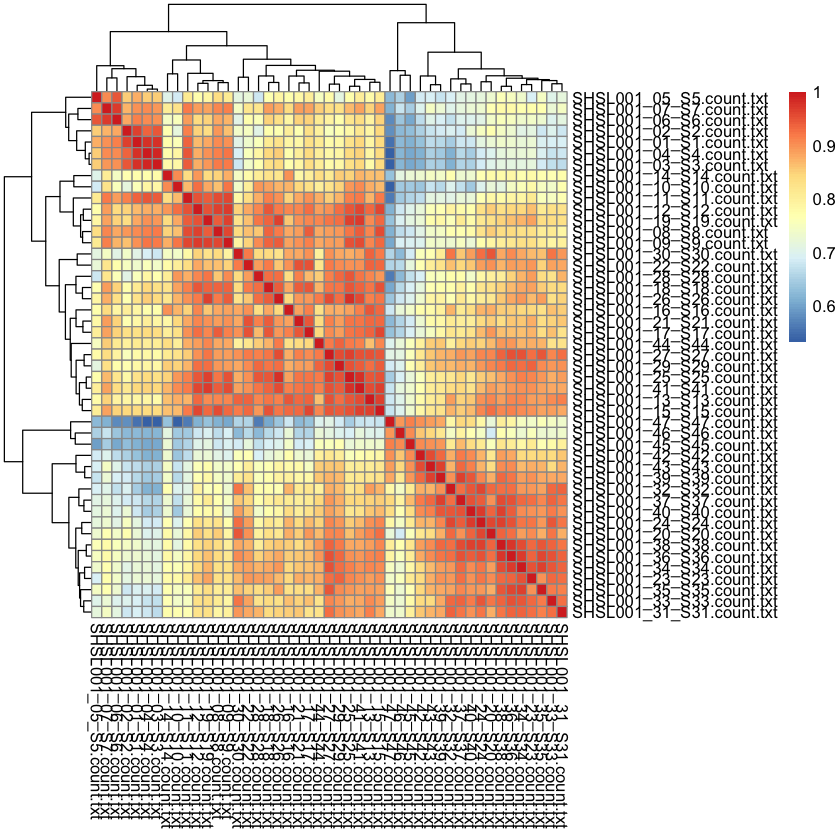

In [68]:
genePheat <- pheatmap(1-sampleDistMatrix)

## add cluster info to sample dataframe and export

df.pre <- df
rownames(df.pre) <- df[,4]

geneClust <- data.frame(cutree(genePheat$tree_row, k = 4))

df.clust <- merge(df.pre, geneClust, by=0, all=TRUE)
colnames(df.clust)[10] <- "k4_clust"

df.clust[,1] <- NULL
rownames(df.clust) <- df.clust[,4]

geneClust <- data.frame(cutree(genePheat$tree_row, k = 5))

df.clust <- merge(df.clust, geneClust, by=0, all=TRUE)
colnames(df.clust)[11] <- "k5_clust"

write.table(df.clust, "./deseq/geneClust_info.txt", sep="\t", quote=F)
head(df.clust)

In [69]:
# try to do some tree magic with dendextend
require (dendextend)
require (magrittr)

Loading required package: dendextend

---------------------
Welcome to dendextend version 1.6.0
Type citation('dendextend') for how to cite the package.

Type browseVignettes(package = 'dendextend') for the package vignette.
The github page is: https://github.com/talgalili/dendextend/

Suggestions and bug-reports can be submitted at: https://github.com/talgalili/dendextend/issues
Or contact: <tal.galili@gmail.com>

	To suppress this message use:  suppressPackageStartupMessages(library(dendextend))
---------------------


Attaching package: ‘dendextend’

The following object is masked from ‘package:spatstat’:

    rotate

The following object is masked from ‘package:rpart’:

    prune

The following object is masked from ‘package:stats’:

    cutree

Loading required package: magrittr


In [70]:
class(sampleDistMatrix)

[1] "matrix"

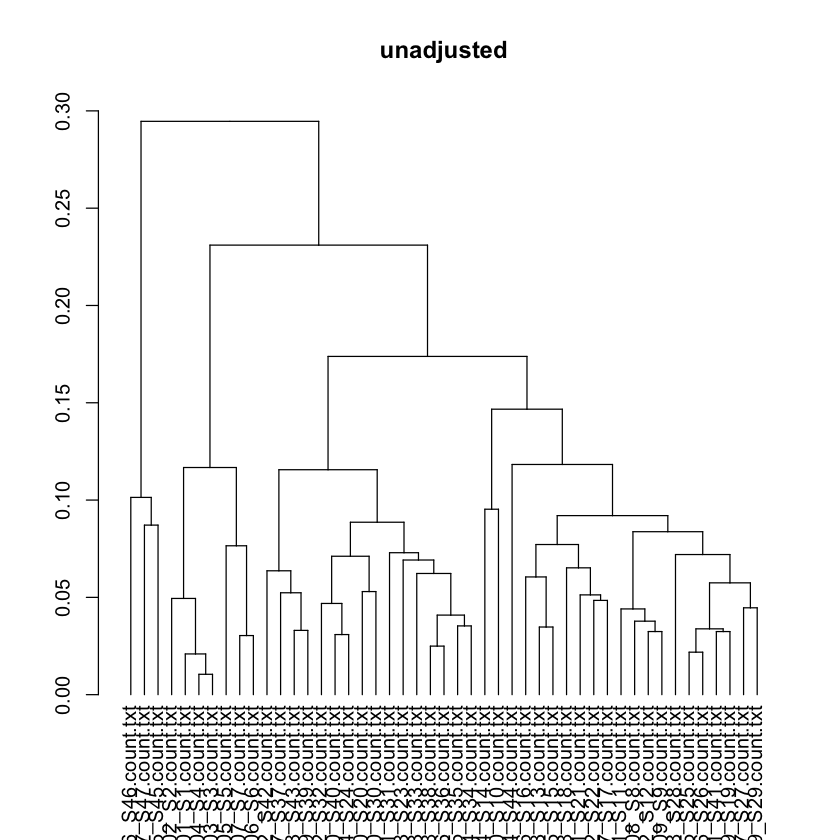

In [71]:
dend <-  sampleDists %>% # recall a distance matrix from above, 
         hclust(method = "average") %>% # on it compute hierarchical clustering using the "average" method, 
         as.dendrogram # turn that object into a dendrogram.
dend %>% plot(main="unadjusted") # plot it


[1] "SHSL001_46_S46.count.txt" "SHSL001_47_S47.count.txt"
 [3] "SHSL001_45_S45.count.txt" "SHSL001_02_S2.count.txt" 
 [5] "SHSL001_01_S1.count.txt"  "SHSL001_04_S4.count.txt" 
 [7] "SHSL001_03_S3.count.txt"  "SHSL001_05_S5.count.txt" 
 [9] "SHSL001_07_S7.count.txt"  "SHSL001_06_S6.count.txt" 
[11] "SHSL001_42_S42.count.txt" "SHSL001_37_S37.count.txt"
[13] "SHSL001_43_S43.count.txt" "SHSL001_39_S39.count.txt"
[15] "SHSL001_32_S32.count.txt" "SHSL001_40_S40.count.txt"
[17] "SHSL001_24_S24.count.txt" "SHSL001_20_S20.count.txt"
[19] "SHSL001_30_S30.count.txt" "SHSL001_31_S31.count.txt"
[21] "SHSL001_23_S23.count.txt" "SHSL001_33_S33.count.txt"
[23] "SHSL001_38_S38.count.txt" "SHSL001_36_S36.count.txt"
[25] "SHSL001_35_S35.count.txt" "SHSL001_34_S34.count.txt"
[27] "SHSL001_14_S14.count.txt" "SHSL001_10_S10.count.txt"
[29] "SHSL001_44_S44.count.txt" "SHSL001_16_S16.count.txt"
[31] "SHSL001_13_S13.count.txt" "SHSL001_15_S15.count.txt"
[33] "SHSL001_18_S18.count.txt" "SHSL001_21_S21.count.txt"
[35] "SHSL001_22_S22.count.txt" "SHSL001_17_S17.count.txt"
[37] "SHSL001_11_S11.count.txt" "SHSL001_08_S8.count.txt" 
[39] "SHSL001_12_S12.count.txt" "SHSL001_09_S9.count.txt" 
[41] "SHSL001_28_S28.count.txt" "SHSL001_25_S25.count.txt"
[43] "SHSL001_26_S26.count.txt" "SHSL001_41_S41.count.txt"
[45] "SHSL001_19_S19.count.txt" "SHSL001_27_S27.count.txt"
[47] "SHSL001_29_S29.count.txt"

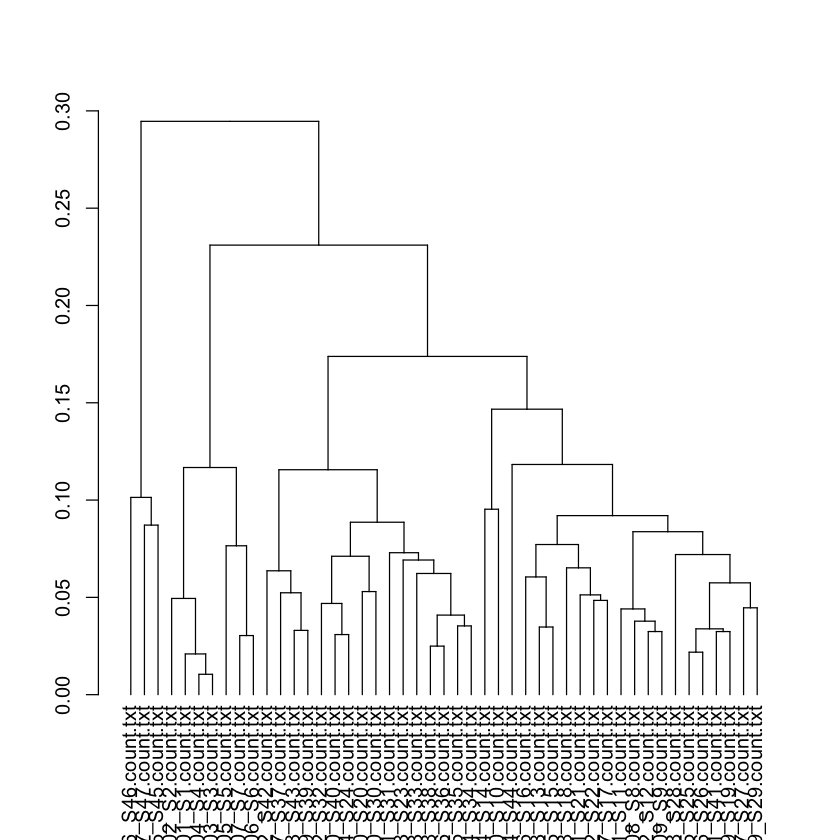

In [73]:
# current labels
old.labels <- labels(dend)
labels(dend)

# split out library name
split.labels <- strsplit(labels(dend), "_")
simple.labels <- matrix(unlist(split.labels), ncol=3, byrow=TRUE)[,2]

# relabel dendrogram object with library names
short.dend <- dend %>% set("labels", simple.labels)
plot(dend)

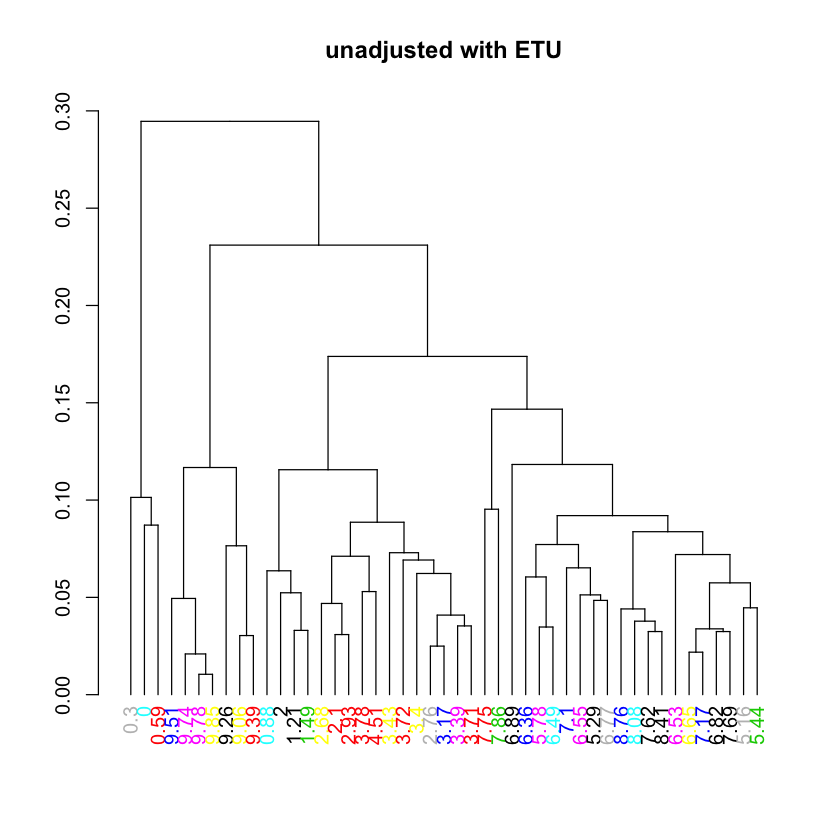

In [74]:
# match labels to ETU
temp <- df
rownames(temp) <- df$name
labels.ETU <- temp[old.labels,]$ETU

# replace labels with ETU
dend %>% set("labels", labels.ETU) %>% 
set("labels_col", 10*(labels.ETU+0.5)) %>%
plot(main="unadjusted with ETU")

In [75]:
#Order current labels by their ETU
#Use that order to sort tree

sortlabels.ETU <- temp[order(temp$ETU),4]
sortlabels.ETU



[1] SHSL001_47_S47.count.txt SHSL001_46_S46.count.txt SHSL001_45_S45.count.txt
 [4] SHSL001_42_S42.count.txt SHSL001_43_S43.count.txt SHSL001_39_S39.count.txt
 [7] SHSL001_37_S37.count.txt SHSL001_40_S40.count.txt SHSL001_32_S32.count.txt
[10] SHSL001_38_S38.count.txt SHSL001_24_S24.count.txt SHSL001_36_S36.count.txt
[13] SHSL001_35_S35.count.txt SHSL001_33_S33.count.txt SHSL001_31_S31.count.txt
[16] SHSL001_34_S34.count.txt SHSL001_23_S23.count.txt SHSL001_20_S20.count.txt
[19] SHSL001_30_S30.count.txt SHSL001_27_S27.count.txt SHSL001_22_S22.count.txt
[22] SHSL001_29_S29.count.txt SHSL001_13_S13.count.txt SHSL001_16_S16.count.txt
[25] SHSL001_15_S15.count.txt SHSL001_28_S28.count.txt SHSL001_21_S21.count.txt
[28] SHSL001_25_S25.count.txt SHSL001_17_S17.count.txt SHSL001_41_S41.count.txt
[31] SHSL001_44_S44.count.txt SHSL001_18_S18.count.txt SHSL001_26_S26.count.txt
[34] SHSL001_12_S12.count.txt SHSL001_19_S19.count.txt SHSL001_14_S14.count.txt
[37] SHSL001_10_S10.count.txt SHSL001_08_S8.count.txt  SHSL001_09_S9.count.txt 
[40] SHSL001_11_S11.count.txt SHSL001_07_S7.count.txt  SHSL001_05_S5.count.txt 
[43] SHSL001_06_S6.count.txt  SHSL001_02_S2.count.txt  SHSL001_01_S1.count.txt 
[46] SHSL001_04_S4.count.txt  SHSL001_03_S3.count.txt 
47 Levels: SHSL001_01_S1.count.txt ... SHSL001_47_S47.count.txt

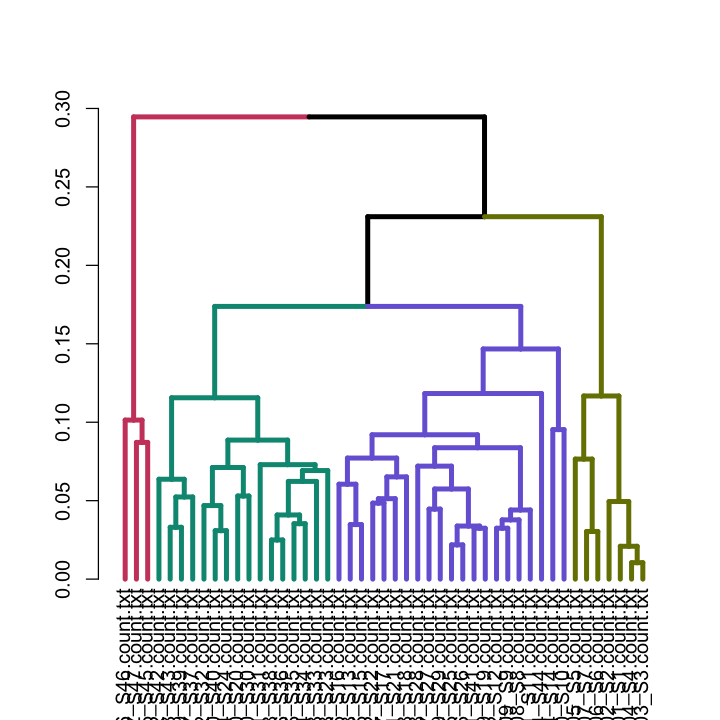

In [92]:
options(repr.plot.width=6, repr.plot.height=6)
relab.dend <- dend %>% set("branches_k_color", k = 4) %>% 
            set("branches_lwd", 4) %>% 
            rotate (as.character(sortlabels.ETU)) 
plot (relab.dend)

[1] "SHSL001_46_S46.count.txt" "SHSL001_47_S47.count.txt"
 [3] "SHSL001_45_S45.count.txt" "SHSL001_42_S42.count.txt"
 [5] "SHSL001_43_S43.count.txt" "SHSL001_39_S39.count.txt"
 [7] "SHSL001_37_S37.count.txt" "SHSL001_32_S32.count.txt"
 [9] "SHSL001_40_S40.count.txt" "SHSL001_24_S24.count.txt"
[11] "SHSL001_20_S20.count.txt" "SHSL001_30_S30.count.txt"
[13] "SHSL001_31_S31.count.txt" "SHSL001_38_S38.count.txt"
[15] "SHSL001_36_S36.count.txt" "SHSL001_35_S35.count.txt"
[17] "SHSL001_34_S34.count.txt" "SHSL001_33_S33.count.txt"
[19] "SHSL001_23_S23.count.txt" "SHSL001_16_S16.count.txt"
[21] "SHSL001_13_S13.count.txt" "SHSL001_15_S15.count.txt"
[23] "SHSL001_22_S22.count.txt" "SHSL001_17_S17.count.txt"
[25] "SHSL001_21_S21.count.txt" "SHSL001_18_S18.count.txt"
[27] "SHSL001_28_S28.count.txt" "SHSL001_27_S27.count.txt"
[29] "SHSL001_29_S29.count.txt" "SHSL001_25_S25.count.txt"
[31] "SHSL001_26_S26.count.txt" "SHSL001_41_S41.count.txt"
[33] "SHSL001_19_S19.count.txt" "SHSL001_12_S12.count.txt"
[35] "SHSL001_09_S9.count.txt"  "SHSL001_08_S8.count.txt" 
[37] "SHSL001_11_S11.count.txt" "SHSL001_44_S44.count.txt"
[39] "SHSL001_14_S14.count.txt" "SHSL001_10_S10.count.txt"
[41] "SHSL001_05_S5.count.txt"  "SHSL001_07_S7.count.txt" 
[43] "SHSL001_06_S6.count.txt"  "SHSL001_02_S2.count.txt" 
[45] "SHSL001_01_S1.count.txt"  "SHSL001_04_S4.count.txt" 
[47] "SHSL001_03_S3.count.txt"

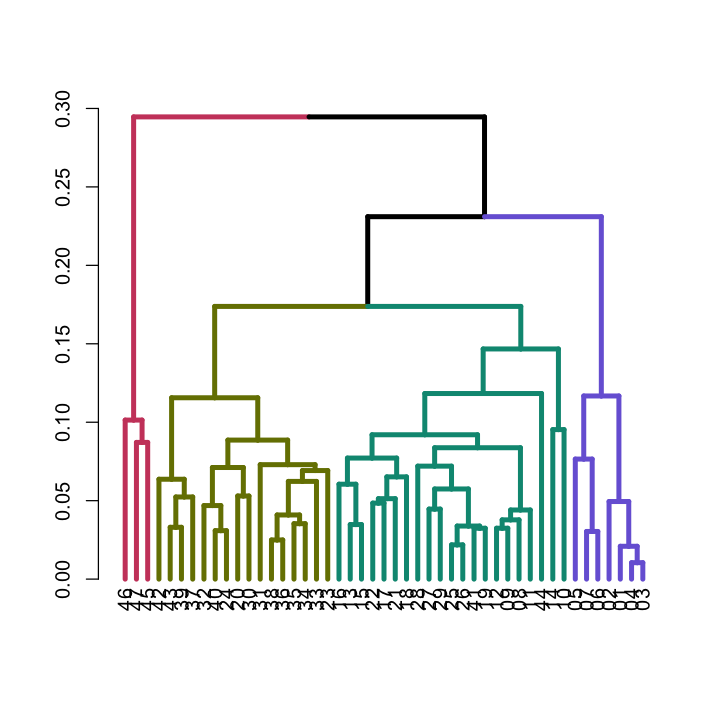

In [93]:
# current labels
old.relabels <- labels(relab.dend)
labels(relab.dend)

# split out library name
split.labels <- strsplit(labels(relab.dend), "_")
simple.labels <- matrix(unlist(split.labels), ncol=3, byrow=TRUE)[,2]

# relabel dendrogram object with library names
shortre.dend <- relab.dend %>% set("labels", simple.labels) %>% set("branches_k_color", k = 4)
plot(shortre.dend)

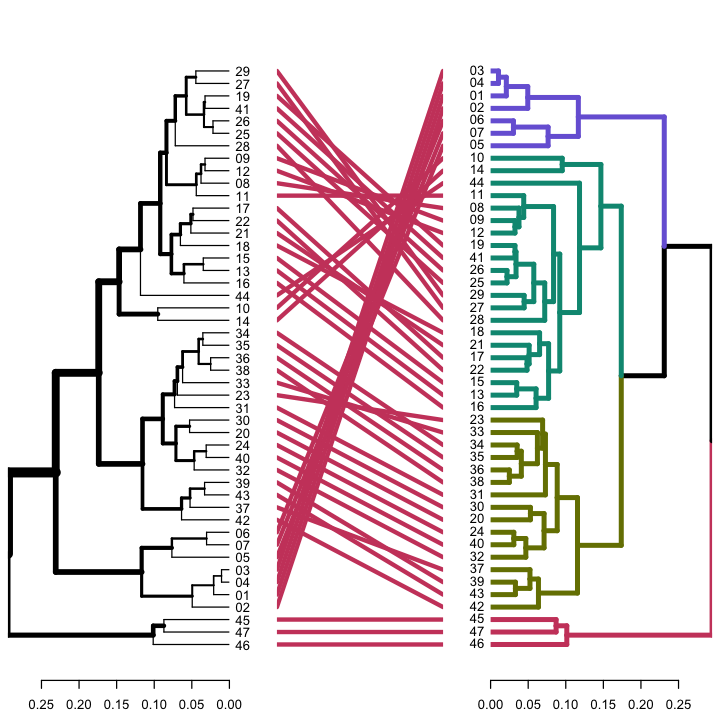

In [94]:
# check that it worked
changes <- dendlist(short.dend, shortre.dend)
tanglegram(changes)

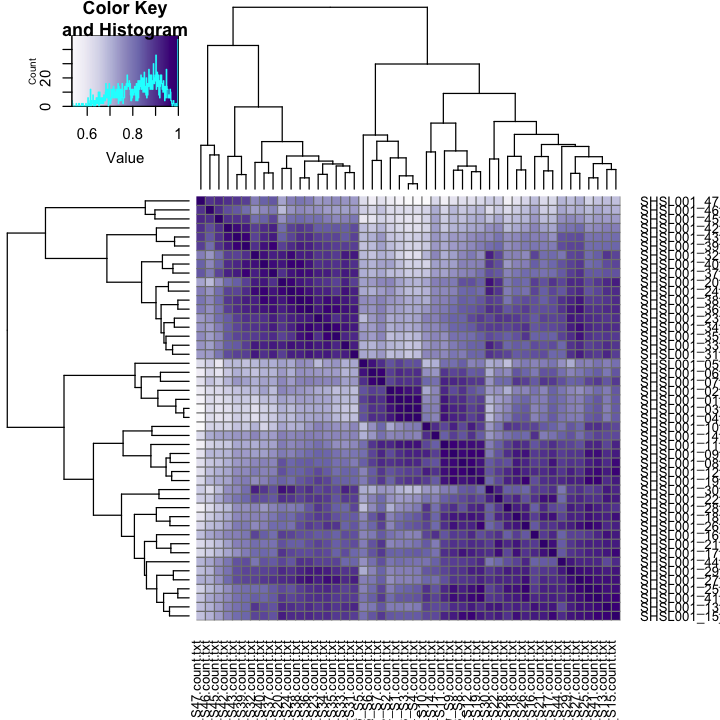

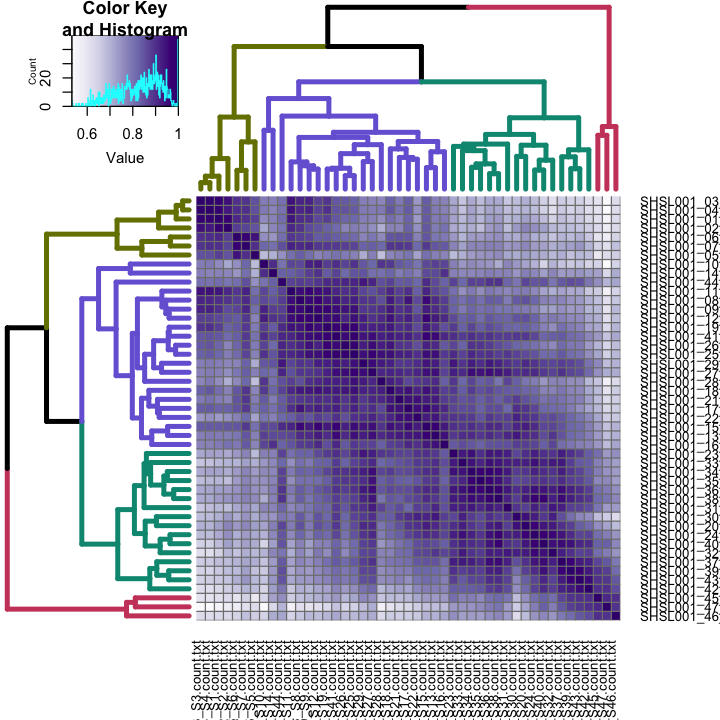

In [95]:
# try to use new dendrogram with heatmap.2
# bummer that pheatmap might not be compatible?

require (gplots)

#without ETU ordering
colors <- colorRampPalette( brewer.pal(9, "Purples") )(255)
heatmap.2 (1-sampleDistMatrix, 
           trace = "none",
           col = colors,
           symm=T, revC=T,
           sepcolor='grey50',
           sepwidth=c(0.0001,0.0001),
           colsep=1:ncol(sampleDistMatrix),
           rowsep=1:nrow(sampleDistMatrix)
          )
#with ETU ordering
heatmap.2 (1-sampleDistMatrix, 
           Rowv = relab.dend, 
           Colv = rev(relab.dend),
           trace = "none",
           col = colors,
           sepcolor='grey50',
           sepwidth=c(0.0001,0.0001),
           colsep=1:ncol(sampleDistMatrix),
           rowsep=1:nrow(sampleDistMatrix)
          )

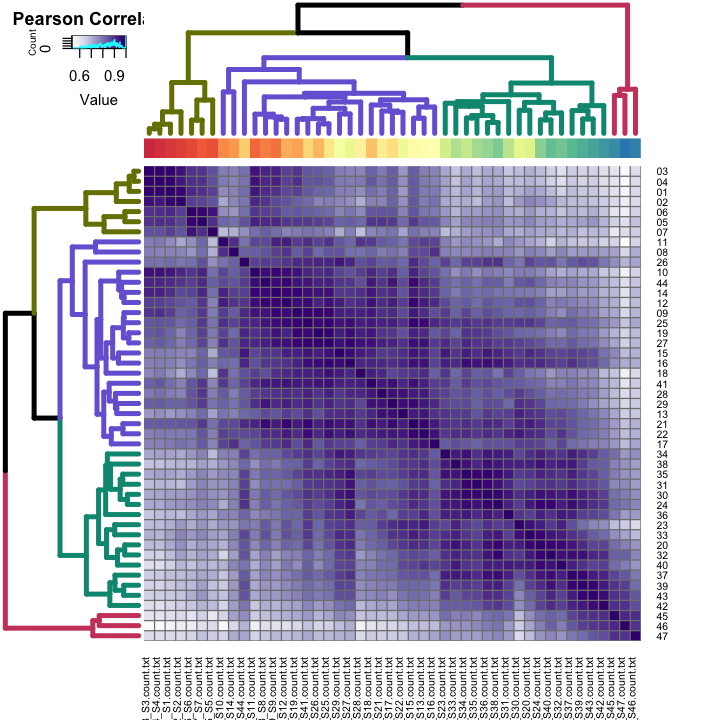

In [96]:
#not sure if ETU ordering is more believable -- maybe signifies that development is more continuous than discrete
#anyway, try adding in ETU colorbar, just for comparison

#get dendrogram labels, in order
den.labels <- colnames(sampleDistMatrix)

#get ETU values from dendrogram labels
den.ETUs <- temp[den.labels,]$ETU

#create color palette to match -- try spectral
den.colors <- colorRampPalette( rev (brewer.pal(9, "Spectral")) )(length(den.ETUs))

#replot with ColSideColors
heatmap.2 (1-sampleDistMatrix, 
           Rowv = relab.dend, 
           Colv = rev(relab.dend),
           trace = "none",
           col = colors,
           ColSideColors = den.colors,
           sepcolor='grey50',
           sepwidth=c(0.0001,0.0001),
           colsep=1:ncol(sampleDistMatrix),
           rowsep=1:nrow(sampleDistMatrix),
           keysize = 1,
           key.title = "Pearson Correlation",
           labRow = as.vector(simple.labels),
           
          )


[1] "SHSL001_47_S47.count.txt" "SHSL001_46_S46.count.txt"
 [3] "SHSL001_45_S45.count.txt" "SHSL001_42_S42.count.txt"
 [5] "SHSL001_43_S43.count.txt" "SHSL001_39_S39.count.txt"
 [7] "SHSL001_37_S37.count.txt" "SHSL001_40_S40.count.txt"
 [9] "SHSL001_32_S32.count.txt" "SHSL001_38_S38.count.txt"
[11] "SHSL001_24_S24.count.txt" "SHSL001_36_S36.count.txt"
[13] "SHSL001_35_S35.count.txt" "SHSL001_33_S33.count.txt"
[15] "SHSL001_31_S31.count.txt" "SHSL001_34_S34.count.txt"
[17] "SHSL001_23_S23.count.txt" "SHSL001_20_S20.count.txt"
[19] "SHSL001_30_S30.count.txt" "SHSL001_27_S27.count.txt"
[21] "SHSL001_22_S22.count.txt" "SHSL001_29_S29.count.txt"
[23] "SHSL001_13_S13.count.txt" "SHSL001_16_S16.count.txt"
[25] "SHSL001_15_S15.count.txt" "SHSL001_28_S28.count.txt"
[27] "SHSL001_21_S21.count.txt" "SHSL001_25_S25.count.txt"
[29] "SHSL001_17_S17.count.txt" "SHSL001_41_S41.count.txt"
[31] "SHSL001_44_S44.count.txt" "SHSL001_18_S18.count.txt"
[33] "SHSL001_26_S26.count.txt" "SHSL001_12_S12.count.txt"
[35] "SHSL001_19_S19.count.txt" "SHSL001_14_S14.count.txt"
[37] "SHSL001_10_S10.count.txt" "SHSL001_08_S8.count.txt" 
[39] "SHSL001_09_S9.count.txt"  "SHSL001_11_S11.count.txt"
[41] "SHSL001_07_S7.count.txt"  "SHSL001_05_S5.count.txt" 
[43] "SHSL001_06_S6.count.txt"  "SHSL001_02_S2.count.txt" 
[45] "SHSL001_01_S1.count.txt"  "SHSL001_04_S4.count.txt" 
[47] "SHSL001_03_S3.count.txt"

[1] "47" "46" "45" "42" "43" "39" "37" "40" "32" "38" "24" "36" "35" "33" "31"
[16] "34" "23" "20" "30" "27" "22" "29" "13" "16" "15" "28" "21" "25" "17" "41"
[31] "44" "18" "26" "12" "19" "14" "10" "08" "09" "11" "07" "05" "06" "02" "01"
[46] "04" "03"

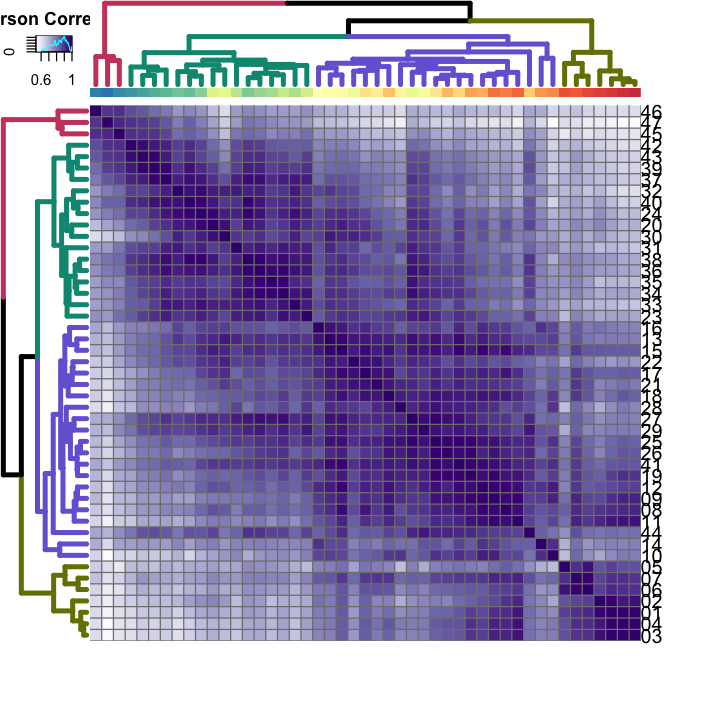

In [97]:
#Library labling looks really strange -- try relabeling the sample matrix directly

colnames(sampleDistMatrix)

# split out library name
split.Mlabels <- strsplit(colnames(sampleDistMatrix), "_")
simple.Mlabels <- matrix(unlist(split.Mlabels), ncol=3, byrow=TRUE)[,2]
simple.Mlabels
                          
# relabel heatmap with short library names
# looks like heatmap.2 wants the original matrix to be relabeled
# providing the tree-ordered label created the discrepancies
heatmap.2 (1-sampleDistMatrix, 
           Rowv = rev(relab.dend), 
           Colv = relab.dend,
           trace = "none",
           col = colors,
           ColSideColors = den.colors,
           sepcolor='grey50',
           sepwidth=c(0.0001,0.0001),
           colsep=1:ncol(sampleDistMatrix),
           rowsep=1:nrow(sampleDistMatrix),
           labRow = as.vector(simple.Mlabels),
           labCol = NA,
           density.info = 'density',
           cexRow = 1.5,
           srtRow = 0,
           offsetRow = -1,
           key = T,
           key.title = "Pearson Correlation",
           key.xlab= NA,
           key.ylab= NA,
           key.ytick = NULL,
           lhei = c(1,7),
           lwid = c(1,7)
          )


In [98]:
#save image

pdf(file="./deseq/ETU_ordered_heatmap_wDendro_k4.pdf", he=6, wi=6)
heatmap.2 (1-sampleDistMatrix, 
           Rowv = rev(relab.dend), 
           Colv = relab.dend,
           trace = "none",
           col = colors,
           ColSideColors = den.colors,
           sepcolor='black',
           #sepwidth=c(0,0),
           #colsep=1:ncol(sampleDistMatrix),
           #rowsep=1:nrow(sampleDistMatrix),
           labRow = as.vector(simple.Mlabels),
           labCol = NA,
           density.info = 'density',
           cexRow = 1.2,
           srtRow = 0,
           offsetRow = -1,
           key = F,
           key.title = "Pearson Correlation",
           key.xlab= NA,
           key.ylab= NA,
           key.ytick = NULL,
           lhei = c(1,7),
           lwid = c(1,7)
          )
dev.off()


pdf 
  2

# Explore predicted stages and potential marker expression patterns
1. Retreve stage info
2. Look for DEG based on stage (GLM ordinal?)
3. Also call DEG based on ETU (in GLM mode)
4. Generate SOMs to summarize expression patterns for different DEG assignments 
    (likely needs to be summarized by stage)

In [118]:
#create stage info from dendrogram
tree_cut <- relab.dend %>% cutree(k=4) %>% data.frame 
colnames(tree_cut) <- "K4_stage"

head(tree_cut);

,K4_stage
SHSL001_47_S47.count.txt,1
SHSL001_46_S46.count.txt,1
SHSL001_45_S45.count.txt,1
SHSL001_42_S42.count.txt,2
SHSL001_43_S43.count.txt,2
SHSL001_39_S39.count.txt,2


lookin good, merge this with the ETU data

In [119]:
rownames(tree_cut)
stage_factors <- cbind(tree_cut, temp[rownames(tree_cut),]$ETU, temp[rownames(tree_cut),]$DAS, temp[rownames(tree_cut),]$panicle_height)
colnames (stage_factors) <- c("K4_stage", "ETU", "DAS", "panicle_height")
head(stage_factors)

[1] "SHSL001_47_S47.count.txt" "SHSL001_46_S46.count.txt"
 [3] "SHSL001_45_S45.count.txt" "SHSL001_42_S42.count.txt"
 [5] "SHSL001_43_S43.count.txt" "SHSL001_39_S39.count.txt"
 [7] "SHSL001_37_S37.count.txt" "SHSL001_40_S40.count.txt"
 [9] "SHSL001_32_S32.count.txt" "SHSL001_38_S38.count.txt"
[11] "SHSL001_24_S24.count.txt" "SHSL001_36_S36.count.txt"
[13] "SHSL001_35_S35.count.txt" "SHSL001_33_S33.count.txt"
[15] "SHSL001_31_S31.count.txt" "SHSL001_34_S34.count.txt"
[17] "SHSL001_23_S23.count.txt" "SHSL001_20_S20.count.txt"
[19] "SHSL001_30_S30.count.txt" "SHSL001_27_S27.count.txt"
[21] "SHSL001_22_S22.count.txt" "SHSL001_29_S29.count.txt"
[23] "SHSL001_13_S13.count.txt" "SHSL001_16_S16.count.txt"
[25] "SHSL001_15_S15.count.txt" "SHSL001_28_S28.count.txt"
[27] "SHSL001_21_S21.count.txt" "SHSL001_25_S25.count.txt"
[29] "SHSL001_17_S17.count.txt" "SHSL001_41_S41.count.txt"
[31] "SHSL001_44_S44.count.txt" "SHSL001_18_S18.count.txt"
[33] "SHSL001_26_S26.count.txt" "SHSL001_12_S12.count.txt"
[35] "SHSL001_19_S19.count.txt" "SHSL001_14_S14.count.txt"
[37] "SHSL001_10_S10.count.txt" "SHSL001_08_S8.count.txt" 
[39] "SHSL001_09_S9.count.txt"  "SHSL001_11_S11.count.txt"
[41] "SHSL001_07_S7.count.txt"  "SHSL001_05_S5.count.txt" 
[43] "SHSL001_06_S6.count.txt"  "SHSL001_02_S2.count.txt" 
[45] "SHSL001_01_S1.count.txt"  "SHSL001_04_S4.count.txt" 
[47] "SHSL001_03_S3.count.txt"

,K4_stage,ETU,DAS,panicle_height
SHSL001_47_S47.count.txt,1,0.00,61,0.359
SHSL001_46_S46.count.txt,1,0.30,61,0.248
SHSL001_45_S45.count.txt,1,0.59,61,0.972
SHSL001_42_S42.count.txt,2,0.88,62,1.033
SHSL001_43_S43.count.txt,2,1.21,62,1.386
SHSL001_39_S39.count.txt,2,1.49,63,0.955


[1] "ETU summary by stage"


$`1`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.1500  0.3000  0.2967  0.4450  0.5900 

$`2`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.880   2.075   3.050   2.822   3.500   4.510 

$`3`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  5.160   6.490   6.820   6.913   7.690   8.760 

$`4`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  9.060   9.325   9.510   9.513   9.760   9.850 


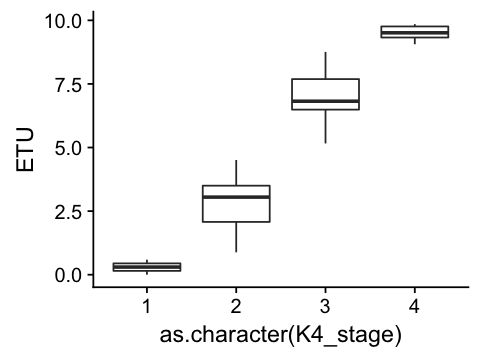

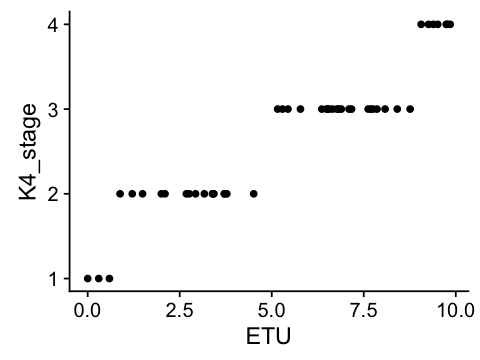

In [120]:
print("ETU summary by stage"); tapply(stage_factors$ETU, stage_factors$K4_stage, summary)
require(ggplot2)
options(repr.plot.width=4, repr.plot.height=3)
qplot(data=stage_factors, x=as.character(K4_stage), y=ETU, geom='boxplot')
qplot(data=stage_factors, x=ETU, y=K4_stage)

[1] "DAS summary by stage"


$`1`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
     61      61      61      61      61      61 

$`2`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  62.00   63.00   64.00   64.56   65.25   69.00 

$`3`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  62.00   68.00   70.00   69.33   71.00   75.00 

$`4`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  76.00   76.00   78.00   77.14   78.00   78.00 


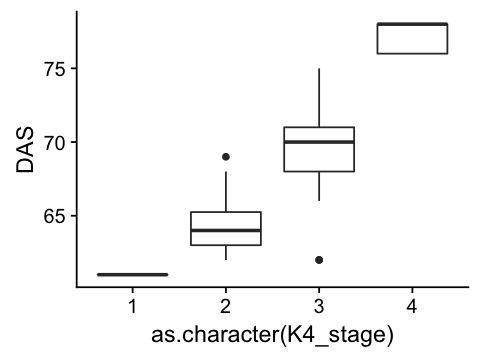

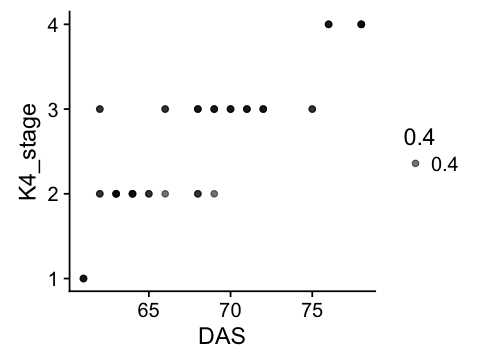

In [121]:
print("DAS summary by stage"); tapply(stage_factors$DAS, stage_factors$K4_stage, summary)
require(ggplot2)
options(repr.plot.width=4, repr.plot.height=3)
qplot(data=stage_factors, x=as.character(K4_stage), y=DAS, geom='boxplot')
qplot(data=stage_factors, x=DAS, y=K4_stage, alpha=0.4)

[1] "Panicle length summary by stage"


$`1`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.2480  0.3035  0.3590  0.5263  0.6655  0.9720 

$`2`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.955   1.342   1.751   1.789   1.944   3.233       4 

$`3`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.426   3.091   3.933   3.839   4.274   9.320 

$`4`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  9.768  14.100  16.040  14.940  16.660  17.290 


Warning message:
“Removed 4 rows containing non-finite values (stat_boxplot).”

Warning message:
“Removed 4 rows containing missing values (geom_point).”

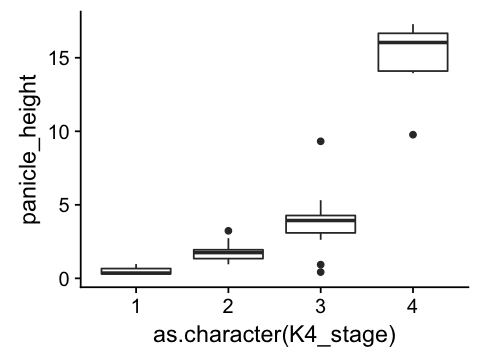

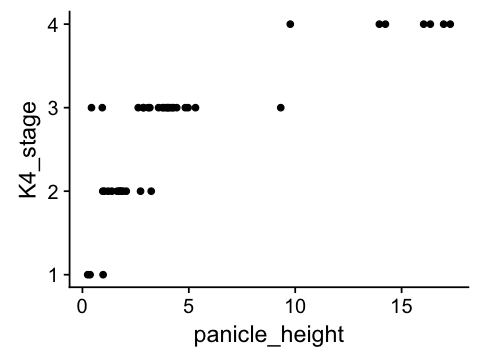

In [122]:
print("Panicle length summary by stage"); tapply(stage_factors$panicle_height, stage_factors$K4_stage, summary)
require(ggplot2)
options(repr.plot.width=4, repr.plot.height=3)
qplot(data=stage_factors, x=as.character(K4_stage), y=panicle_height, geom='boxplot')
qplot(data=stage_factors, x=panicle_height, y=K4_stage)

seems pretty useful.  *save*, to be used with morphological data

In [123]:
write.table(stage_factors, file="./deseq/ETU_K4_factors.txt", sep="\t", quote=F)

In [88]:
#create ETU model matrix and test add to DESeq object
coldata <- stage_factors[ order(row.names(stage_factors)), ]

#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = coldata,
                                design = ~ ETU,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)


ERROR: Error in eval(expr, envir, enclos): object 'stage_factors' not found


In [87]:
#create a VSD dataset to match DESeq filtering criteria
dds.vsd <- DESeqDataSetFromMatrix(countData = count,
                                colData = coldata,
                                design = ~ ETU,
                                tidy = F)
dds.vsd <- estimateSizeFactors(dds.vsd)
dds.vsd <- dds.vsd[ rowSums(counts(dds.vsd, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.vsd <- estimateDispersions(dds.vsd)
vsd <- varianceStabilizingTransformation(dds.vsd)
vsdWF <- assay(vsd)


ERROR: Error in nrow(colData): object 'coldata' not found


[1] "Intercept" "ETU"


out of 22755 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 5458, 24% 
LFC < 0 (down)   : 7753, 34% 
outliers [1]     : 0, 0% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



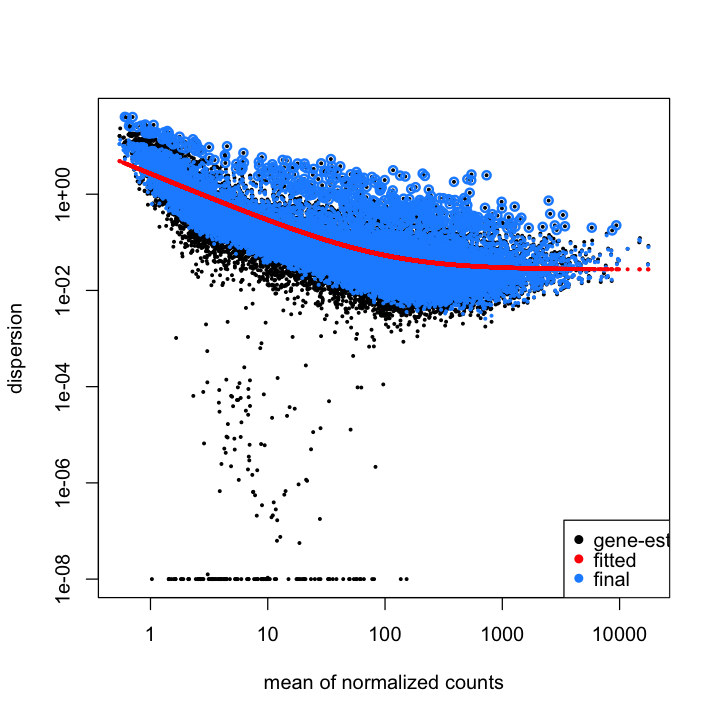

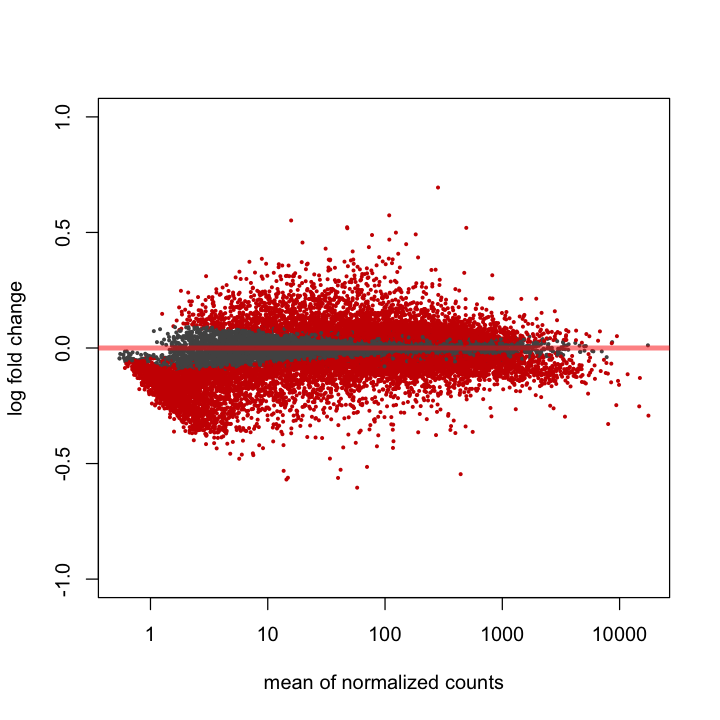

In [126]:
options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)
res <- results(ddsWF, contrasts=ETU, alpha=0.05)
summary(res)
plotMA(res, ylim=c(-1,1))

In [127]:
#Sort by log2FC
resOrdered <- res[rev(order(res$log2FoldChange)),]
resOrdered
#export as TSV
write.table(as.data.frame(resOrdered), 
            file="./deseq/ETU_affected_3s.5c.txt",
            sep="\t", quote=F)

log2 fold change (MAP): ETU 
Wald test p-value: ETU 
DataFrame with 22755 rows and 6 columns
                       baseMean log2FoldChange      lfcSE      stat
                      <numeric>      <numeric>  <numeric> <numeric>
Sobic.006G005900.v3.2 282.94165      0.6943109 0.03279470  21.17144
Sobic.006G092300.v3.2 108.54746      0.5739580 0.03380716  16.97741
Sobic.004G251350.v3.2  15.82863      0.5518285 0.03554329  15.52554
Sobic.001G459400.v3.2  47.48045      0.5226164 0.03209786  16.28197
Sobic.004G313100.v3.2 492.99114      0.5198635 0.03009237  17.27559
...                         ...            ...        ...       ...
Sobic.002G031800.v3.2 441.37944     -0.5458947 0.03047028 -17.91564
Sobic.009G260600.v3.2  14.85463     -0.5614005 0.04047031 -13.87191
Sobic.010G198500.v3.2  39.74479     -0.5621733 0.03752895 -14.97972
Sobic.010G198600.v3.2  14.42632     -0.5690895 0.03900234 -14.59116
Sobic.007G172800.v3.2  57.85053     -0.6043989 0.03143868 -19.22469
                       

In [7]:
head(coldata)

,K4_stage,ETU,DAS,panicle_height
SHSL001_01_S1.count.txt,4,9.74,78,17.286
SHSL001_02_S2.count.txt,4,9.51,78,16.976
SHSL001_03_S3.count.txt,4,9.85,78,14.238
SHSL001_04_S4.count.txt,4,9.78,78,16.038
SHSL001_05_S5.count.txt,4,9.26,76,16.349
SHSL001_06_S6.count.txt,4,9.39,76,13.954


In [9]:
write.csv(count, file="./BTx623_count.csv")
write.csv(vsdWF, file="./BTx623_vsdWF.csv")
write.csv(coldata, file="./BTx623_coldata.csv")

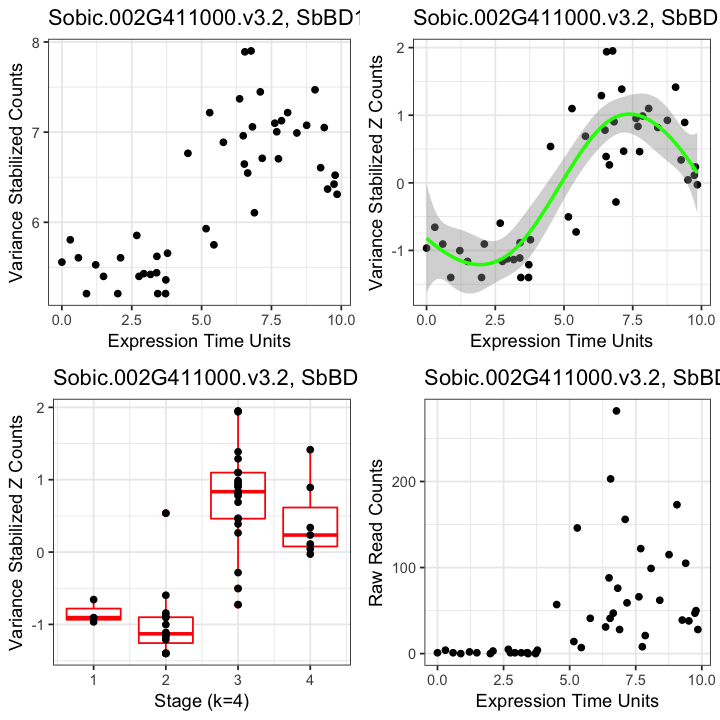

In [129]:
require(ggplot2)
require(cowplot)

GeneName <- "SbBD1"
GID <- "Sobic.002G411000.v3.2"
norm <- ggplot() +
            geom_point(aes(y=vsdWF[GID,], x=coldata$ETU)) +
            theme_bw() +
            xlab("Expression Time Units") +
            ylab("Variance Stabilized Counts") +
            ggtitle(paste(GID,GeneName, sep=", "))

zee <- ggplot() +
            geom_point(aes(y=scale(vsdWF[GID,]), x=coldata$ETU)) +
            theme_bw() +
            xlab("Expression Time Units") +
            ylab("Variance Stabilized Z Counts") +
            ggtitle(paste(GID,GeneName, sep=", ")) +
            geom_smooth(aes(y=scale(vsdWF[GID,]), x=coldata$ETU), method = "lm", formula = y ~ splines::bs(x, 5), color='green')

avg <- ggplot() +
            geom_boxplot(aes(y=scale(vsdWF[GID,]), x=coldata$K4_stage, group=coldata$K4_stage), color="red") +
            geom_point(aes(y=scale(vsdWF[GID,]), x=coldata$K4_stage)) +
            theme_bw() +
            xlab("Stage (k=4)") +
            ylab("Variance Stabilized Z Counts") +
            ggtitle(paste(GID,GeneName, sep=", ")) 
 

raw <- ggplot() +
            geom_point(aes(y=as.numeric(count[GID,]), x=coldata$ETU)) +
            theme_bw() +
            xlab("Expression Time Units") +
            ylab("Raw Read Counts") +
            ggtitle(paste(GID,GeneName, sep=", "))
            
options(repr.plot.width=6, repr.plot.height=6)
plot_grid(norm, zee, avg, raw)


In [130]:

plotGene <- function(GID, GeneName) {

    require(ggplot2)
    require(cowplot)

    norm <- ggplot() +
            geom_point(aes(y=vsdWF[GID,], x=coldata$ETU)) +
            theme_bw() +
            xlab("Expression Time Units") +
            ylab("Variance Stabilized Counts") +
            ggtitle(paste(GID,GeneName, sep="   "))
    
    zee <- ggplot() +
            geom_point(aes(y=scale(vsdWF[GID,]), x=coldata$ETU)) +
            theme_bw() +
            xlab("Expression Time Units") +
            ylab("Variance Stabilized Z Counts") +
            ggtitle(paste(GID,GeneName, sep="   ")) +
            geom_smooth(aes(y=scale(vsdWF[GID,]), x=coldata$ETU), method = "lm", formula = y ~ splines::bs(x, 5), color='green')

    avg <- ggplot() +
            geom_boxplot(aes(y=scale(vsdWF[GID,]), x=coldata$K4_stage, group=coldata$K4_stage), color="red") +
            geom_point(aes(y=scale(vsdWF[GID,]), x=coldata$K4_stage)) +
            theme_bw() +
            xlab("Stage (k=4)") +
            ylab("Variance Stabilized Z Counts") +
            ggtitle(paste(GID,GeneName, sep="   ")) 


    raw <- ggplot() +
            geom_point(aes(y=as.numeric(count[GID,]), x=coldata$ETU)) +
            theme_bw() +
            xlab("Expression Time Units") +
            ylab("Raw Read Counts") +
            ggtitle(paste(GID,GeneName, sep="   "))
            
    ggsave(file=paste("./deseq/geneplot_",GeneName,".pdf",sep=""), 
           plot=plot_grid(norm, zee, avg, raw),
           height=6, width=6, units="in",
           device="pdf")

    }



# GID_v3	MarkerName
Sobic.002G411000.v3.2	SbBD1
Sobic.007G210200.v3.2	SbUB2
Sobic.007G210200.v3.2	SbUB3
Sobic.003G036950.v3.2	SbCG1
Sobic.003G344501.v3.2	SbBA1
Sobic.002G197700.v3.2	SbRA1
Sobic.003G052900.v3.2	SbRA2
Sobic.002G381600.v3.2	SbRA3
Sobic.003G044900.v3.2	SbBIF1
Sobic.009G069700.v3.2	SbBIF4
Sobic.008G170500.v3.2	SbBIF2
Sobic.003G052700.v3.2	SbVT2
Sobic.003G236900.v3.2	SbSPI1
Sobic.002G247800.v3.2	SbTSH4
Sobic.004G306500.v3.2	SbTU1
Sobic.007G193500.v3.2	SbTGA1
Sobic.004G281000.v3.2	SbBDE1/ZAG3
Sobic.002G198400.v3.2	SbWAB1/BAD1
Sobic.006G247700.v3.2	SbLG1
Sobic.003G363600.v3.2	SbLG2
Sobic.010G110100.v3.2	SbFEA4
Sobic.010G267700.v3.2	SbTD1
Sobic.001G468400.v3.2	SbGT1
Sobic.001G121600.v3.2	SbTB1
Sobic.010G027300.v3.2	SbBAF1
Sobic.001G195800.v3.2	SbTLS1

In [10]:
markers <- read.table (text=
"Sobic.007G136900.v3.2	gene1
Sobic.007G137000.v3.2	gene2
Sobic.007G137100.v3.2	gene3
Sobic.007G137101.v3.2	gene4
Sobic.002G411000.v3.2	SbBD1
Sobic.007G210200.v3.2	SbUB2
Sobic.007G210200.v3.2	SbUB3
Sobic.003G344501.v3.2	SbBA1
Sobic.002G197700.v3.2	SbRA1
Sobic.003G052900.v3.2	SbRA2
Sobic.002G381600.v3.2	SbRA3
Sobic.003G044900.v3.2	SbBIF1
Sobic.009G069700.v3.2	SbBIF4
Sobic.008G170500.v3.2	SbBIF2
Sobic.003G052700.v3.2	SbVT2
Sobic.003G236900.v3.2	SbSPI1
Sobic.002G247800.v3.2	SbTSH4
Sobic.004G306500.v3.2	SbTU1
Sobic.007G193500.v3.2	SbTGA1
Sobic.004G281000.v3.2	SbBDE1_ZAG3
Sobic.002G198400.v3.2	SbWAB1_BAD1
Sobic.006G247700.v3.2	SbLG1
Sobic.003G363600.v3.2	SbLG2
Sobic.010G110100.v3.2	SbFEA4
Sobic.010G267700.v3.2	SbTD1
Sobic.001G468400.v3.2	SbGT1
Sobic.010G027300.v3.2	SbBAF1
Sobic.001G195800.v3.2	SbTLS1", 
header=F, sep="\t")

In [11]:
for (marker in 1:nrow(markers)) {
    plotGene( as.character(markers[marker,1]) , as.character(markers[marker,2]) )
    
}

Loading required package: ggplot2
Loading required package: cowplot

Attaching package: ‘cowplot’

The following object is masked from ‘package:ggplot2’:

    ggsave



In [241]:
plotGene("Sobic.001G106200.v3.2","SbKN1")

In [776]:
## lets do some SOM stuff

# all the packages needed for this analysis
# 'require' will load the package, if not already loaded into your workspace
# will return an error if the package is not available on your computer

require(kohonen)
require(reshape)
require(colorRamps)
require(ggplot2)

# read data into a data.frame named 'res'
# in this case, 'res <- t(scale(log(t(selected_genes))) as defined above
# the kohonen package works with a data type called a data.matrix
# it's easy to make from a data.frame

res <- t(scale(t(vsdWF)))
fitted_cpm <- data.matrix(res)



Loading required package: kohonen
Loading required package: reshape

Attaching package: ‘reshape’

The following objects are masked from ‘package:S4Vectors’:

    expand, rename

Loading required package: colorRamps


In [796]:
# use the kohonen package to create a 'grid' of nodes
# empirically test the largest grid you can produce without any empty nodes

som_grid <- somgrid(xdim=5, ydim=5, topo="hexagonal")

# run the clustering algorithm, rlen = number of iterations, alpha = decaying learning rate

som_model <- som(fitted_cpm, grid=som_grid, rlen=20000, alpha=c(0.15,0.01), keep.data = TRUE)


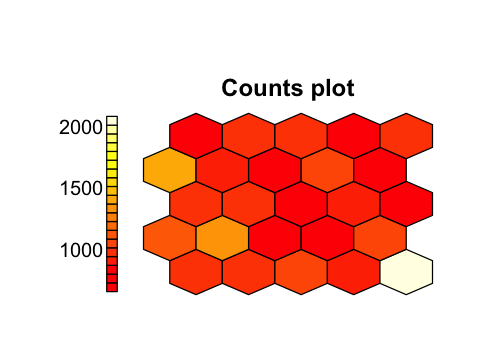

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  656.0   846.0   971.0   989.1  1013.0  2082.0 

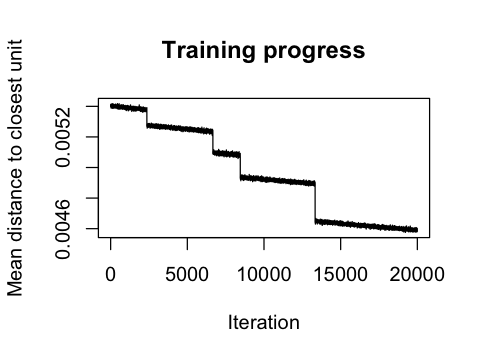

In [797]:
# might be fun to check some of the kohonen object diagnostic plots
# try one type at a type
options(repr.plot.width=4, repr.plot.height=3)
som_counts <- plot(som_model, type = "counts", shape = "straight")
plot(som_model, type = "changes")

summary(som_counts)


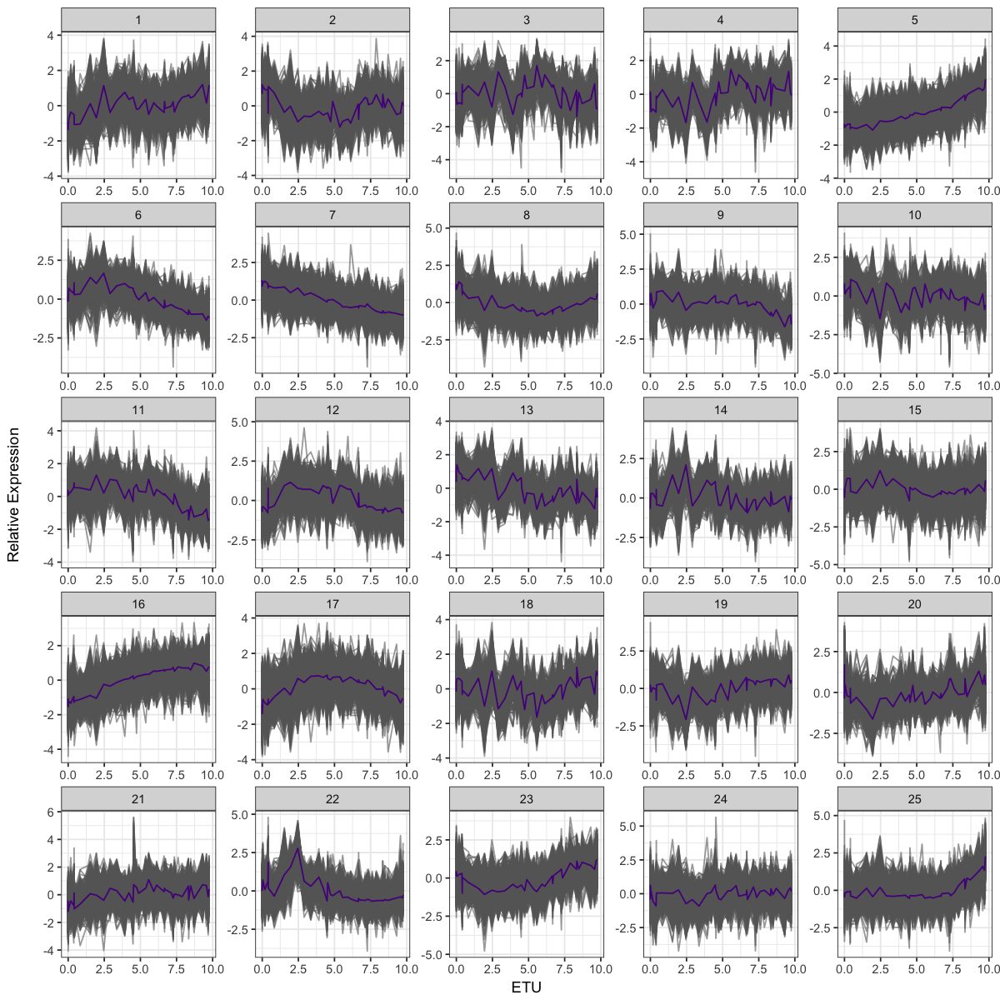

In [805]:
# extract and plot the data, but first write to file

som_result <- cbind(fitted_cpm, as.factor(som_model$unit.classif))
colnames(som_result)[ncol(som_result)] <- "Node"  # change last column name to Node
#write.table(som_result, file="SOM_10x10_Dec15.txt", sep="\t", quote=F)

# as a heatmap (dendrogram optional: dendrogram = c("both","row","column","none"))

#som_sorted <- som_result[order(som_result[,ncol(som_result)]),]
#som_colors <- primary.colors(length(levels(as.factor(som_model$unit.classif))))[som_result[,ncol(som_result)]]
#heatmap.2(t(som_result[,ncol(som_result)]), Rowv=F, Colv=F, scale="column", ColSideColors=som_colors, trace="none", col="topo.colors")

# as line graphs (this one was hard to code)


node_values <- as.matrix(data.frame(som_model$codes)) #the 'codes' data.frame created by the kohonen package contains all the node values
rownames(node_values) <- c(1:nrow(data.frame(som_model$codes)))  #very ugly way to make clean rownames
colnames(node_values) <- temp$ETU #change names to ETU values
node <- melt(as.matrix(node_values), varnames=c("Node", "ETU"))  #separate node names and values to a long, value-by-value format
colnames(node)[3] <- "CPM" # add back label for CPM values

colnames(fitted_cpm) <- temp$ETU #change names to ETU values
somplot <- melt(as.matrix(fitted_cpm), varnames=c("GeneID", "ETU"))
somplot <- cbind(somplot, som_result[,ncol(som_result)][as.character(somplot[,1])]) #look up Node in som_result by GeneID in somplot
colnames(somplot)[3:4] <- c("CPM", "Node")

#pdf(file="som_linegraph.pdf", wi=9, he=9)
# try one type at a type
options(repr.plot.width=10, repr.plot.height=10)
ggplot(data = somplot, aes(x=ETU, y=CPM, group=GeneID, color=as.factor(Node))) + 
	geom_line(color="grey40", alpha=0.6) + 
	geom_line(data = node, aes(x=ETU, y=CPM, group=Node), color = "purple4") + 
	theme_bw() + 
	facet_wrap(~Node, scales="free") + 
	ylab("Relative Expression")
#dev.off()


#Looks real bad, too many fine details
#try summarizing by stage??

In [194]:
stage_vsd <- t(scale(t(vsdWF)))

colnames(stage_vsd) <- coldata$K4_stage
stage_mean <- as.data.frame(sapply(unique(colnames(stage_vsd)), 
                                   function(col) rowMeans(stage_vsd[,colnames(stage_vsd) == col])))
                                       
head(stage_vsd); head(stage_mean)

,4,4,4,4,4,4,4,3,3,3,⋯,2,2,2,3,2,2,3,1,1,1
Sobic.001G000100.v3.2,0.09190084,0.1608574,-0.10898583,1.0466890,-0.02272183,-0.2043233,-1.0722447,-1.0722446751,1.5766936,1.78123072,⋯,-1.0722447,-1.0722447,-1.0722447,-0.0473699,-1.0722447,-1.07224468,0.02709577,-1.0722447,2.2208254,-1.0722447
Sobic.001G000200.v3.2,0.12970946,0.8746852,0.12332299,1.1667053,-0.83339486,0.6300130,2.0337261,0.5001174461,1.5894762,-0.04409644,⋯,-0.2926498,0.4885579,-0.8478744,0.2118689,-0.4665109,0.28946128,2.00807722,-0.9389039,-1.1472934,0.3792819
Sobic.001G000400.v3.2,0.50214368,0.2363526,0.97123179,0.7976903,-1.73757890,-0.7782057,-0.6082069,0.4933005803,1.0105975,1.01919405,⋯,-0.5728651,-0.3427785,-1.4216552,0.5980408,-0.9185087,-0.08213118,1.49703825,0.6230692,1.0663389,-0.8305423
Sobic.001G000700.v3.2,-0.11975725,1.8952393,-0.35727984,0.8809026,0.36246116,1.3812047,1.7531621,0.6583145367,0.3800182,1.47169934,⋯,0.1468000,-0.3003387,-2.3443942,-0.1690843,-0.5517019,-0.19153752,0.83216684,-0.1973167,-0.8464328,-1.0397401
Sobic.001G000800.v3.2,0.18323037,-1.3446536,-0.01578669,0.7723221,-0.16810658,0.4437366,0.7901862,-0.3889337804,1.2660656,2.36317826,⋯,-0.9383662,-0.5577628,-0.1129645,0.6564628,0.7030573,0.06936039,0.14240361,-1.1782839,-0.9109233,-1.6416829
Sobic.001G000900.v3.2,0.43993301,-0.4469670,-0.03807523,-0.4527876,-1.61330872,-0.7923768,0.1965256,-0.0003706032,1.0899228,0.30271938,⋯,-0.1977664,-1.6133087,-1.6133087,-0.2437920,3.1204741,-0.64707145,-0.87760841,2.1400494,1.2350228,-0.1196320


,4,3,2,1
Sobic.001G000100.v3.2,-0.01554693,0.34397441,-0.44943564,0.02544534
Sobic.001G000200.v3.2,0.58925246,0.23466752,-0.45911686,-0.56897182
Sobic.001G000400.v3.2,-0.08808187,0.42733012,-0.57601407,0.28628862
Sobic.001G000700.v3.2,0.82799038,0.28347471,-0.60408825,-0.69449656
Sobic.001G000800.v3.2,0.09441834,0.12737312,0.02469539,-1.24363005
Sobic.001G000900.v3.2,-0.38672239,-0.04956011,0.03077367,1.08514676


In [870]:
# read data into a data.frame named 'res'
# in this case, 'res <- t(scale(log(t(selected_genes))) as defined above
# the kohonen package works with a data type called a data.matrix
# it's easy to make from a data.frame

res <- stage_mean
cpm <- data.matrix(res)


In [920]:
# use the kohonen package to create a 'grid' of nodes
# empirically test the largest grid you can produce without any empty nodes

som_grid <- somgrid(xdim=20, ydim=20, topo="hexagonal")

# run the clustering algorithm, rlen = number of iterations, alpha = decaying learning rate

som_model <- som(cpm, grid=som_grid, rlen=50000, alpha=c(0.15,0.01), keep.data = TRUE)


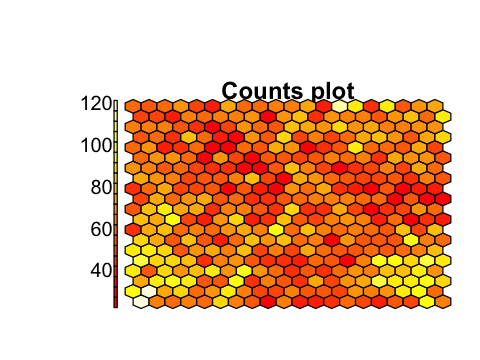

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  22.00   51.00   61.00   61.82   72.00  121.00 

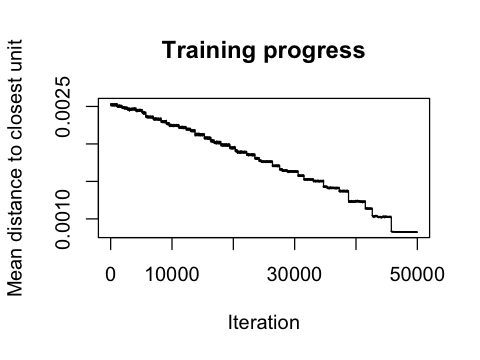

In [921]:
# might be fun to check some of the kohonen object diagnostic plots
# try one type at a type
options(repr.plot.width=4, repr.plot.height=3)
som_counts <- plot(som_model, type = "counts", shape = "straight")
plot(som_model, type = "changes")

summary(som_counts)

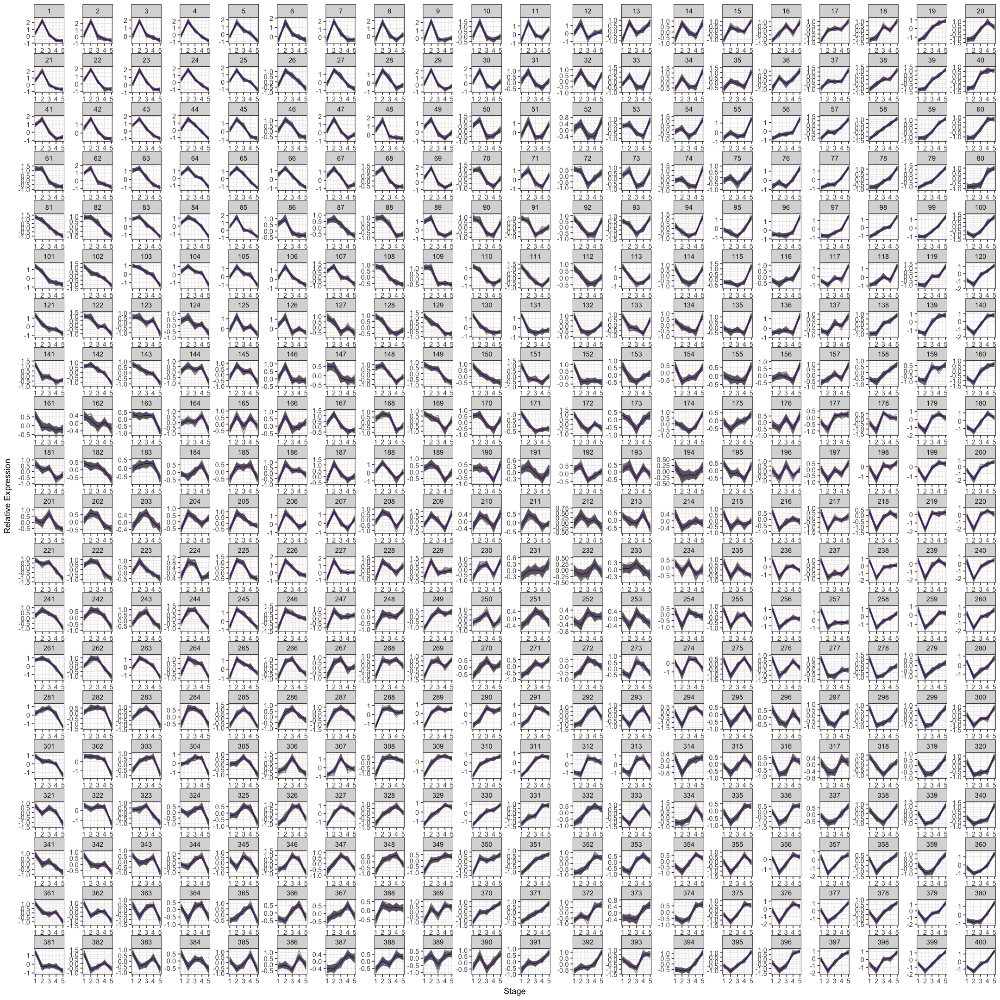

In [934]:
# extract and plot the data, but first write to file

som_result <- cbind(cpm, as.factor(som_model$unit.classif))
colnames(som_result)[ncol(som_result)] <- "Node"  # change last column name to Node
#write.table(som_result, file="SOM_10x10_Dec15.txt", sep="\t", quote=F)

# as a heatmap (dendrogram optional: dendrogram = c("both","row","column","none"))

#som_sorted <- som_result[order(som_result[,ncol(som_result)]),]
#som_colors <- primary.colors(length(levels(as.factor(som_model$unit.classif))))[som_result[,ncol(som_result)]]
#heatmap.2(t(som_result[,ncol(som_result)]), Rowv=F, Colv=F, scale="column", ColSideColors=som_colors, trace="none", col="topo.colors")

# as line graphs (this one was hard to code)


node_values <- som_model$codes[[1]] #the 'codes' data.frame created by the kohonen package contains all the node values
rownames(node_values) <- c(1:nrow(som_model$codes[[1]]))  #very ugly way to make clean rownames
#colnames(node_values) <- temp$ETU #change names to ETU values
node <- melt(node_values, varnames=c("Node", "Stage"))  #separate node names and values to a long, value-by-value format
colnames(node)[3] <- "CPM" # add back label for CPM values

#colnames(cpm) <- temp$ETU #change names to ETU values
somplot <- melt(as.matrix(cpm), varnames=c("GeneID", "Stage"))
somplot <- cbind(somplot, som_result[,ncol(som_result)][as.character(somplot[,1])]) #look up Node in som_result by GeneID in somplot
colnames(somplot)[3:4] <- c("CPM", "Node")

#pdf(file="som_linegraph.pdf", wi=9, he=9)
# try one type at a type
options(repr.plot.width=18, repr.plot.height=18)
ggplot(data = somplot, aes(x=Stage, y=CPM, group=GeneID, color=as.factor(Node))) + 
	geom_line(color="grey40", alpha=0.6) + 
	geom_line(data = node, aes(x=Stage, y=CPM, group=Node), color = "purple4") + 
	theme_bw() + 
    theme(panel.spacing= unit(1, "points")) +
	facet_wrap(~Node, scales="free", ncol=20) + 
	ylab("Relative Expression")
#dev.off()


# Still too many patterns, but it's looking much better
Data reduction is necessary.
Perhaps DEG between stages will help?

In [137]:
#create Stage K=5 model matrix and test add to DESeq object
coldata <- stage_factors[ order(row.names(stage_factors)), ]
coldata$K4_stage <- as.factor(coldata$K4_stage)

#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = coldata,
                                design = ~ K4_stage,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)


using pre-existing size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 342 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


[1] "Intercept" "K4_stage1" "K4_stage2" "K4_stage3" "K4_stage4"

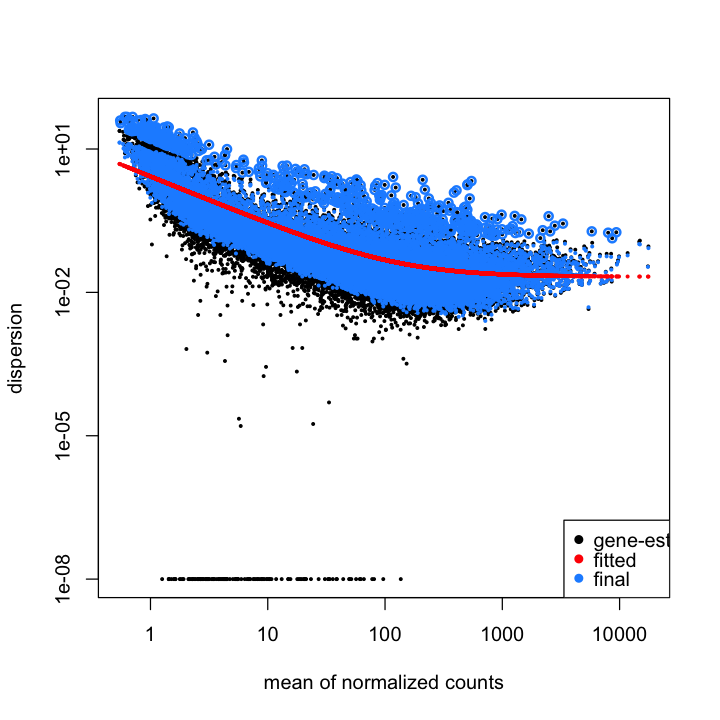

In [138]:
options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)

res43 <- results(ddsWF, contrast=list(c("K4_stage4","K4_stage3")), alpha=0.05)
res32 <- results(ddsWF, contrast=list(c("K4_stage3","K4_stage2")), alpha=0.05)
res21 <- results(ddsWF, contrast=list(c("K4_stage2","K4_stage1")), alpha=0.05)



out of 22755 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 4864, 21% 
LFC < 0 (down)   : 6979, 31% 
outliers [1]     : 291, 1.3% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



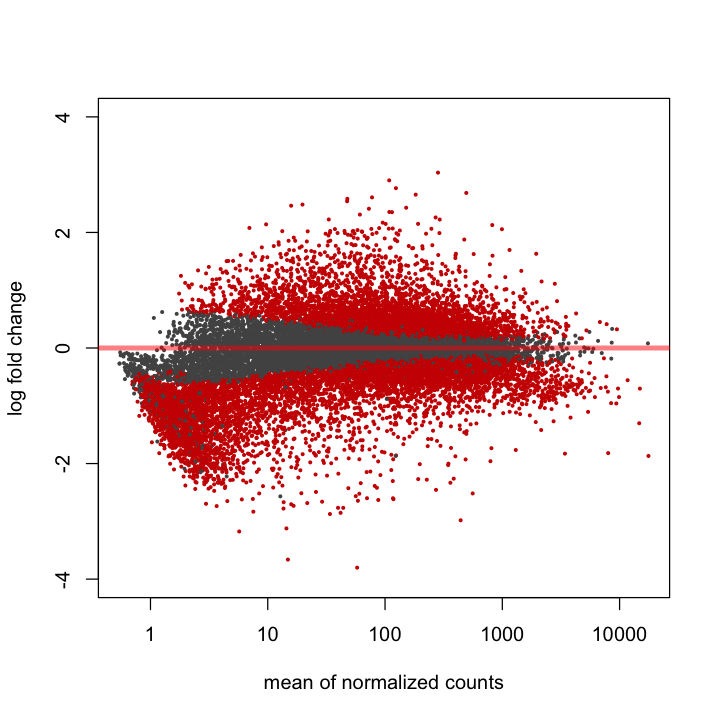

In [139]:
summary(res43);
plotMA(res43,ylim=c(-4,4));


out of 22755 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 2524, 11% 
LFC < 0 (down)   : 3221, 14% 
outliers [1]     : 291, 1.3% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



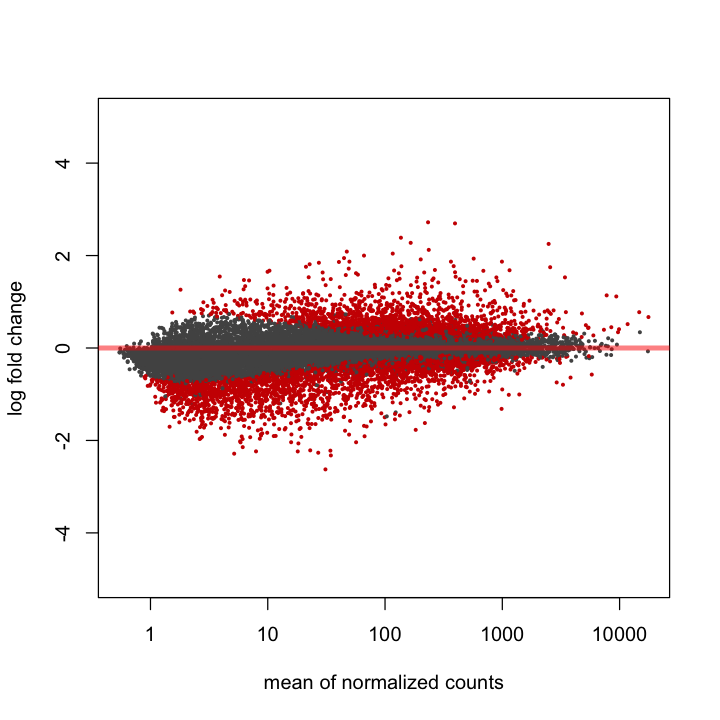

In [140]:
summary(res32);
plotMA(res32,ylim=c(-5,5));


out of 22755 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 6979, 31% 
LFC < 0 (down)   : 4864, 21% 
outliers [1]     : 291, 1.3% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



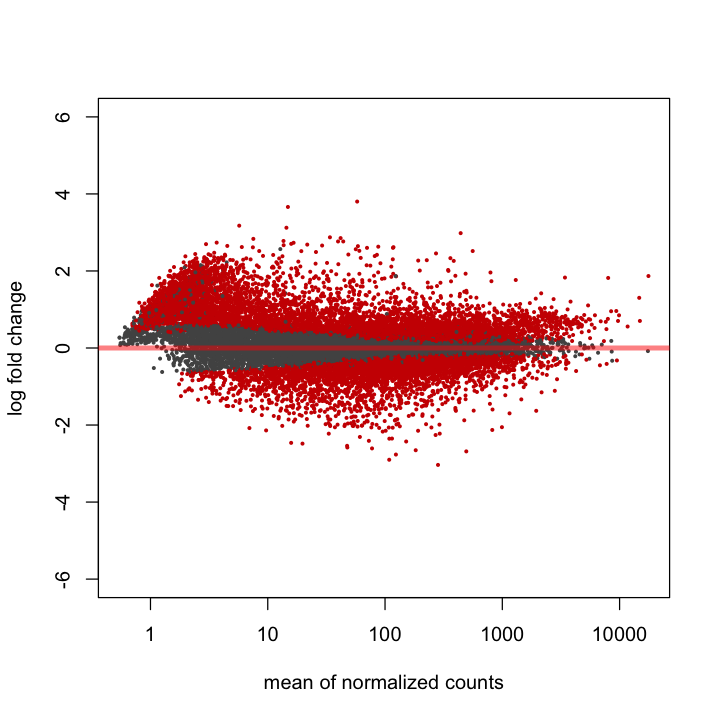

In [141]:
summary(res21);
plotMA(res21, ylim=c(-6,6));

In [142]:
pairwise.res <- cbind(res21,res32,res43)
#export as TSV
write.table(as.data.frame(pairwise.res), 
            file="./deseq/continuous_pairwise_3s.5c.txt",
            sep="\t", quote=F)

In [143]:
#Filter by padj
pair_sigs <- c(rownames(subset(res21, padj < 0.05)), 
               rownames(subset(res32, padj < 0.05)), 
               rownames(subset(res43, padj < 0.05)))
#make into count table -- counts number of occurances in list
pair_table <- table(pair_sigs)
#appears 1+ times
dim(pair_table)
#appears 2+ times
dim(pair_table[pair_table > 1])
#appears 3+ times
dim(pair_table[pair_table > 2])
#appears 4 times
dim(pair_table[pair_table > 3])

[1] 14469

[1] 11843

[1] 3119

NULL

In [991]:
#Try different subsets of total stage mean scaled values by DE thresholds
#DE 2+ times -- minmum for 'up' and 'down'
res <- stage_mean[rownames(pair_table > 3),]
cpm <- data.matrix(res)

In [998]:
# use the kohonen package to create a 'grid' of nodes
# empirically test the largest grid you can produce without any empty nodes

som_grid <- somgrid(xdim=20, ydim=20, topo="hexagonal")

# run the clustering algorithm, rlen = number of iterations, alpha = decaying learning rate

som_model <- som(cpm, grid=som_grid, rlen=50000, alpha=c(0.15,0.01), keep.data = TRUE)


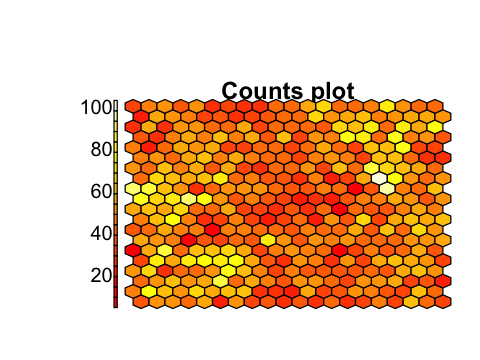

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   4.00   36.00   45.00   46.40   55.25  103.00 

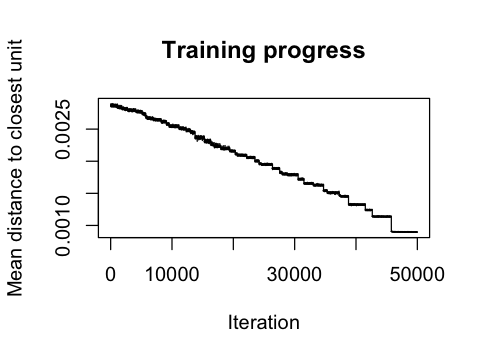

In [999]:
# might be fun to check some of the kohonen object diagnostic plots
# try one type at a type
options(repr.plot.width=4, repr.plot.height=3)
som_counts <- plot(som_model, type = "counts", shape = "straight")
plot(som_model, type = "changes")

summary(som_counts)

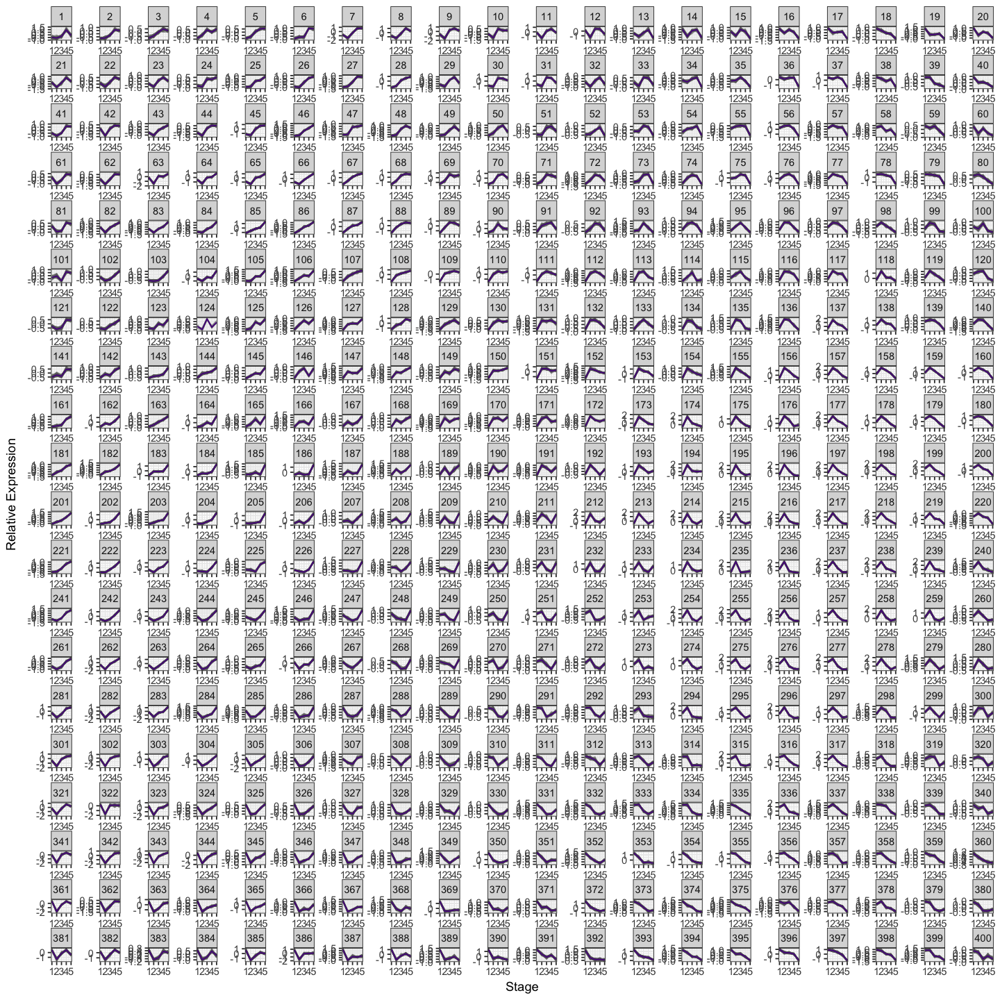

In [1000]:
# extract and plot the data, but first write to file

som_result <- cbind(cpm, as.factor(som_model$unit.classif))
colnames(som_result)[ncol(som_result)] <- "Node"  # change last column name to Node
#write.table(som_result, file="SOM_10x10_Dec15.txt", sep="\t", quote=F)

# as a heatmap (dendrogram optional: dendrogram = c("both","row","column","none"))

#som_sorted <- som_result[order(som_result[,ncol(som_result)]),]
#som_colors <- primary.colors(length(levels(as.factor(som_model$unit.classif))))[som_result[,ncol(som_result)]]
#heatmap.2(t(som_result[,ncol(som_result)]), Rowv=F, Colv=F, scale="column", ColSideColors=som_colors, trace="none", col="topo.colors")

# as line graphs (this one was hard to code)


node_values <- som_model$codes[[1]] #the 'codes' data.frame created by the kohonen package contains all the node values
rownames(node_values) <- c(1:nrow(som_model$codes[[1]]))  #very ugly way to make clean rownames
#colnames(node_values) <- temp$ETU #change names to ETU values
node <- melt(node_values, varnames=c("Node", "Stage"))  #separate node names and values to a long, value-by-value format
colnames(node)[3] <- "CPM" # add back label for CPM values

#colnames(cpm) <- temp$ETU #change names to ETU values
somplot <- melt(as.matrix(cpm), varnames=c("GeneID", "Stage"))
somplot <- cbind(somplot, som_result[,ncol(som_result)][as.character(somplot[,1])]) #look up Node in som_result by GeneID in somplot
colnames(somplot)[3:4] <- c("CPM", "Node")

#pdf(file="som_linegraph.pdf", wi=9, he=9)
# try one type at a type
options(repr.plot.width=12, repr.plot.height=12)
ggplot(data = somplot, aes(x=Stage, y=CPM, group=GeneID, color=as.factor(Node))) + 
	geom_line(color="grey40", alpha=0.6) + 
	geom_line(data = node, aes(x=Stage, y=CPM, group=Node), color = "purple4") + 
	theme_bw() + 
    theme(panel.spacing= unit(1, "points")) +
	facet_wrap(~Node, scales="free") + 
	ylab("Relative Expression")
#dev.off()


In [144]:
### try a random forest walk? 
#did you bring your boots?

require(randomForest)

#try forest on all genes, with ETU as a continuous response group
set.seed(1234)
print(date())
rf.1 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=1000)
rf.2 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=2000)
rf.3 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=3000)
rf.4 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=4000)
rf.5 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=5000)
rf.6 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=6000)
rf.7 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=7000)
rf.8 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=8000)
rf.9 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=9000)
rf.10 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=10000)
print(date())

Loading required package: randomForest
randomForest 4.6-12
Type rfNews() to see new features/changes/bug fixes.

Attaching package: ‘randomForest’

The following object is masked from ‘package:ggplot2’:

    margin

The following object is masked from ‘package:Biobase’:

    combine

The following object is masked from ‘package:BiocGenerics’:

    combine



[1] "Wed Feb 14 23:42:56 2018"
[1] "Thu Feb 15 00:34:56 2018"


In [145]:
print(rf.1);print(rf.2);print(rf.3);print(rf.4);print(rf.5)
print(rf.6);print(rf.7);print(rf.8);print(rf.9);print(rf.10)


Call:
 randomForest(x = t(vsdWF), y = coldata$ETU, ntree = 1000) 
               Type of random forest: regression
                     Number of trees: 1000
No. of variables tried at each split: 7585

          Mean of squared residuals: 0.7391493
                    % Var explained: 91.02

Call:
 randomForest(x = t(vsdWF), y = coldata$ETU, ntree = 2000) 
               Type of random forest: regression
                     Number of trees: 2000
No. of variables tried at each split: 7585

          Mean of squared residuals: 0.7181165
                    % Var explained: 91.28

Call:
 randomForest(x = t(vsdWF), y = coldata$ETU, ntree = 3000) 
               Type of random forest: regression
                     Number of trees: 3000
No. of variables tried at each split: 7585

          Mean of squared residuals: 0.7716602
                    % Var explained: 90.63

Call:
 randomForest(x = t(vsdWF), y = coldata$ETU, ntree = 4000) 
               Type of random forest: regression
     

mtry = 490  OOB error = 0.6629139 
Searching left ...
mtry = 467 	OOB error = 0.6685825 
-0.008550918 0.001 
Searching right ...
mtry = 514 	OOB error = 0.6646934 
-0.00268435 0.001 
    mtry  OOBError
467  467 0.6685825
490  490 0.6629139
514  514 0.6646934
[1] 490


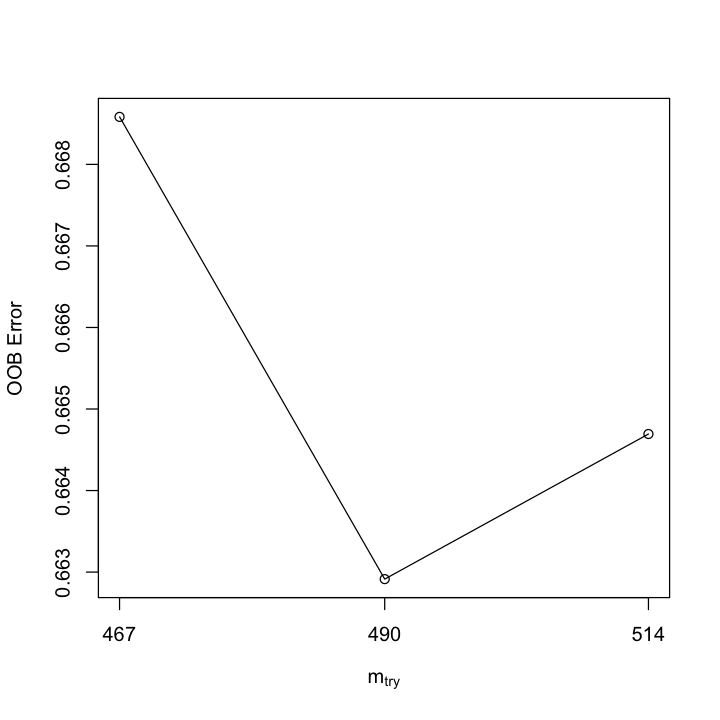

In [151]:
require(randomForest)
mtry <- tuneRF(x=t(vsdWF), y=coldata$ETU, ntreeTry=9000, mtryStart=490,
               stepFactor=1.05,improve=0.001, trace=TRUE, plot=TRUE)
best.m <- mtry[mtry[, 2] == min(mtry[, 2]), 1]
print(mtry)
print(best.m)

In [152]:
print(date())
rf <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=9000, mtry=490, importance=TRUE)
print(date())

[1] "Thu Feb 15 10:13:57 2018"
[1] "Thu Feb 15 10:14:47 2018"


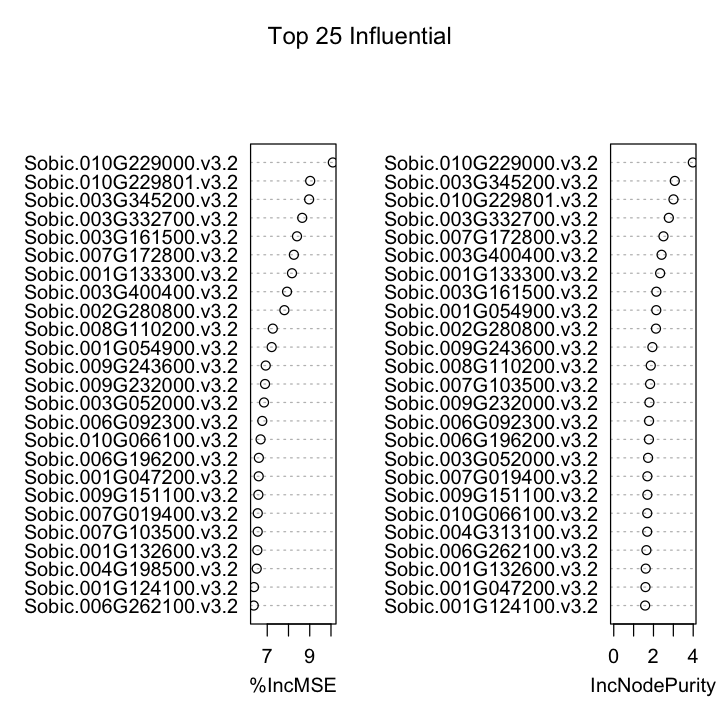

In [153]:
varImpPlot(rf, n.var=25, main="Top 25 Influential")

In [154]:
#extract influence metrics from random forest generation
influence <- importance(rf)

In [155]:
#order by error and output
head(influence[order(influence[,1], decreasing=T),])
influence.order <- influence[order(influence[,1], decreasing=T),]
write.table(influence.order, 
            file="./deseq/randomForest_vsd_3s.5c.txt", sep="\t", quote=F)

,%IncMSE,IncNodePurity
Sobic.010G229000.v3.2,10.087178,3.981502
Sobic.010G229801.v3.2,9.021691,3.007063
Sobic.003G345200.v3.2,8.971281,3.073422
Sobic.003G332700.v3.2,8.645989,2.773684
Sobic.003G161500.v3.2,8.401126,2.144341
Sobic.007G172800.v3.2,8.253056,2.503496


In [156]:
colnames(influence) <- c("IncMSE","IncNodePurity") 
head(influence)

,IncMSE,IncNodePurity
Sobic.001G000100.v3.2,0.0000000,4.770898e-05
Sobic.001G000200.v3.2,-1.0000556,8.355472e-05
Sobic.001G000400.v3.2,-0.2939229,5.870327e-04
Sobic.001G000700.v3.2,0.0000000,0.000000e+00
Sobic.001G000800.v3.2,-1.2798355,1.417229e-04
Sobic.001G000900.v3.2,1.0000556,8.625423e-05


Warning message in log(IncMSE):
“NaNs produced”Warning message in log(IncMSE):
“NaNs produced”Warning message:
“Removed 9687 rows containing non-finite values (stat_bin).”

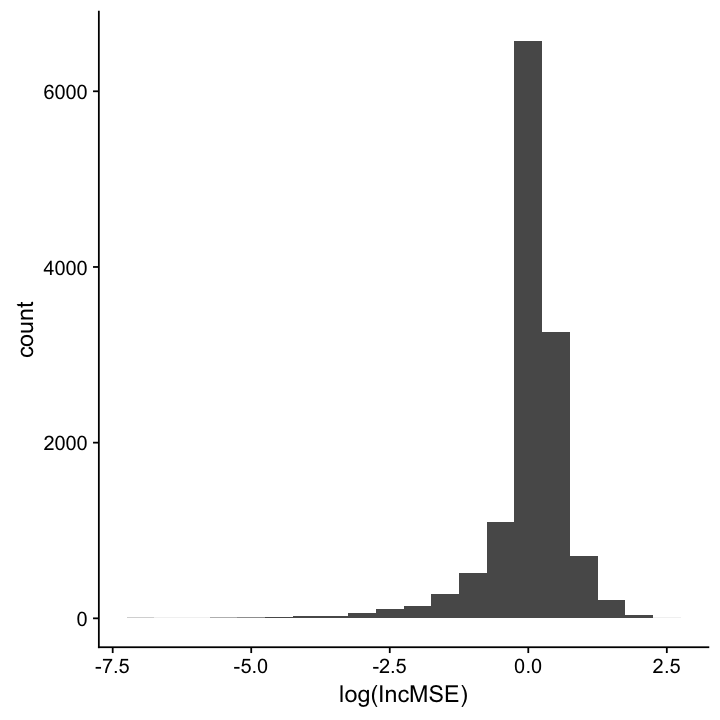

In [157]:
inf.df <- data.frame(influence)
ggplot(inf.df, aes(x=log(IncMSE))) + geom_histogram(binwidth=0.5)

Warning message:
“Removed 968 rows containing non-finite values (stat_bin).”

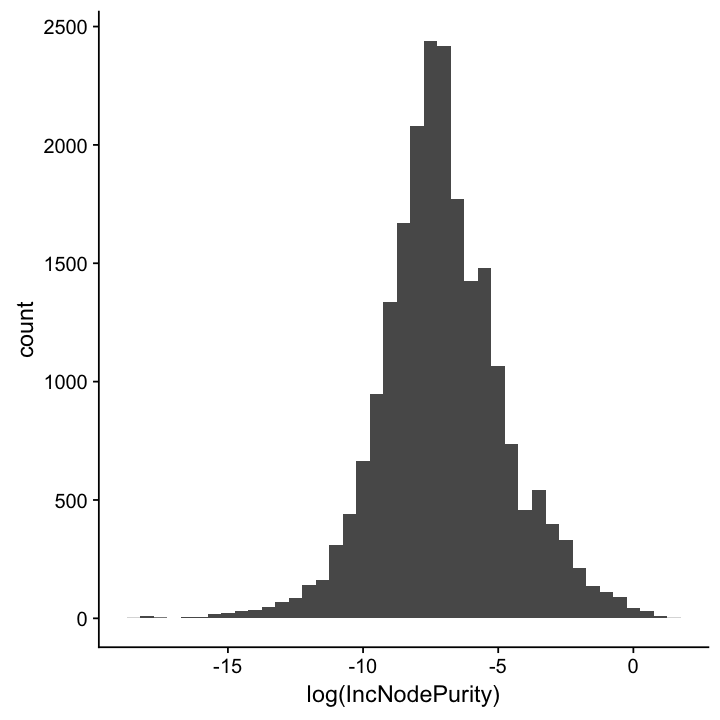

In [158]:
ggplot(inf.df, aes(x=log(IncNodePurity))) + geom_histogram(binwidth=0.5)

Warning message in log(IncMSE):
“NaNs produced”Warning message in log(IncMSE):
“NaNs produced”Warning message:
“Removed 6997 rows containing missing values (geom_point).”

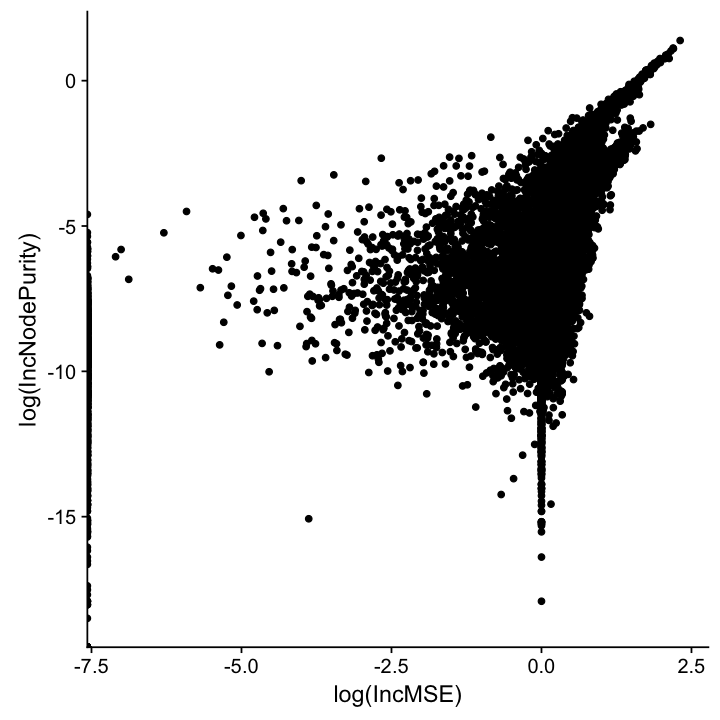

In [159]:
ggplot(inf.df, aes(x=log(IncMSE), y=log(IncNodePurity))) + geom_point()

[1] "Sat Feb  3 00:09:09 2018"


Warning message:
“closing unused connection 9 (<-localhost:11079)”Warning message:
“closing unused connection 8 (<-localhost:11079)”Warning message:
“closing unused connection 7 (<-localhost:11079)”Warning message:
“closing unused connection 6 (<-localhost:11079)”Warning message:
“closing unused connection 5 (<-localhost:11079)”Warning message:
“closing unused connection 4 (<-localhost:11079)”

In [1140]:
#try looking at the top 50 forest informers
forest.marker <- read.table(text=
"GRMZM2G026556	BOP2L
GRMZM2G476538	ILL6L
GRMZM2G027302	LSH6L
GRMZM5G873964	UNK
GRMZM2G383735	DUF1677
GRMZM5G851485	UNK_TF
GRMZM2G059314	NADPOx
GRMZM2G353076	zhd9
GRMZM2G070252	P_loop
GRMZM2G352132	Reticulon
GRMZM2G354909	NADPRoss
GRMZM2G134306	NTTL
GRMZM2G022606	BOP1L
GRMZM2G400156	SAUR33
GRMZM2G047759	UNK
GRMZM2G073931	UNK
GRMZM2G165987	PirinL
GRMZM2G446234	DUF593
GRMZM2G700200	UNK
GRMZM2G099522	zmm14
GRMZM2G170008	TRX-M4L
GRMZM2G074604	pal1
GRMZM2G055434	ENODL3L
GRMZM2G110913	lbd3
GRMZM2G456217	CysProteinL
GRMZM2G392975	pip1d
GRMZM2G087824	UNK
GRMZM2G049538	tps1
GRMZM2G472167	prc3
GRMZM2G016802	RPP13L
GRMZM2G180452	bhlh3
AC233953.1_FG004	KINL
GRMZM2G004909	SS2SL
GRMZM2G097683	srs4
GRMZM2G134708	MDAR1L
GRMZM2G416388	cbs1
GRMZM2G037472	P_loop
GRMZM2G043075	MATEL
GRMZM2G377615	ROPGEF12L
GRMZM2G080354	trpp10
GRMZM2G117707	DAHPsynth
GRMZM2G178533	NADPOx
GRMZM2G039074	glk23
GRMZM2G032095	KCS17L
GRMZM2G142721	LSH6L
AC209208.3_FG002	pip1b
GRMZM2G110567	zfdL
GRMZM2G074914	hydrolase
GRMZM2G176998	DPP6L
GRMZM2G073351	PORAL", sep="\t", header=F)

In [1146]:
for (marker in 1:nrow(forest.marker)) {
    plotGene( as.character(forest.marker[marker,1]) , as.character(forest.marker[marker,2]) )
    
}

In [1145]:
#what about the least informative?
forest.marker <- read.table(text=
"GRMZM5G869762	UNK
GRMZM2G079625	SCRL11L
GRMZM2G010604	UNK
GRMZM2G545891	UNK
GRMZM2G319138	PDR6L
GRMZM2G134023	BRH1L
GRMZM2G132968	ARP1L
GRMZM2G094581	UNK
GRMZM2G122607	atg18a
AC198781.3_FG002	ZPR3L
GRMZM2G410963	RLP2L
GRMZM5G853245	ZFDL
GRMZM2G126917	UNK
GRMZM2G158008	pld14
GRMZM2G025867	Ox
GRMZM2G111501	P17.1
GRMZM2G302405	UNK
GRMZM2G024561	UNK
GRMZM2G090971	UNK
GRMZM2G159953	UNK
GRMZM2G169114	KEA4L
GRMZM2G173989	PNAS3RL
GRMZM2G035405	arftf18
GRMZM2G074280	SRB7L
GRMZM5G886785	SPRYL
GRMZM2G018678	UNK
GRMZM5G875655	UNK
GRMZM2G022266	UDP-GTL
GRMZM2G078895	DNAJL
GRMZM2G146951	ENDO
GRMZM2G461948	UPL7L
GRMZM2G169704	UNK
GRMZM2G457415	UNK
GRMZM2G578411	UNK
AC214266.3_FG002	UDP-galT
GRMZM2G426154	mterf23
GRMZM2G363187	UNK
GRMZM2G323844	GLTP3L
GRMZM2G137971	UNK
GRMZM2G120115	UNK
AC155434.2_FG005	glk59
GRMZM2G028980	arftf16
GRMZM2G065692	RPM1L
GRMZM2G400444	UNK
GRMZM2G138566	Efhand
GRMZM2G003853	HYD1L
GRMZM2G126338	ECT2L
GRMZM2G311059	myb68
GRMZM2G127490	myb149
GRMZM2G150952	ORG1", sep="\t", header=F)


In [1147]:
summary(rf)

                Length Class  Mode     
call                 5 -none- call     
type                 1 -none- character
predicted           40 -none- numeric  
mse             100000 -none- numeric  
rsq             100000 -none- numeric  
oob.times           40 -none- numeric  
importance       49454 -none- numeric  
importanceSD     24727 -none- numeric  
localImportance      0 -none- NULL     
proximity            0 -none- NULL     
ntree                1 -none- numeric  
mtry                 1 -none- numeric  
forest              11 -none- list     
coefs                0 -none- NULL     
y                   40 -none- numeric  
test                 0 -none- NULL     
inbag                0 -none- NULL     

In [1176]:
#try to plot descision tree -- doesn't work. need classifiers?
require(reprtree)

tree <- getTree(rf, k=1, labelVar=TRUE)
tree
reprtree:::as.tree
realtree <- reprtree:::as.tree(tree, rf)
plot(realtree)


left daughter,right daughter,split var,split point,status,prediction
2,3,GRMZM2G017804,7.315275,-3,5.6030000
4,5,GRMZM5G800457,5.329744,-3,8.0025000
6,7,GRMZM2G021607,5.418439,-3,2.0037500
8,9,GRMZM2G101533,8.074267,-3,9.0858333
10,11,GRMZM2G017081,9.143831,-3,6.9191667
12,13,GRMZM2G019335,5.608190,-3,0.2822222
14,15,GRMZM2G073892,8.169393,-3,4.2171429
16,17,GRMZM2G082670,7.184421,-3,9.5785714
0,0,NA,0.000000,-1,8.3960000
18,19,GRMZM2G057475,7.966133,-3,7.4400000


function (gTree, rforest, max.depth = 3) 
{
    if (is.numeric(gTree[, "split var"])) 
        stop("labelVar=T required")
    bl <- matrix("", nrow = nrow(gTree), ncol = 3)
    for (row in 1:nrow(gTree)) {
        if (row == 1) {
            bl[row, 1:2] <- c("10", "11")
            next
        }
        if (gTree[row, 1] > 0) {
            bl[row, 1:2] <- paste0(bl[which(gTree[, 1:2] == row, 
                arr.ind = T)], c("0", "1"))
        }
        else {
            bl[row, 3] <- bl[which(gTree[, 1:2] == row, arr.ind = T)]
        }
    }
    bl <- data.frame(bl, stringsAsFactors = F)
    names(bl) <- c("left", "right", "terminal")
    fr <- list()
    fr$var <- as.character(gTree[, "split var"])
    fr$var[is.na(fr$var)] <- "<leaf>"
    fr$n <- fr$dev <- rep(0, length(fr$var))
    fr$yval <- gTree[, "prediction"]
    classes <- attributes(rforest$terms)$dataClasses
    blah <- data.frame(var = fr$var, splits = as.character(gTree[, 
        "split point"]), classes = classes[fr$var], stringsAsFactors = F)
    index <- which(blah$classes == "factor" & !is.na(blah$classes))
    blah$splits[index] <- sapply(blah$splits[index], factor.repr)
    splits <- cbind(cutleft = paste0(ifelse(blah$classes == "factor" & 
        !is.na(blah$classes), ": ", "<"), blah$splits), cutright = paste0(ifelse(blah$classes == 
        "factor" & !is.na(blah$classes), ": ", ">"), blah$splits))
    splits[fr$var == "<leaf>", ] <- ""
    fr <- as.data.frame(fr, stringsAsFactors = F)
    fr$splits <- splits
    x <- ifelse(fr$var == "<leaf>", bl[, 3], gsub(".{1}$", "", 
        bl[, 1]))
    if (rforest$type == "classification") {
        fr$yprob = matrix(1/length(rforest$classes), nrow = nrow(fr), 
            ncol = length(rforest$classes))
    }
    row.names(fr) <- strtoi(x, 2)
    fr <- fr[order(x), ]
    newtr <- list()
    newtr$frame = fr
    attr(newtr, "xlevels") <- rforest$forest$xlevels
    if (rforest$type == "classification") 
        attr(newtr, "ylevels") <- rforest$classes
    class(newtr) <- "tree"
    return(newtr)
}
<environment: namespace:reprtree>

ERROR: Error in data.frame(var = fr$var, splits = as.character(gTree[, "split point"]), : arguments imply differing number of rows: 23, 0


In [1188]:
fr <- list()
fr$var <- as.character(tree[,"split var"])
fr$var[is.na(fr$var)] <- "<leaf>"
fr$var
length(fr$var)
as.character(tree[,"split point"])
classes <- attributes(rf$terms)$dataClasses
attributes(rf)
attributes(fr$var)
data.frame(var=fr$var, splits=as.character(tree[,"split point"]), 
                classes=classes[fr$var], stringsAsFactors=F)
#reprtree wants rf$terms -- none is produced
#maybe the $terms variable is a feature of classification trees?

[1] "GRMZM2G017804" "GRMZM5G800457" "GRMZM2G021607" "GRMZM2G101533"
 [5] "GRMZM2G017081" "GRMZM2G019335" "GRMZM2G073892" "GRMZM2G082670"
 [9] "<leaf>"        "GRMZM2G057475" "GRMZM2G071450" "<leaf>"       
[13] "<leaf>"        "<leaf>"        "GRMZM2G315730" "<leaf>"       
[17] "<leaf>"        "<leaf>"        "<leaf>"        "<leaf>"       
[21] "<leaf>"        "<leaf>"        "<leaf>"

[1] 23

[1] "7.31527536883952" "5.32974359397651" "5.41843895941942" "8.07426736532578"
 [5] "9.14383051186342" "5.60818960259988" "8.16939311166566" "7.18442062630658"
 [9] "0"                "7.96613283962189" "6.28173745818188" "0"               
[13] "0"                "0"                "7.22142290637123" "0"               
[17] "0"                "0"                "0"                "0"               
[21] "0"                "0"                "0"

$names
 [1] "call"            "type"            "predicted"       "mse"            
 [5] "rsq"             "oob.times"       "importance"      "importanceSD"   
 [9] "localImportance" "proximity"       "ntree"           "mtry"           
[13] "forest"          "coefs"           "y"               "test"           
[17] "inbag"          

$class
[1] "randomForest"

NULL

ERROR: Error in data.frame(var = fr$var, splits = as.character(tree[, "split point"]), : arguments imply differing number of rows: 23, 0


ntree      OOB      1      2      3
  100:   6.00%  0.00%  6.00% 12.00%
  200:   5.33%  0.00%  6.00% 10.00%
  300:   5.33%  0.00%  6.00% 10.00%
  400:   5.33%  0.00%  6.00% 10.00%
  500:   5.33%  0.00%  6.00% 10.00%


Species ~ Sepal.Length + Sepal.Width + Petal.Length + Petal.Width
attr(,"variables")
list(Species, Sepal.Length, Sepal.Width, Petal.Length, Petal.Width)
attr(,"factors")
             Sepal.Length Sepal.Width Petal.Length Petal.Width
Species                 0           0            0           0
Sepal.Length            1           0            0           0
Sepal.Width             0           1            0           0
Petal.Length            0           0            1           0
Petal.Width             0           0            0           1
attr(,"term.labels")
[1] "Sepal.Length" "Sepal.Width"  "Petal.Length" "Petal.Width" 
attr(,"order")
[1] 1 1 1 1
attr(,"intercept")
[1] 0
attr(,"response")
[1] 1
attr(,".Environment")
<environment: R_GlobalEnv>
attr(,"predvars")
list(Species, Sepal.Length, Sepal.Width, Petal.Length, Petal.Width)
attr(,"dataClasses")
     Species Sepal.Length  Sepal.Width Petal.Length  Petal.Width 
    "factor"    "numeric"    "numeric"    "numeric"    "numeric" 


Call:
 randomForest(formula = Species ~ ., data = iris, importance = TRUE,      ntree = 500, mtry = 2, do.trace = 100) 
               Type of random forest: classification
                     Number of trees: 500
No. of variables tried at each split: 2

        OOB estimate of  error rate: 5.33%
Confusion matrix:
           setosa versicolor virginica class.error
setosa         50          0         0        0.00
versicolor      0         47         3        0.06
virginica       0          5        45        0.10

NULL


Call:
 randomForest(x = t(vsdWF), y = coldata$ETU, ntree = 1e+05, importance = T) 
               Type of random forest: regression
                     Number of trees: 1e+05
No. of variables tried at each split: 8242

          Mean of squared residuals: 0.4721698
                    % Var explained: 95.43

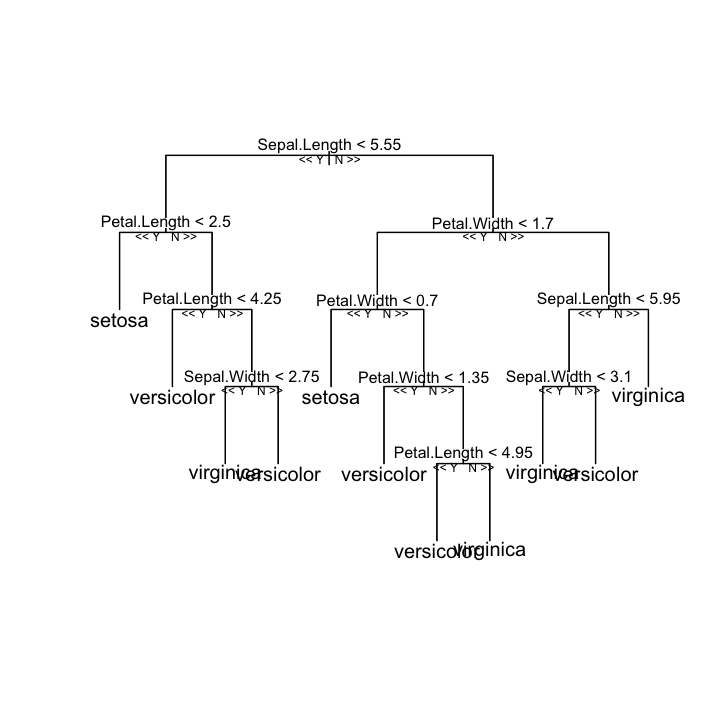

In [1193]:
library(randomForest)
library(reprtree)

model <- randomForest(Species ~ ., data=iris, importance=TRUE, ntree=500, mtry = 2, do.trace=100)

reprtree:::plot.getTree(model)
model$terms
model
rf$terms
rf

#plotting function works great on classification trees (iris dataset)
#must be because of regression dataset?

In [163]:
## try random forest to classify into stages
require(randomForest)

#try forest on all genes, with ETU as a continuous response group
set.seed(1234)
print(date())
rf.k4.1 <- randomForest(x=t(vsdWF), y=coldata$K4_stage, ntree=1000)
rf.k4.2 <- randomForest(x=t(vsdWF), y=coldata$K4_stage, ntree=2000)
rf.k4.3 <- randomForest(x=t(vsdWF), y=coldata$K4_stage, ntree=3000)
rf.k4.4 <- randomForest(x=t(vsdWF), y=coldata$K4_stage, ntree=4000)
rf.k4.5 <- randomForest(x=t(vsdWF), y=coldata$K4_stage, ntree=5000)
rf.k4.6 <- randomForest(x=t(vsdWF), y=coldata$K4_stage, ntree=6000)
rf.k4.7 <- randomForest(x=t(vsdWF), y=coldata$K4_stage, ntree=7000)
rf.k4.8 <- randomForest(x=t(vsdWF), y=coldata$K4_stage, ntree=8000)
rf.k4.9 <- randomForest(x=t(vsdWF), y=coldata$K4_stage, ntree=9000)
rf.k4.10 <- randomForest(x=t(vsdWF), y=coldata$K4_stage, ntree=10000)
print(date())

[1] "Thu Feb 15 11:19:11 2018"
[1] "Thu Feb 15 11:39:56 2018"


In [164]:
print(rf.k4.1);print(rf.k4.2);print(rf.k4.3);print(rf.k4.4);print(rf.k4.5)
print(rf.k4.6);print(rf.k4.7);print(rf.k4.8);print(rf.k4.9);print(rf.k4.10)


Call:
 randomForest(x = t(vsdWF), y = coldata$K4_stage, ntree = 1000) 
               Type of random forest: classification
                     Number of trees: 1000
No. of variables tried at each split: 150

        OOB estimate of  error rate: 8.51%
Confusion matrix:
  1  2  3 4 class.error
1 0  3  0 0   1.0000000
2 0 16  0 0   0.0000000
3 0  0 21 0   0.0000000
4 0  0  1 6   0.1428571

Call:
 randomForest(x = t(vsdWF), y = coldata$K4_stage, ntree = 2000) 
               Type of random forest: classification
                     Number of trees: 2000
No. of variables tried at each split: 150

        OOB estimate of  error rate: 8.51%
Confusion matrix:
  1  2  3 4 class.error
1 0  3  0 0   1.0000000
2 0 16  0 0   0.0000000
3 0  0 21 0   0.0000000
4 0  0  1 6   0.1428571

Call:
 randomForest(x = t(vsdWF), y = coldata$K4_stage, ntree = 3000) 
               Type of random forest: classification
                     Number of trees: 3000
No. of variables tried at each split: 150

     

mtry = 1  OOB error = 17.02% 
Searching left ...
Searching right ...
mtry = 2 	OOB error = 10.64% 
0.375 0.001 
mtry = 4 	OOB error = 8.51% 
0.2 0.001 
mtry = 8 	OOB error = 8.51% 
0 0.001 
      mtry   OOBError
1.OOB    1 0.17021277
2.OOB    2 0.10638298
4.OOB    4 0.08510638
8.OOB    8 0.08510638
4.OOB 8.OOB 
    4     8 


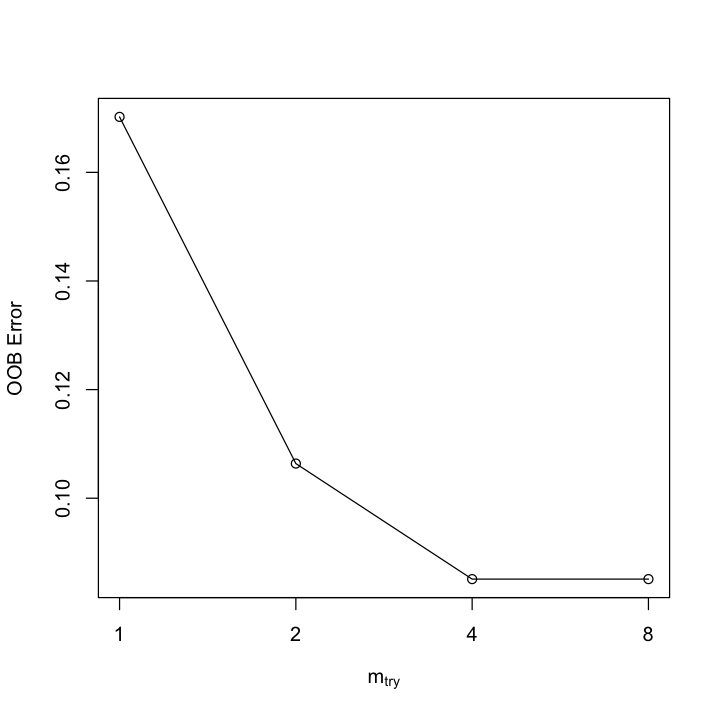

In [172]:
require(randomForest)
mtry <- tuneRF(x=t(vsdWF), y=coldata$K4_stage, ntreeTry=1000, mtryStart=1,
               stepFactor=2,improve=0.001, trace=TRUE, plot=TRUE)
best.m <- mtry[mtry[, 2] == min(mtry[, 2]), 1]
print(mtry)
print(best.m)

In [86]:
require(randomForest)

#try forest on all genes, with K4 class as factors
set.seed(1234)
print(date())
rf.k4 <- randomForest(x=t(vsdWF), y=coldata$K4_stage, ntree=1000, mtry=4, importance=T)
print(date())

Loading required package: randomForest
Warning message:
“package ‘randomForest’ was built under R version 3.4.4”randomForest 4.6-14
Type rfNews() to see new features/changes/bug fixes.

Attaching package: ‘randomForest’

The following object is masked from ‘package:dplyr’:

    combine

The following object is masked from ‘package:ggplot2’:

    margin

The following object is masked from ‘package:Biobase’:

    combine

The following object is masked from ‘package:BiocGenerics’:

    combine



[1] "Wed Apr 17 17:46:29 2019"


ERROR: Error in t(vsdWF): object 'vsdWF' not found


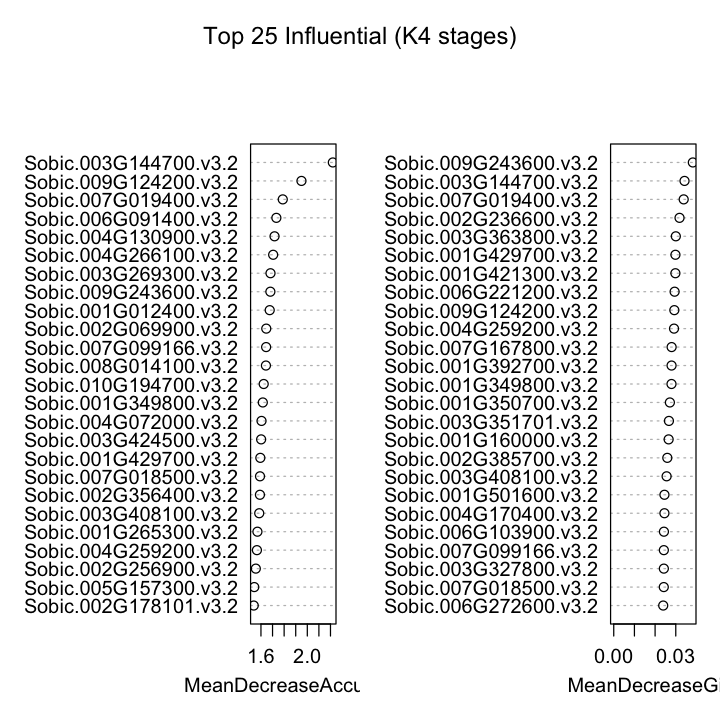

In [180]:
varImpPlot(rf.k4, n.var=25, main="Top 25 Influential (K4 stages)")

In [182]:
#extract influence metrics from random forest generation
influence <- importance(rf.k4)
head(influence)
#order by error and output
head(influence[order(influence[,5], decreasing=T),])
influence.order <- influence[order(influence[,5], decreasing=T),]
write.table(influence.order, 
            file="./deseq/randomForest_k4_vsd_3s.5c.txt", sep="\t", quote=F)

,1,2,3,4,MeanDecreaseAccuracy,MeanDecreaseGini
Sobic.001G000100.v3.2,0,0,0,0,0,0.000000000
Sobic.001G000200.v3.2,0,0,0,0,0,0.000000000
Sobic.001G000400.v3.2,0,0,0,0,0,0.003384615
Sobic.001G000700.v3.2,0,0,0,0,0,0.000000000
Sobic.001G000800.v3.2,0,0,0,0,0,0.000000000
Sobic.001G000900.v3.2,0,0,0,0,0,0.000000000


,1,2,3,4,MeanDecreaseAccuracy,MeanDecreaseGini
Sobic.003G144700.v3.2,0,1.700201,1.632418,1.2659242,2.220331,0.03423084
Sobic.009G124200.v3.2,0,1.614236,1.896566,0.0000000,1.949501,0.02929915
Sobic.007G019400.v3.2,0,1.693486,1.566936,1.2659242,1.788149,0.03382647
Sobic.006G091400.v3.2,0,0.000000,1.396331,1.6735969,1.732862,0.01926993
Sobic.004G130900.v3.2,0,1.641992,1.000500,1.0005004,1.717134,0.01259629
Sobic.004G266100.v3.2,0,1.308812,1.712182,0.4472583,1.705321,0.01673661


In [183]:
summary(rf.k4)
rf.k4

                Length Class  Mode     
call                 6 -none- call     
type                 1 -none- character
predicted           47 factor numeric  
err.rate          5000 -none- numeric  
confusion           20 -none- numeric  
votes              188 matrix numeric  
oob.times           47 -none- numeric  
classes              4 -none- character
importance      136530 -none- numeric  
importanceSD    113775 -none- numeric  
localImportance      0 -none- NULL     
proximity            0 -none- NULL     
ntree                1 -none- numeric  
mtry                 1 -none- numeric  
forest              14 -none- list     
y                   47 factor numeric  
test                 0 -none- NULL     
inbag                0 -none- NULL     


Call:
 randomForest(x = t(vsdWF), y = coldata$K4_stage, ntree = 1000,      mtry = 4, importance = T) 
               Type of random forest: classification
                     Number of trees: 1000
No. of variables tried at each split: 4

        OOB estimate of  error rate: 8.51%
Confusion matrix:
  1  2  3 4 class.error
1 0  3  0 0   1.0000000
2 0 16  0 0   0.0000000
3 0  0 21 0   0.0000000
4 0  0  1 6   0.1428571

In [214]:
require(pROC)

predictions <- as.data.frame(predict(rf.k4, t(vsdWF), type = "prob"))

# predict class and then attach test class
predictions$predict <- names(predictions)[1:4][apply(predictions[,1:4], 1, which.max)]
predictions$observed <- coldata$K4_stage
head(predictions)

,1,2,3,4,predict,observed
SHSL001_01_S1.count.txt,0.007,0.024,0.134,0.835,4,4
SHSL001_02_S2.count.txt,0.009,0.066,0.137,0.788,4,4
SHSL001_03_S3.count.txt,0.009,0.020,0.169,0.802,4,4
SHSL001_04_S4.count.txt,0.004,0.027,0.155,0.814,4,4
SHSL001_05_S5.count.txt,0.017,0.061,0.110,0.812,4,4
SHSL001_06_S6.count.txt,0.009,0.026,0.125,0.840,4,4


[1] "4"    "4"    "4"    "4"    "4"    "4"    "4"    "not4" "not4" "not4"
[11] "not4" "not4" "not4" "not4" "not4" "not4" "not4" "not4" "not4" "not4"
[21] "not4" "not4" "not4" "not4" "not4" "not4" "not4" "not4" "not4" "not4"
[31] "not4" "not4" "not4" "not4" "not4" "not4" "not4" "not4" "not4" "not4"
[41] "not4" "not4" "not4" "not4" "not4" "not4" "not4"

[1] 0.835 0.788 0.802 0.814 0.812 0.840 0.771 0.052 0.062 0.068 0.123 0.026
[13] 0.031 0.065 0.037 0.047 0.053 0.052 0.032 0.017 0.035 0.027 0.017 0.009
[25] 0.018 0.039 0.016 0.030 0.017 0.021 0.026 0.018 0.020 0.012 0.029 0.010
[37] 0.017 0.013 0.020 0.014 0.032 0.045 0.039 0.060 0.029 0.050 0.021

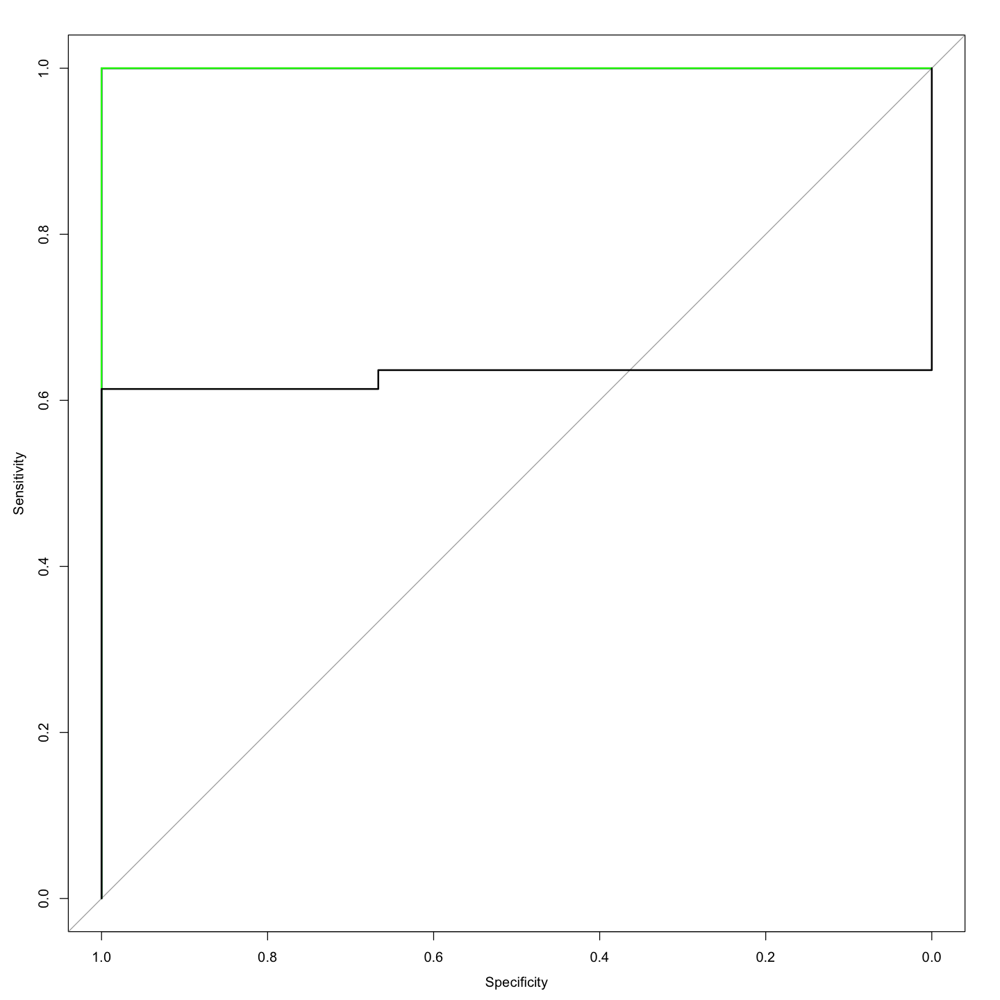

In [222]:
# 1 ROC curve, mock vs non mock
roc.4 <- roc(ifelse(predictions$observed=="4","4","not4"), as.numeric(predictions[,4]))
plot(roc.4, col = "red")
roc.3 <- roc(ifelse(predictions$observed=="3","3","not3"), as.numeric(predictions[,3]))
lines(roc.3, col = "blue")
roc.2 <- roc(ifelse(predictions$observed=="2","2","not2"), as.numeric(predictions[,2]))
lines(roc.2, col = "green")
roc.1 <- roc(ifelse(predictions$observed=="1","1","not1"), as.numeric(predictions[,2]))
lines(roc.1, col = "black")


In [85]:
#Try different subsets of total stage mean scaled values by forest walk importance
#top 2500 genes for classifying k=4 stages
res <- stage_mean[rownames(head(influence.order,2500)),]
cpm <- data.matrix(res)

ERROR: Error in eval(expr, envir, enclos): object 'stage_mean' not found


In [84]:
require(kohonen)
require(reshape)
require(colorRamps)
require(ggplot2)

# use the kohonen package to create a 'grid' of nodes
# empirically test the largest grid you can produce without any empty nodes

som_grid <- somgrid(xdim=10, ydim=10, topo="hexagonal")

# run the clustering algorithm, rlen = number of iterations, alpha = decaying learning rate

som_model <- som(cpm, grid=som_grid, rlen=50000, alpha=c(0.15,0.01), keep.data = TRUE)

Loading required package: kohonen
Warning message:
“package ‘kohonen’ was built under R version 3.4.4”
Attaching package: ‘kohonen’

The following object is masked from ‘package:purrr’:

    map

Loading required package: colorRamps


ERROR: Error in check.data(data): object 'cpm' not found


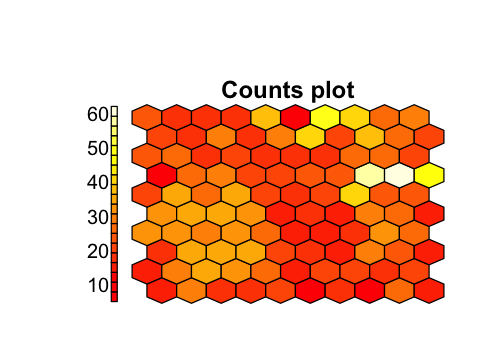

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
      5      18      23      25      30      62 

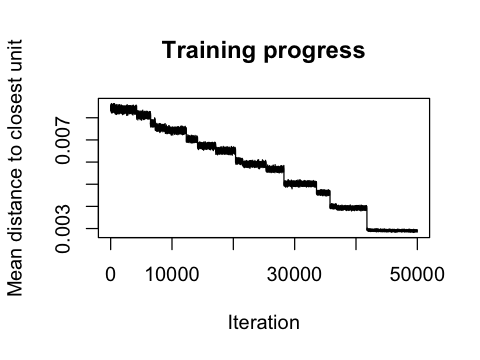

In [197]:
# might be fun to check some of the kohonen object diagnostic plots
# try one type at a type
options(repr.plot.width=4, repr.plot.height=3)
som_counts <- plot(som_model, type = "counts", shape = "straight")
plot(som_model, type = "changes")

summary(som_counts)

In [ ]:
som_result <- read.table(file="./SOM_randomF2500_10x10_FEB01.txt", sep="\t", header=T)

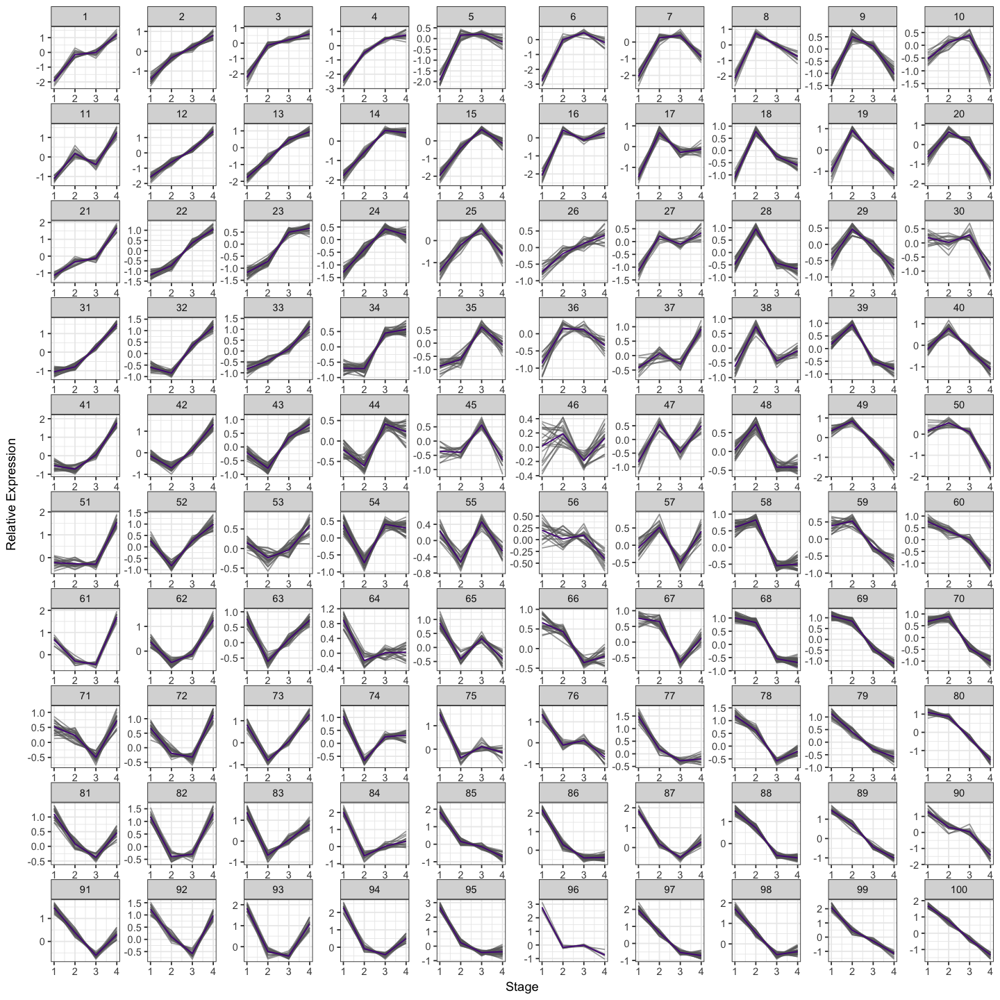

In [198]:
# extract and plot the data, but first write to file

som_result <- cbind(cpm, as.factor(som_model$unit.classif))
colnames(som_result)[ncol(som_result)] <- "Node"  # change last column name to Node
write.table(som_result, file="SOM_randomF2500_10x10_FEB01.txt", sep="\t", quote=F)

# as a heatmap (dendrogram optional: dendrogram = c("both","row","column","none"))

#som_sorted <- som_result[order(som_result[,ncol(som_result)]),]
#som_colors <- primary.colors(length(levels(as.factor(som_model$unit.classif))))[som_result[,ncol(som_result)]]
#heatmap.2(t(som_result[,ncol(som_result)]), Rowv=F, Colv=F, scale="column", ColSideColors=som_colors, trace="none", col="topo.colors")

# as line graphs (this one was hard to code)


node_values <- som_model$codes[[1]] #the 'codes' data.frame created by the kohonen package contains all the node values
rownames(node_values) <- c(1:nrow(som_model$codes[[1]]))  #very ugly way to make clean rownames
#colnames(node_values) <- temp$ETU #change names to ETU values
node <- melt(node_values, varnames=c("Node", "Stage"))  #separate node names and values to a long, value-by-value format
colnames(node)[3] <- "CPM" # add back label for CPM values

#colnames(cpm) <- temp$ETU #change names to ETU values
somplot <- melt(as.matrix(cpm), varnames=c("GeneID", "Stage"))
somplot <- cbind(somplot, som_result[,ncol(som_result)][as.character(somplot[,1])]) #look up Node in som_result by GeneID in somplot
colnames(somplot)[3:4] <- c("CPM", "Node")

#pdf(file="som_linegraph.pdf", wi=9, he=9)
# try one type at a type
options(repr.plot.width=12, repr.plot.height=12)
ggplot(data = somplot, aes(x=Stage, y=CPM, group=GeneID, color=as.factor(Node))) + 
	geom_line(color="grey40", alpha=0.6) + 
	geom_line(data = node, aes(x=Stage, y=CPM, group=Node), color = "purple4") + 
	theme_bw() + 
    theme(panel.spacing= unit(1, "points")) +
	facet_wrap(~Node, scales="free") + 
	ylab("Relative Expression")
#dev.off()


In [59]:
som_result <- read.table(file="./SOM_randomF2500_10x10_FEB01.txt", sep="\t", header=T)

In [60]:
head(som_result)

,X4,X3,X2,X1,Node
Sobic.003G144700.v3.2,-0.03517215,-0.6717753,0.4227467,2.5298460,95
Sobic.009G124200.v3.2,0.92224422,0.5548004,-0.9227371,-1.1142413,22
Sobic.007G019400.v3.2,-1.34303183,-0.4652780,0.8958632,1.6127502,100
Sobic.006G091400.v3.2,-1.56252220,-0.1204951,0.7236869,0.6296872,49
Sobic.004G130900.v3.2,1.31592471,0.3401291,-0.7590479,-1.4031395,12
Sobic.004G266100.v3.2,0.05237891,0.6878399,-0.8079918,-0.6278069,35


In [83]:
library(tidyverse)
library(reshape)

node_name <- cbind('geneid' = rownames(som_result), 'node' = som_result$Node)
head(node_name)

som_result[,1:4] %>% as.matrix() %>% melt(.,varnames=c("GeneID", "Stage")) %>% head()
melted_som <- som_result[,1:4] %>% as.matrix() %>% melt(.,varnames=c("GeneID", "Stage"))

melted_som %>% as.tibble() %>% left_join( as.tibble(node_name), by = c( "GeneID"="geneid" ) ) %>% head()
som_plot <- melted_som %>% as.tibble() %>% left_join( as.tibble(node_name), by = c( "GeneID"="geneid" ) )

geneid,node
Sobic.003G144700.v3.2,95
Sobic.009G124200.v3.2,22
Sobic.007G019400.v3.2,100
Sobic.006G091400.v3.2,49
Sobic.004G130900.v3.2,12
Sobic.004G266100.v3.2,35


GeneID,Stage,value
Sobic.003G144700.v3.2,X4,-0.03517215
Sobic.009G124200.v3.2,X4,0.92224422
Sobic.007G019400.v3.2,X4,-1.34303183
Sobic.006G091400.v3.2,X4,-1.56252220
Sobic.004G130900.v3.2,X4,1.31592471
Sobic.004G266100.v3.2,X4,0.05237891


Warning message:
“Column `GeneID`/`geneid` joining factor and character vector, coercing into character vector”

GeneID,Stage,value,node
Sobic.003G144700.v3.2,X4,-0.03517215,95
Sobic.009G124200.v3.2,X4,0.92224422,22
Sobic.007G019400.v3.2,X4,-1.34303183,100
Sobic.006G091400.v3.2,X4,-1.56252220,49
Sobic.004G130900.v3.2,X4,1.31592471,12
Sobic.004G266100.v3.2,X4,0.05237891,35


Warning message:
“Column `GeneID`/`geneid` joining factor and character vector, coercing into character vector”

In [ ]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(data = som_plot, aes(x=Stage, y=value, group=GeneID)) + 
	geom_line(color="grey40", alpha=0.6) + 
	geom_line(data = node, aes(x=Stage, y=CPM, group=Node), color = "purple4") + 
	theme_bw() + 
    theme(panel.spacing= unit(1, "points")) +
	facet_wrap(~Node, scales="free") + 
	ylab("Relative Expression")

In [ ]:
# as line graphs (this one was hard to code)


node_values <- som_model$codes[[1]] #the 'codes' data.frame created by the kohonen package contains all the node values
rownames(node_values) <- c(1:nrow(som_model$codes[[1]]))  #very ugly way to make clean rownames
#colnames(node_values) <- temp$ETU #change names to ETU values
node <- melt(node_values, varnames=c("Node", "Stage"))  #separate node names and values to a long, value-by-value format
colnames(node)[3] <- "CPM" # add back label for CPM values

#colnames(cpm) <- temp$ETU #change names to ETU values
somplot <- melt(as.matrix(cpm), varnames=c("GeneID", "Stage"))
somplot <- cbind(somplot, som_result[,ncol(som_result)][as.character(somplot[,1])]) #look up Node in som_result by GeneID in somplot
colnames(somplot)[3:4] <- c("CPM", "Node")

#pdf(file="som_linegraph.pdf", wi=9, he=9)
# try one type at a type
options(repr.plot.width=12, repr.plot.height=12)
ggplot(data = somplot, aes(x=Stage, y=CPM, group=GeneID, color=as.factor(Node))) + 
	geom_line(color="grey40", alpha=0.6) + 
	geom_line(data = node, aes(x=Stage, y=CPM, group=Node), color = "purple4") + 
	theme_bw() + 
    theme(panel.spacing= unit(1, "points")) +
	facet_wrap(~Node, scales="free") + 
	ylab("Relative Expression")

In [1239]:
#Could these be markers?
forest.marker <- read.table(text=
"GRMZM2G136750	GRMZM2G136750
GRMZM2G001223	myb126
GRMZM2G178753	LLRKL
GRMZM2G035243	KELCH
GRMZM2G020148	TLCL
AC197377.3_FG001	AC197377.3_FG001
GRMZM2G122337	fdx1
GRMZM2G138268	iaa10
GRMZM2G141707	TRXzL
GRMZM2G126260	pin10
GRMZM2G131409	SVBL
GRMZM2G111666	GRMZM2G111666
GRMZM2G110295	gata23
GRMZM2G151087	PEPL
GRMZM2G147266	fer2
GRMZM2G027068	bhlh48
GRMZM2G096486	VAMP726L
GRMZM2G131969	BRO1L
GRMZM2G061126	GRMZM2G061126
GRMZM2G412161	GRMZM2G412161
GRMZM2G474555	GRMZM2G474555
AC202864.3_FG002	gata25
GRMZM2G142097	GRMZM2G142097
GRMZM5G808847	AXR1
GRMZM2G175076	GRMZM2G175076
GRMZM2G141277	GRMZM2G141277
GRMZM2G021687	psa2
GRMZM5G805387	zmm18
GRMZM2G018375	thi1
GRMZM2G098063	abi4
GRMZM2G001241	LTL1L
GRMZM2G173536	GRMZM2G173536
GRMZM2G037452	GRMZM2G037452
GRMZM2G169005	GRMZM2G169005
GRMZM2G113340	GRMZM2G113340
GRMZM2G117531	GRMZM2G117531
GRMZM2G066612	TH9
GRMZM2G142664	GRMZM2G142664
GRMZM2G160838	myb32
GRMZM2G004012	umc1431
GRMZM2G123204	ADSSL
GRMZM2G036217	msh1
GRMZM2G337113	gpa1
GRMZM2G377663	GRMZM2G377663
GRMZM2G121360	GRMZM2G121360
GRMZM2G329144	GPX4L
GRMZM2G093731	GRMZM2G093731
GRMZM2G084806	MRH1L
GRMZM2G458974	GRMZM2G458974
GRMZM5G873519	GRMZM5G873519
GRMZM2G140915	CYP75B1
GRMZM2G119769	GRMZM2G119769
GRMZM2G162305	GRMZM2G162305
GRMZM2G036120	ENTHL
GRMZM2G100349	L18aeL
GRMZM2G316275	SAURL", sep="\t", header=F)


In [1240]:
for (marker in 1:nrow(forest.marker)) {
    plotGene( as.character(forest.marker[marker,1]) , as.character(forest.marker[marker,2]) )
}

In [227]:
#create Stage K=4 model matrix and test add to DESeq object
coldata$K4_stage
stage1 <- unlist(lapply(coldata$K4_stage, function(x) ifelse(x!=1,'not',x)))
stage2 <- unlist(lapply(coldata$K4_stage, function(x) ifelse(x!=2,'not',x)))
stage3 <- unlist(lapply(coldata$K4_stage, function(x) ifelse(x!=3,'not',x)))
stage4 <- unlist(lapply(coldata$K4_stage, function(x) ifelse(x!=4,'not',x)))
stage_libs <- cbind(rownames(coldata),stage1,stage2,stage3,stage4)
head(stage_libs)

[1] 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 2 3 3 2 2 3 3 3 3 3 2 2 2 2 2 2 2 2 2
[39] 2 2 3 2 2 3 1 1 1
Levels: 1 2 3 4

,stage1,stage2,stage3,stage4
SHSL001_01_S1.count.txt,not,not,not,4
SHSL001_02_S2.count.txt,not,not,not,4
SHSL001_03_S3.count.txt,not,not,not,4
SHSL001_04_S4.count.txt,not,not,not,4
SHSL001_05_S5.count.txt,not,not,not,4
SHSL001_06_S6.count.txt,not,not,not,4


In [228]:
#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = stage_libs,
                                design = ~ stage1,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)

using pre-existing size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 466 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


[1] "Intercept" "stage11"   "stage1not"

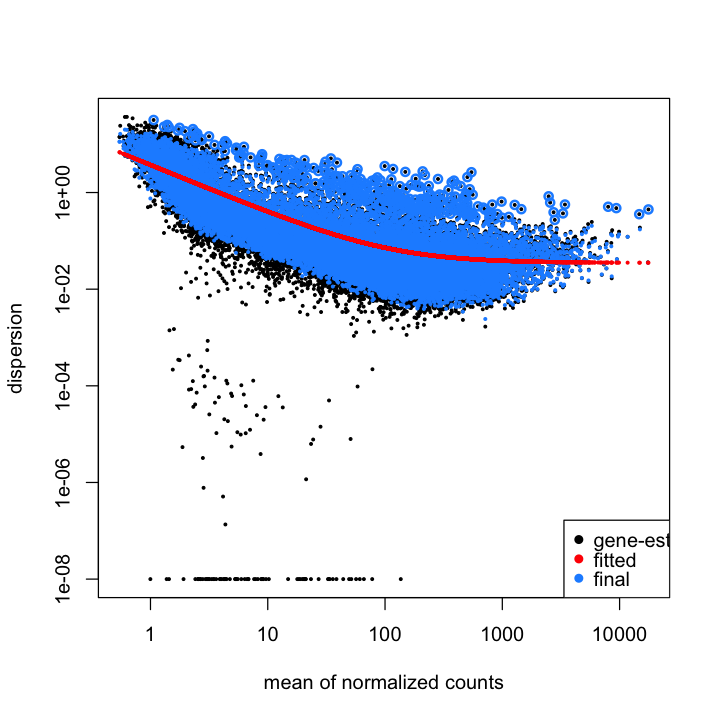

In [229]:
#How about stage-unique / DE genes?
#Compare 1 stage to all others

options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)
res1 <- results(ddsWF, contrast=c("stage1","1","not"), alpha=0.05)


out of 22755 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 3720, 16% 
LFC < 0 (down)   : 2297, 10% 
outliers [1]     : 354, 1.6% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



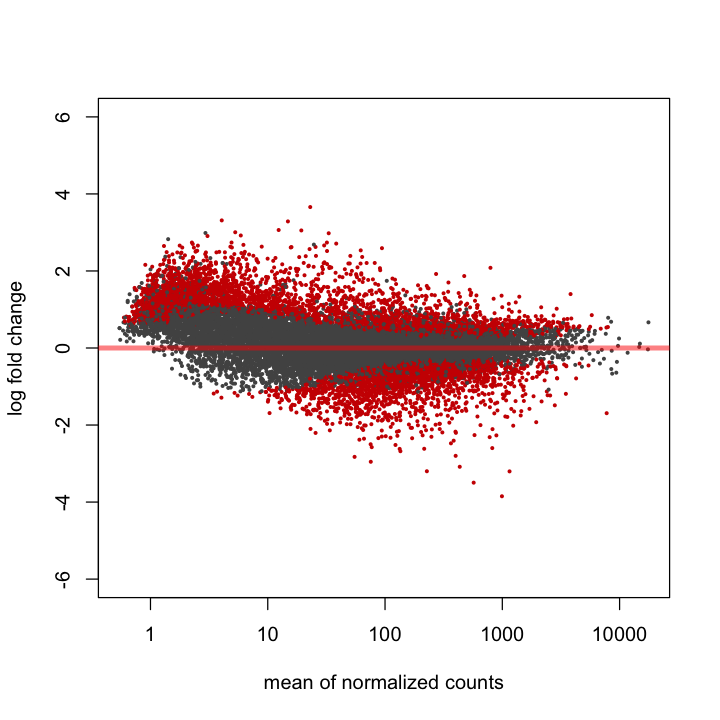

In [230]:
summary(res1);
plotMA(res1,ylim=c(-6,6));

In [231]:
#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = stage_libs,
                                design = ~ stage2,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)

using pre-existing size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 207 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


[1] "Intercept" "stage22"   "stage2not"

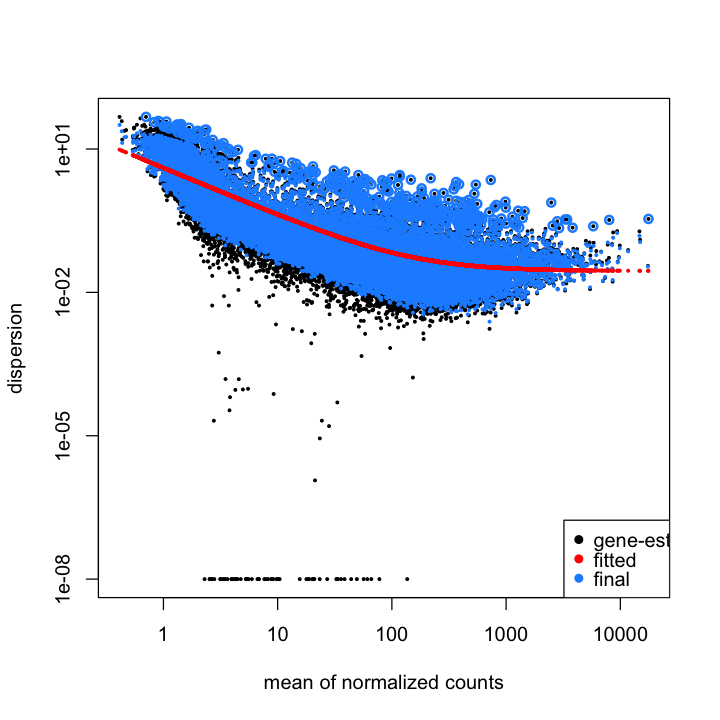

In [232]:
#How about stage-unique / DE genes?
#Compare 1 stage to all others

options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)
res2 <- results(ddsWF, contrast=c("stage2","2","not"), alpha=0.05)


out of 22755 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 4803, 21% 
LFC < 0 (down)   : 5028, 22% 
outliers [1]     : 0, 0% 
low counts [2]   : 0, 0% 
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



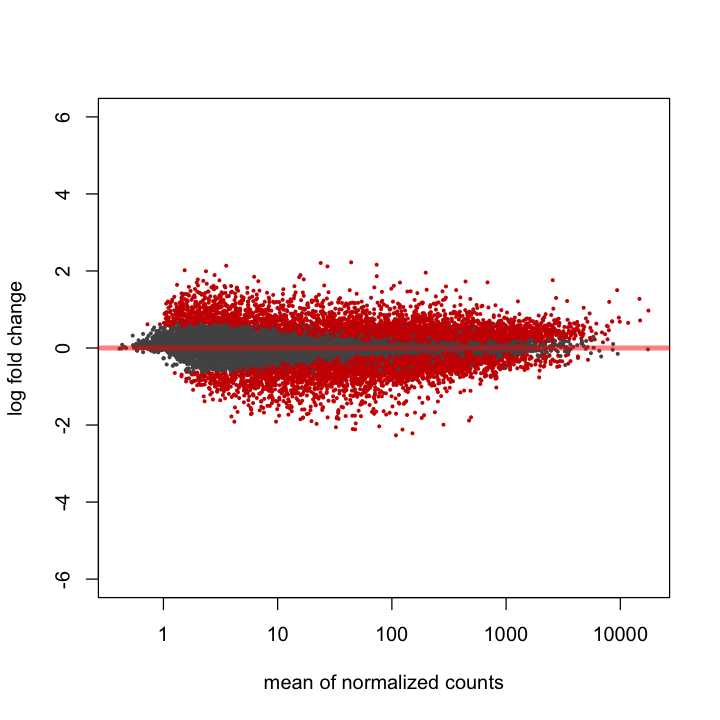

In [233]:
summary(res2);
plotMA(res2,ylim=c(-6,6));

In [234]:
#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = stage_libs,
                                design = ~ stage3,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)

using pre-existing size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 119 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


[1] "Intercept" "stage33"   "stage3not"

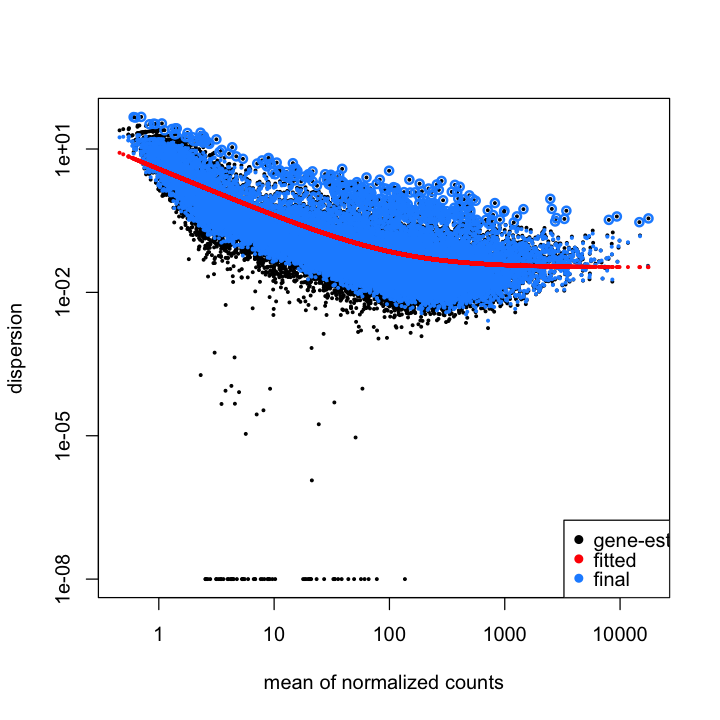

In [235]:
#How about stage-unique / DE genes?
#Compare 1 stage to all others

options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)
res3 <- results(ddsWF, contrast=c("stage3","3","not"), alpha=0.05)


out of 22755 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 2203, 9.7% 
LFC < 0 (down)   : 4499, 20% 
outliers [1]     : 0, 0% 
low counts [2]   : 0, 0% 
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



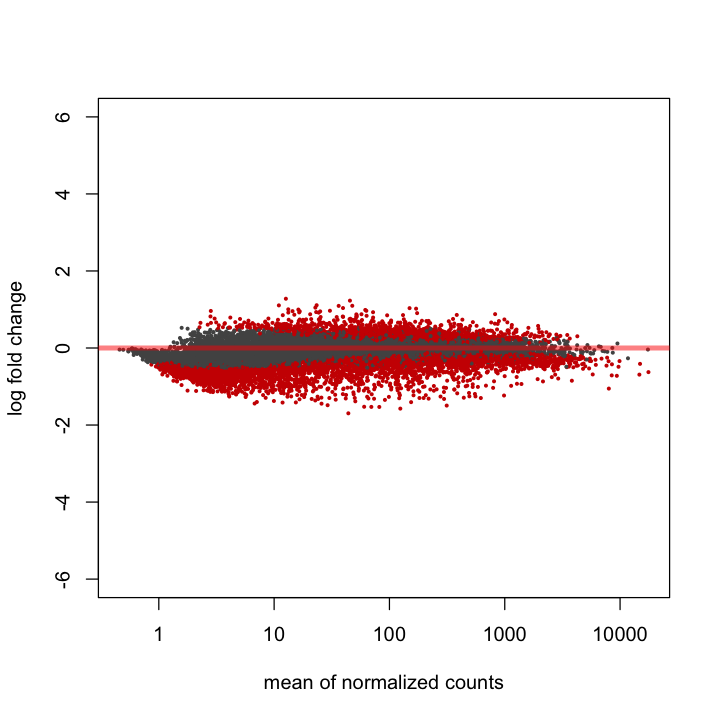

In [236]:
summary(res3);
plotMA(res3,ylim=c(-6,6));

In [237]:
#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = stage_libs,
                                design = ~ stage4,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)

using pre-existing size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 93 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


[1] "Intercept" "stage44"   "stage4not"

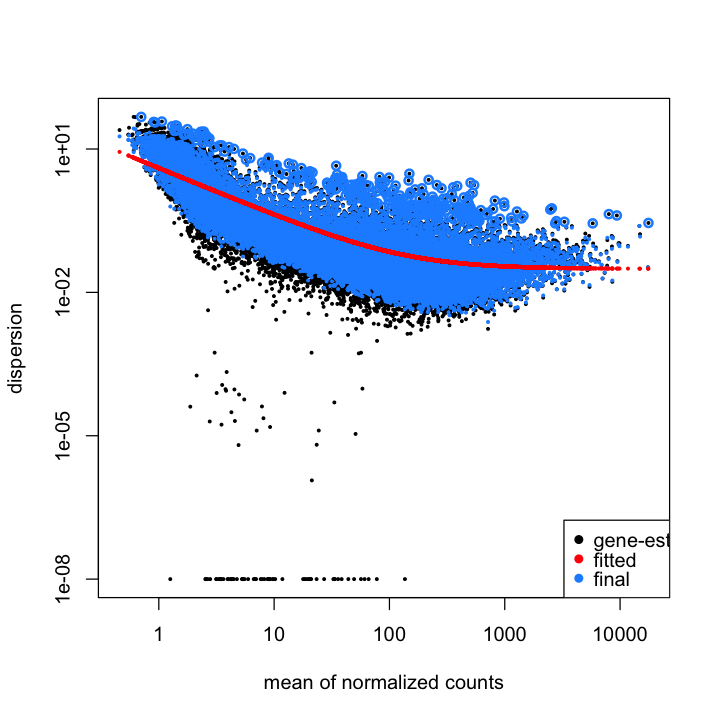

In [238]:
#How about stage-unique / DE genes?
#Compare 1 stage to all others

options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)
res4 <- results(ddsWF, contrast=c("stage4","4","not"), alpha=0.05)


out of 22755 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 3442, 15% 
LFC < 0 (down)   : 3753, 16% 
outliers [1]     : 0, 0% 
low counts [2]   : 883, 3.9% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



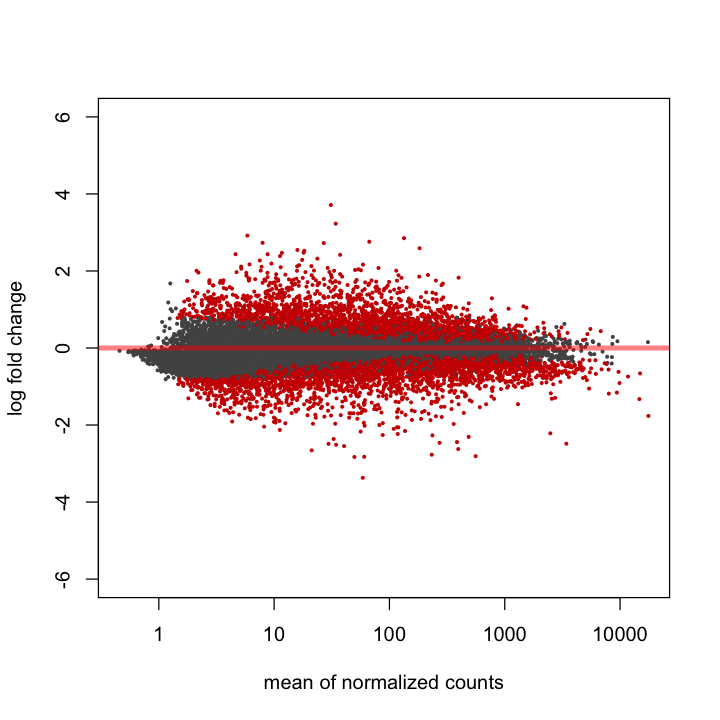

In [239]:
summary(res4);
plotMA(res4,ylim=c(-6,6));

In [240]:
stage_DE.res <- cbind(res1,res2,res3,res4)
#export as TSV
write.table(as.data.frame(stage_DE.res), 
            file="./deseq/stageDE_3s.5c.txt",
            sep="\t", quote=F)

Ok well that's *confusing*
maybe I'll try to predict Eveland et al. tassel ages using the RFs from above

In [1311]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/P4_RNAseq/network_analysis/counts/RA_realign", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/P4_RNAseq/network_analysis/counts/RA_realign", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

ra.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(ra.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
ra.counts <- cbind(ra.counts, new_file) # add on the new column
colnames(ra.counts) <- c(file_names[1:f]) # add on the new column's name
}

ra.count <- head(ra.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [1312]:
dim (ra.count); head (ra.count)

[1] 39469     6

,SRR999038.count.txt,SRR999039.count.txt,SRR999040.count.txt,SRR999041.count.txt,SRR999042.count.txt,SRR999043.count.txt
AC148152.3_FG001,0,0,0,0,0,0
AC148152.3_FG005,0,4,4,14,16,46
AC148152.3_FG006,0,0,0,0,0,0
AC148152.3_FG008,4,0,0,2,18,21
AC148167.6_FG001,1102,1264,1080,759,1544,2331
AC149475.2_FG002,1903,1636,1879,693,1320,1251


In [1318]:
#create a VSD dataset to match DESeq filtering criteria
dds.ra <- DESeqDataSetFromMatrix(countData = ra.count,
                                colData = data.frame(colnames(ra.count)),
                                design = ~ 1,
                                tidy = F)
dds.ra <- estimateSizeFactors(dds.ra)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.ra <- estimateDispersions(dds.ra)
vsd.ra <- varianceStabilizingTransformation(dds.ra)
vsdRA <- assay(vsd.ra)


gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [224]:
rf.ra.ETU <- predict(rf, t(vsdRA),  type = "prob",
                     predict.all=T, nodes=T)

ERROR: Error in predict.randomForest(rf, t(vsdRA), type = "prob", predict.all = T, : 'prob' or 'vote' not meaningful for regression


In [1324]:
summary(rf.ra.ETU)

           Length Class  Mode   
aggregate       6 -none- numeric
individual 600000 -none- numeric

In [1325]:
rf.ra.ETU$aggregate

SRR999038.count.txt SRR999039.count.txt SRR999040.count.txt SRR999041.count.txt 
           4.454449            4.956477            4.923779            6.178073 
SRR999042.count.txt SRR999043.count.txt 
           6.612183            6.910463

## OMG I THINK IT WORKS

In [223]:
rf.ra.K5 <- predict(rf.k5, t(vsdRA),  type = "prob",
                   predict.all=T, nodes=T)

ERROR: Error in predict(rf.k5, t(vsdRA), type = "prob", predict.all = T, nodes = T): object 'rf.k5' not found


In [1327]:
summary(rf.ra.K5)

           Length Class  Mode     
aggregate       6 factor numeric  
individual 600000 -none- character

In [1328]:
rf.ra.K5$aggregate

SRR999038.count.txt SRR999039.count.txt SRR999040.count.txt SRR999041.count.txt 
                  1                   1                   1                   5 
SRR999042.count.txt SRR999043.count.txt 
                  5                   5 
Levels: 1 2 3 4 5

In [1329]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/BD1_RNAseq/counts", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/BD1_RNAseq/counts", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

bd.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(bd.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
bd.counts <- cbind(bd.counts, new_file) # add on the new column
colnames(bd.counts) <- c(file_names[1:f]) # add on the new column's name
}

bd.count <- head(bd.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [1333]:
#create a VSD dataset to match DESeq filtering criteria
dds.bd <- DESeqDataSetFromMatrix(countData = bd.count,
                                colData = data.frame(colnames(bd.count)),
                                design = ~ 1,
                                tidy = F)
dds.bd <- estimateSizeFactors(dds.bd)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.bd <- estimateDispersions(dds.bd)
vsd.bd <- varianceStabilizingTransformation(dds.bd)
vsdBD <- assay(vsd.bd)


gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [1334]:
rf.bd.ETU <- predict(rf, t(vsdBD), type="response",
                     predict.all=T, nodes=T)

In [1335]:
summary(rf.bd.ETU)
rf.bd.ETU$aggregate

           Length Class  Mode   
aggregate       6 -none- numeric
individual 600000 -none- numeric

bd_mutant_replicate1.raw_count.txt bd_mutant_replicate2.raw_count.txt 
                          5.390508                           4.842102 
bd_mutant_replicate3.raw_count.txt        WT_replicate1.raw_count.txt 
                          5.454733                           4.120580 
       WT_replicate2.raw_count.txt        WT_replicate3.raw_count.txt 
                          3.842962                           4.055833

In [1336]:
rf.bd.K5 <- predict(rf.k5, t(vsdBD), type="response",
                   predict.all=T, nodes=T)

In [1337]:
summary(rf.bd.K5)
rf.bd.K5$aggregate

           Length Class  Mode     
aggregate       6 factor numeric  
individual 600000 -none- character

bd_mutant_replicate1.raw_count.txt bd_mutant_replicate2.raw_count.txt 
                                 5                                  5 
bd_mutant_replicate3.raw_count.txt        WT_replicate1.raw_count.txt 
                                 5                                  3 
       WT_replicate2.raw_count.txt        WT_replicate3.raw_count.txt 
                                 3                                  3 
Levels: 1 2 3 4 5

In [1340]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/WAB_rnaseq/htseq", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/WAB_rnaseq/htseq", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

WAB.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(WAB.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
WAB.counts <- cbind(WAB.counts, new_file) # add on the new column
colnames(WAB.counts) <- c(file_names[1:f]) # add on the new column's name
}

WAB.count <- head(WAB.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [1341]:
#create a VSD dataset to match DESeq filtering criteria
dds.wab <- DESeqDataSetFromMatrix(countData = WAB.count,
                                colData = data.frame(colnames(WAB.count)),
                                design = ~ 1,
                                tidy = F)
dds.wab <- estimateSizeFactors(dds.wab)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.wab <- estimateDispersions(dds.wab)
vsd.wab <- varianceStabilizingTransformation(dds.wab)
vsdWAB <- assay(vsd.wab)


gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [1342]:
rf.wab.ETU <- predict(rf, t(vsdWAB), type="response",
                     predict.all=T, nodes=T)

In [1343]:
summary(rf.wab.ETU)
rf.wab.ETU$aggregate

           Length  Class  Mode   
aggregate       15 -none- numeric
individual 1500000 -none- numeric

A.count.txt B.count.txt C.count.txt D.count.txt E.count.txt F.count.txt 
   3.758649    3.755174    4.260321    3.925726    3.849088    4.111073 
G.count.txt H.count.txt I.count.txt J.count.txt K.count.txt L.count.txt 
   4.849373    4.590289    5.237396    5.028648    5.441817    4.643798 
M.count.txt N.count.txt O.count.txt 
   4.568341    4.632774    4.589752

In [1344]:
rf.wab.K5 <- predict(rf.k5, t(vsdWAB), type="response",
                     predict.all=T, nodes=T)

summary(rf.wab.K5)
rf.wab.K5$aggregate

           Length  Class  Mode     
aggregate       15 factor numeric  
individual 1500000 -none- character

A.count.txt B.count.txt C.count.txt D.count.txt E.count.txt F.count.txt 
          1           1           3           1           1           1 
G.count.txt H.count.txt I.count.txt J.count.txt K.count.txt L.count.txt 
          4           4           4           4           4           4 
M.count.txt N.count.txt O.count.txt 
          4           4           3 
Levels: 1 2 3 4 5

In [1345]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/Ts5/RNAseq/htseq", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/Ts5/RNAseq/htseq", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

ts5.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(ts5.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
ts5.counts <- cbind(ts5.counts, new_file) # add on the new column
colnames(ts5.counts) <- c(file_names[1:f]) # add on the new column's name
}

ts5.count <- head(ts5.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."


In [1347]:
#create a VSD dataset to match DESeq filtering criteria
dds.ts5 <- DESeqDataSetFromMatrix(countData = ts5.count,
                                colData = data.frame(colnames(ts5.count)),
                                design = ~ 1,
                                tidy = F)
dds.ts5 <- estimateSizeFactors(dds.ts5)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.ts5 <- estimateDispersions(dds.ts5)
vsd.ts5 <- varianceStabilizingTransformation(dds.ts5)
vsdTS5 <- assay(vsd.ts5)


gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [1369]:
rf.ts5.ETU <- predict(rf, t(vsdTS5), type="response",
                     predict.all=T, nodes=T)

summary(rf.ts5.ETU)
rf.ts5.ETU$aggregate
pred.rf.int <- t(apply( rf.ts5.ETU$individual, 1, function(x){ 
  c( mean(x) + c(-1.96,1.96)*sd(x), quantile(x, c(0.025,0.975)) )}))

pred.rf.int

pred.rf.int2 <- sapply(1:3, function(i) {
   tmp <- rf.ts5.ETU$individual[i,] + rnorm(100000, 0, sqrt(rf$mse))
   quantile(tmp, c(0.025, 0.975))
   })
t(pred.rf.int2)

           Length Class  Mode   
aggregate       3 -none- numeric
individual 300000 -none- numeric

Normal.raw_count.txt    TsA.raw_count.txt    TsB.raw_count.txt 
            6.814735             6.686297             6.700426

,,,2.5%,97.5%
Normal.raw_count.txt,1.630409,11.99906,1.005,9.71
TsA.raw_count.txt,1.417070,11.95552,0.830,9.71
TsB.raw_count.txt,1.451513,11.94934,0.830,9.71


2.5%,97.5%
0.9469065,10.51092
0.8846516,10.50198
0.9275474,10.48918


In [1349]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/FUN_RNAseq/htseq", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/FUN_RNAseq/htseq", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

fun.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(fun.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
fun.counts <- cbind(fun.counts, new_file) # add on the new column
colnames(fun.counts) <- c(file_names[1:f]) # add on the new column's name
}

fun.count <- head(fun.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [1350]:
#create a VSD dataset to match DESeq filtering criteria
dds.fun <- DESeqDataSetFromMatrix(countData = fun.count,
                                colData = data.frame(colnames(fun.count)),
                                design = ~ 1,
                                tidy = F)
dds.fun <- estimateSizeFactors(dds.fun)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.fun <- estimateDispersions(dds.fun)
vsd.fun <- varianceStabilizingTransformation(dds.fun)
vsdFUN <- assay(vsd.fun)


gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [1366]:
rf.fun.ETU <- predict(rf, t(vsdFUN), type="response",
                     predict.all=T, nodes=T)

summary(rf.fun.ETU)
rf.fun.ETU$aggregate
pred.rf.int <- t(apply( rf.fun.ETU$individual, 1, function(x){ 
  c( mean(x) + c(-1.96,1.96)*sd(x), quantile(x, c(0.025,0.975)) )}))

pred.rf.int

pred.rf.int2 <- sapply(1:4, function(i) {
   tmp <- rf.fun.ETU$individual[i,] + rnorm(1000, 0, sqrt(rf$mse))
   quantile(tmp, c(0.025, 0.975))
   })
t(pred.rf.int2)

           Length Class  Mode   
aggregate       4 -none- numeric
individual 400000 -none- numeric

A.raw_count.txt B.raw_count.txt C.raw_count.txt D.raw_count.txt 
       6.686377        6.662171        6.572277        6.599662

,,,2.5%,97.5%
A.raw_count.txt,1.453303,11.91945,0.8179500,9.71
B.raw_count.txt,1.414713,11.90963,0.7249250,9.71
C.raw_count.txt,1.281887,11.86267,0.5760000,9.71
D.raw_count.txt,1.301024,11.89830,0.5566667,9.71


2.5%,97.5%
0.8620330,10.51778
0.7850867,10.54465
0.7442200,10.45031
0.7754504,10.55422


In [1354]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/P4_RNAseq/network_analysis/counts/P7", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/P4_RNAseq/network_analysis/counts/P7", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

p7.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(p7.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
p7.counts <- cbind(p7.counts, new_file) # add on the new column
colnames(p7.counts) <- c(file_names[1:f]) # add on the new column's name
}

p7.count <- head(p7.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [1356]:
#create a VSD dataset to match DESeq filtering criteria
dds.p7 <- DESeqDataSetFromMatrix(countData = p7.count,
                                colData = data.frame(colnames(p7.count)),
                                design = ~ 1,
                                tidy = F)
dds.p7 <- estimateSizeFactors(dds.p7)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.p7 <- estimateDispersions(dds.p7)
vsd.p7 <- varianceStabilizingTransformation(dds.p7)
vsdP7 <- assay(vsd.p7)

gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [1363]:
rf.p7.ETU <- predict(rf, t(vsdP7), type="response",
                     predict.all=T, nodes=T)

summary(rf.p7.ETU)
rf.p7.ETU$aggregate
pred.rf.int <- t(apply( rf.p7.ETU$individual, 1, function(x){ 
  c( mean(x) + c(-1.96,1.96)*sd(x), quantile(x, c(0.025,0.975)) )}))

pred.rf.int

           Length  Class  Mode   
aggregate       18 -none- numeric
individual 1800000 -none- numeric

epP7_B_1.count.txt epP7_B_2.count.txt epP7_B_3.count.txt epP7_L_1.count.txt 
          4.249626           4.034293           4.123068           3.891763 
epP7_L_2.count.txt epP7_L_3.count.txt epP7_S_1.count.txt epP7_S_2.count.txt 
          4.117685           4.157978           4.399428           4.534916 
epP7_S_3.count.txt   P7_3_B.count.txt   P7_3_L.count.txt   P7_3_S.count.txt 
          4.533128           4.818235           4.758266           5.372647 
  P7_4_B.count.txt   P7_4_L.count.txt   P7_4_S.count.txt   P7_5_B.count.txt 
          4.971792           5.165145           5.153547           5.032431 
  P7_5_L.count.txt   P7_5_S.count.txt 
          5.005377           5.426116

,,,2.5%,97.5%
epP7_B_1.count.txt,-1.8002429,10.299495,0.010,9.650
epP7_B_2.count.txt,-1.9891596,10.057746,0.008,9.630
epP7_B_3.count.txt,-1.9371158,10.183252,0.010,9.642
epP7_L_1.count.txt,-2.0792039,9.862729,0.008,9.610
epP7_L_2.count.txt,-1.8872268,10.122598,0.010,9.630
epP7_L_3.count.txt,-1.8680477,10.184004,0.010,9.630
epP7_S_1.count.txt,-1.7087871,10.507642,0.010,9.650
epP7_S_2.count.txt,-1.6864782,10.756309,0.010,9.660
epP7_S_3.count.txt,-1.6194941,10.685749,0.010,9.660
P7_3_B.count.txt,-1.1012433,10.737713,0.040,9.670


In [1358]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/P4_RNAseq/network_analysis/counts/P4", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/P4_RNAseq/network_analysis/counts/P4", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

p4.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(p4.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
p4.counts <- cbind(p4.counts, new_file) # add on the new column
colnames(p4.counts) <- c(file_names[1:f]) # add on the new column's name
}

p4.count <- head(p4.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [1359]:
#create a VSD dataset to match DESeq filtering criteria
dds.p4 <- DESeqDataSetFromMatrix(countData = p4.count,
                                colData = data.frame(colnames(p4.count)),
                                design = ~ 1,
                                tidy = F)
dds.p4 <- estimateSizeFactors(dds.p4)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.p4 <- estimateDispersions(dds.p4)
vsd.p4 <- varianceStabilizingTransformation(dds.p4)
vsdP4 <- assay(vsd.p4)

gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [1397]:
rf.p4.ETU <- predict(rf, t(vsdP4), type="response",
                     predict.all=T, nodes=T)

summary(rf.p4.ETU)
rf.p4.ETU$aggregate
pred.rf.int <- t(apply( rf.p4.ETU$individual, 1, function(x){ 
  c( mean(x) + c(-1.96,1.96)*sd(x), quantile(x, c(0.025,0.975)) )}))

pred.rf.int

           Length Class  Mode   
aggregate      15 -none- numeric
individual 300000 -none- numeric

1A.count.txt 1B.count.txt 1C.count.txt 1D.count.txt 1E.count.txt 2A.count.txt 
    5.600582     5.960106     5.792097     5.585408     5.469156     5.836223 
2B.count.txt 2C.count.txt 2D.count.txt 2E.count.txt 3A.count.txt 3B.count.txt 
    5.744293     5.661745     5.500848     5.511178     6.381774     5.979304 
3C.count.txt 3D.count.txt 3E.count.txt 
    5.837803     5.723850     5.680866

,,,2.5%,97.5%
1A.count.txt,0.02981441,11.17135,0.2799500,9.690
1B.count.txt,0.46347725,11.45674,0.4000000,9.690
1C.count.txt,0.22656007,11.35763,0.3124375,9.690
1D.count.txt,-0.01702857,11.18785,0.2879250,9.690
1E.count.txt,-0.17576179,11.11407,0.2566667,9.690
2A.count.txt,0.25580432,11.41664,0.2840000,9.690
2B.count.txt,0.12682965,11.36176,0.2820000,9.690
2C.count.txt,0.02491962,11.29857,0.2325000,9.690
2D.count.txt,-0.18095444,11.18265,0.1999500,9.690
2E.count.txt,-0.20205495,11.22441,0.2020000,9.690


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


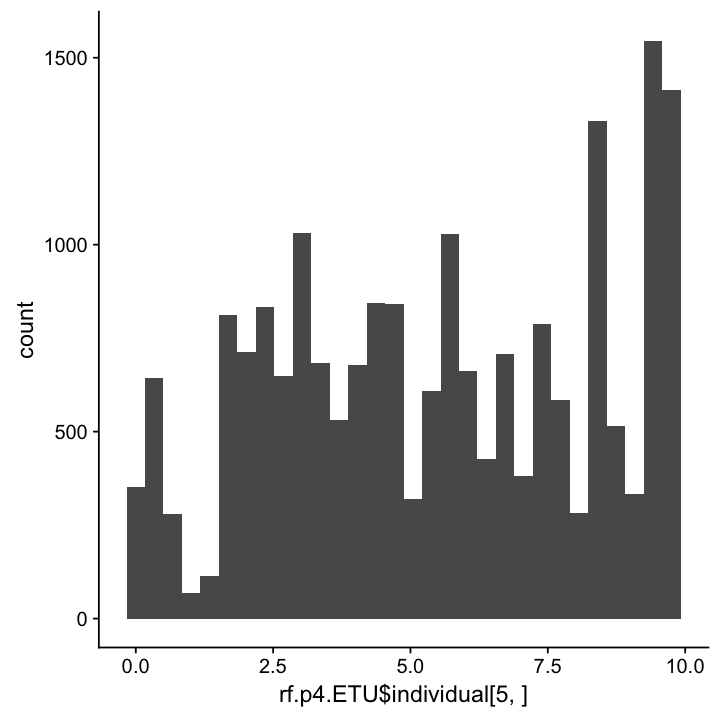

In [1398]:
qplot(rf.p4.ETU$individual[5,])

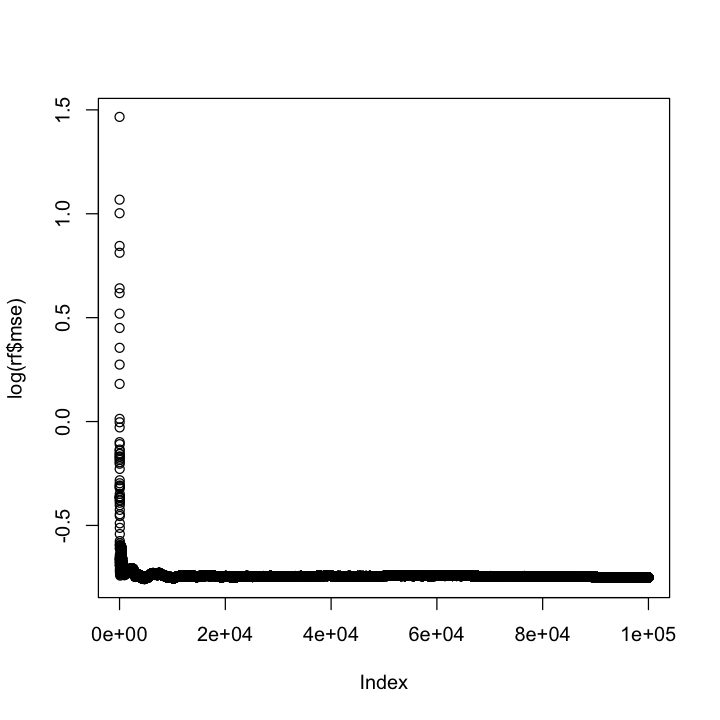

In [244]:
save.image(file="021918.RData")

In [6]:
load(file="021918.RData")